# Fitting DC2 v2 Simulation Data with MultiProFit - Free Sky Background Edition

This notebook plots results from fitting sources from the Vera Rubin Observatory/LSST Dark Energy Science Collaboration (DESC, https://lsstdesc.org/) DC2 simulations (http://lsstdesc.org/DC2-production/) using MultiProFit (https://github.com/lsst-dm/multiprofit, 'MPF'). Specifically, it reads the results of using a Task to fit exposures given an existing catalog with fits from meas_modelfit (https://github.com/lsst/meas_modelfit, 'MMF'). MMF implements a variant of the SDSS CModel algorithm (https://www.sdss.org/dr12/algorithms/magnitudes/#cmodel). In additional to CModel, MultiProFit allows for multi-band fitting, as well as fitting of Sersic profiles, multi-Gaussian approximations thereof ('MG' Sersic), and non-parametric radial profiles (Gaussian mixtures model with shared ellipse parameters, effectively having a Gaussian mixture radial profile). Thus, the main results are comparisons of the two codes doing basically the same thing (single-band exponential, de Vaucouleurs, and CModel linear combination fits), followed by plots highlighting Sersic vs CModel fits, more complicated double Sersic/free-amplitude models, and MultiProFit's multi-band fits.

In [1]:
# Import requirements
from lsst.daf.persistence import Butler
import matplotlib as mpl
import matplotlib.pyplot as plt
import modelling_research.dc2 as dc2
import modelling_research.meas_model as mrMeas
from modelling_research.calibrate import calibrate_catalogs
from modelling_research.plotting import plotjoint_running_percentiles
from modelling_research.plot_matches import plot_matches
import numpy as np
import seaborn as sns
from timeit import default_timer as timer

In [2]:
# Setup for plotting
%matplotlib inline
sns.set_style('darkgrid')
mpl.rcParams['figure.dpi'] = 160
mpl.rcParams['image.origin'] = 'lower'
sns.set(rc={'axes.facecolor': '0.85', 'figure.facecolor': 'w'})

In [3]:
# Catalog matching settings
# Reference band to match on. Should be 'r' for DC2 because reasons (truth refcats are r mag limited)
band_ref = 'r'

In [4]:
# Load the truth catalogs and count all of the rows
butler_ref = dc2.get_refcat(make=False)

In [5]:
# Load the DC2 repo butlers: we'll need them later
butlers_dc2 = {
    '2.2i': Butler('/datasets/DC2/repoRun2.2i/rerun/w_2020_03/DM-22816/'),
}

In [6]:
# Match with the refcat using astropy's matcher
truth_path = dc2.get_truth_path()
tracts = {3828: (f'{truth_path}2020-04-06-freebg-parfp/', '2.2i'),}
filters_single = ('g', 'r', 'i')
filters_multi = ('gri',)
patch_max = 7
# Calibrate catalogs: this only needs to be done once; get_cmodel_forced should only be true for single bands for reasons
calibrate_cats = True
get_ngmix = False
get_cmodel_forced = False
if calibrate_cats:
    butler_ngmix_gri = Butler('/project/dtaranu/dc2/ngmix/gri') if get_ngmix else None
    path = tracts[3828][0]
    for bands in filters_single + filters_multi:
        files = [f'{path}{bands}/mpf_dc2_{bands}_3828_{x},{y}.fits' for x in range(patch_max) for y in range (patch_max)]
        cats = calibrate_catalogs(files, butlers_dc2, is_dc2=True, files_ngmix=butler_ngmix_gri,
                                  get_cmodel_forced=get_cmodel_forced and (len(bands) == 1))
cats = dc2.match_refcat_dc2(butler_ref, match_afw=False, tracts=tracts, butlers_dc2=butlers_dc2,
                            filters_single=filters_single, filters_multi=filters_multi)

ETA=Unknown; Calibrating /project/dtaranu/dc2/2020-04-06-freebg-parfp/g/mpf_dc2_g_3828_0,0.fits... Read in 3.2s
Calibrated /project/dtaranu/dc2/2020-04-06-freebg-parfp/g/mpf_dc2_g_3828_0,0_mag.fits in 4.1s
ETA=348.5s; Calibrating /project/dtaranu/dc2/2020-04-06-freebg-parfp/g/mpf_dc2_g_3828_0,1.fits... Read in 2.5s
Calibrated /project/dtaranu/dc2/2020-04-06-freebg-parfp/g/mpf_dc2_g_3828_0,1_mag.fits in 3.6s
ETA=314.7s; Calibrating /project/dtaranu/dc2/2020-04-06-freebg-parfp/g/mpf_dc2_g_3828_0,2.fits... Read in 3.2s
Calibrated /project/dtaranu/dc2/2020-04-06-freebg-parfp/g/mpf_dc2_g_3828_0,2_mag.fits in 4.0s
ETA=316.3s; Calibrating /project/dtaranu/dc2/2020-04-06-freebg-parfp/g/mpf_dc2_g_3828_0,3.fits... Read in 2.7s
Calibrated /project/dtaranu/dc2/2020-04-06-freebg-parfp/g/mpf_dc2_g_3828_0,3_mag.fits in 3.4s
ETA=300.9s; Calibrating /project/dtaranu/dc2/2020-04-06-freebg-parfp/g/mpf_dc2_g_3828_0,4.fits... Read in 3.3s
Calibrated /project/dtaranu/dc2/2020-04-06-freebg-parfp/g/mpf_dc2_g_

Calibrated /project/dtaranu/dc2/2020-04-06-freebg-parfp/g/mpf_dc2_g_3828_5,5_mag.fits in 3.6s
ETA=51.3s; Calibrating /project/dtaranu/dc2/2020-04-06-freebg-parfp/g/mpf_dc2_g_3828_5,6.fits... Read in 2.8s
Calibrated /project/dtaranu/dc2/2020-04-06-freebg-parfp/g/mpf_dc2_g_3828_5,6_mag.fits in 3.7s
ETA=44.9s; Calibrating /project/dtaranu/dc2/2020-04-06-freebg-parfp/g/mpf_dc2_g_3828_6,0.fits... Read in 1.9s
Calibrated /project/dtaranu/dc2/2020-04-06-freebg-parfp/g/mpf_dc2_g_3828_6,0_mag.fits in 3.7s
ETA=38.3s; Calibrating /project/dtaranu/dc2/2020-04-06-freebg-parfp/g/mpf_dc2_g_3828_6,1.fits... Read in 2.7s
Calibrated /project/dtaranu/dc2/2020-04-06-freebg-parfp/g/mpf_dc2_g_3828_6,1_mag.fits in 3.9s
ETA=32.0s; Calibrating /project/dtaranu/dc2/2020-04-06-freebg-parfp/g/mpf_dc2_g_3828_6,2.fits... Read in 1.7s
Calibrated /project/dtaranu/dc2/2020-04-06-freebg-parfp/g/mpf_dc2_g_3828_6,2_mag.fits in 3.8s
ETA=25.5s; Calibrating /project/dtaranu/dc2/2020-04-06-freebg-parfp/g/mpf_dc2_g_3828_6,3.f

Calibrated /project/dtaranu/dc2/2020-04-06-freebg-parfp/r/mpf_dc2_r_3828_4,4_mag.fits in 3.7s
ETA=101.6s; Calibrating /project/dtaranu/dc2/2020-04-06-freebg-parfp/r/mpf_dc2_r_3828_4,5.fits... Read in 3.0s
Calibrated /project/dtaranu/dc2/2020-04-06-freebg-parfp/r/mpf_dc2_r_3828_4,5_mag.fits in 3.7s
ETA=95.4s; Calibrating /project/dtaranu/dc2/2020-04-06-freebg-parfp/r/mpf_dc2_r_3828_4,6.fits... Read in 2.1s
Calibrated /project/dtaranu/dc2/2020-04-06-freebg-parfp/r/mpf_dc2_r_3828_4,6_mag.fits in 3.3s
ETA=88.7s; Calibrating /project/dtaranu/dc2/2020-04-06-freebg-parfp/r/mpf_dc2_r_3828_5,0.fits... Read in 3.3s
Calibrated /project/dtaranu/dc2/2020-04-06-freebg-parfp/r/mpf_dc2_r_3828_5,0_mag.fits in 3.7s
ETA=82.6s; Calibrating /project/dtaranu/dc2/2020-04-06-freebg-parfp/r/mpf_dc2_r_3828_5,1.fits... Read in 2.7s
Calibrated /project/dtaranu/dc2/2020-04-06-freebg-parfp/r/mpf_dc2_r_3828_5,1_mag.fits in 3.8s
ETA=76.3s; Calibrating /project/dtaranu/dc2/2020-04-06-freebg-parfp/r/mpf_dc2_r_3828_5,2.

Calibrated /project/dtaranu/dc2/2020-04-06-freebg-parfp/i/mpf_dc2_i_3828_3,3_mag.fits in 4.0s
ETA=150.9s; Calibrating /project/dtaranu/dc2/2020-04-06-freebg-parfp/i/mpf_dc2_i_3828_3,4.fits... Read in 2.9s
Calibrated /project/dtaranu/dc2/2020-04-06-freebg-parfp/i/mpf_dc2_i_3828_3,4_mag.fits in 3.9s
ETA=145.1s; Calibrating /project/dtaranu/dc2/2020-04-06-freebg-parfp/i/mpf_dc2_i_3828_3,5.fits... Read in 2.6s
Calibrated /project/dtaranu/dc2/2020-04-06-freebg-parfp/i/mpf_dc2_i_3828_3,5_mag.fits in 3.8s
ETA=138.8s; Calibrating /project/dtaranu/dc2/2020-04-06-freebg-parfp/i/mpf_dc2_i_3828_3,6.fits... Read in 2.0s
Calibrated /project/dtaranu/dc2/2020-04-06-freebg-parfp/i/mpf_dc2_i_3828_3,6_mag.fits in 3.6s
ETA=132.0s; Calibrating /project/dtaranu/dc2/2020-04-06-freebg-parfp/i/mpf_dc2_i_3828_4,0.fits... Read in 2.8s
Calibrated /project/dtaranu/dc2/2020-04-06-freebg-parfp/i/mpf_dc2_i_3828_4,0_mag.fits in 3.8s
ETA=125.9s; Calibrating /project/dtaranu/dc2/2020-04-06-freebg-parfp/i/mpf_dc2_i_3828_

Calibrated /project/dtaranu/dc2/2020-04-06-freebg-parfp/gri/mpf_dc2_gri_3828_2,1_mag.fits in 6.2s
ETA=292.0s; Calibrating /project/dtaranu/dc2/2020-04-06-freebg-parfp/gri/mpf_dc2_gri_3828_2,2.fits... Read in 2.1s
Calibrated /project/dtaranu/dc2/2020-04-06-freebg-parfp/gri/mpf_dc2_gri_3828_2,2_mag.fits in 6.3s
ETA=282.3s; Calibrating /project/dtaranu/dc2/2020-04-06-freebg-parfp/gri/mpf_dc2_gri_3828_2,3.fits... Read in 3.6s
Calibrated /project/dtaranu/dc2/2020-04-06-freebg-parfp/gri/mpf_dc2_gri_3828_2,3_mag.fits in 6.1s
ETA=275.0s; Calibrating /project/dtaranu/dc2/2020-04-06-freebg-parfp/gri/mpf_dc2_gri_3828_2,4.fits... Read in 2.3s
Calibrated /project/dtaranu/dc2/2020-04-06-freebg-parfp/gri/mpf_dc2_gri_3828_2,4_mag.fits in 6.2s
ETA=265.5s; Calibrating /project/dtaranu/dc2/2020-04-06-freebg-parfp/gri/mpf_dc2_gri_3828_2,5.fits... Read in 4.1s
Calibrated /project/dtaranu/dc2/2020-04-06-freebg-parfp/gri/mpf_dc2_gri_3828_2,5_mag.fits in 6.6s
ETA=259.4s; Calibrating /project/dtaranu/dc2/2020-

Loaded in 15.1s; loading 0,6 (7/49) and matching file=/project/dtaranu/dc2/2020-04-06-freebg-parfp/r/mpf_dc2_r_3828_0,6_mag.fits; len(cat,truth)=93039,746589
Loaded in 15.0s; loading 1,0 (8/49) and matching file=/project/dtaranu/dc2/2020-04-06-freebg-parfp/r/mpf_dc2_r_3828_1,0_mag.fits; len(cat,truth)=108070,854766
Loaded in 22.7s; loading 1,1 (9/49) and matching file=/project/dtaranu/dc2/2020-04-06-freebg-parfp/r/mpf_dc2_r_3828_1,1_mag.fits; len(cat,truth)=124959,959028
Loaded in 14.3s; loading 1,2 (10/49) and matching file=/project/dtaranu/dc2/2020-04-06-freebg-parfp/r/mpf_dc2_r_3828_1,2_mag.fits; len(cat,truth)=141821,1063770
Loaded in 14.2s; loading 1,3 (11/49) and matching file=/project/dtaranu/dc2/2020-04-06-freebg-parfp/r/mpf_dc2_r_3828_1,3_mag.fits; len(cat,truth)=157118,1164019
Loaded in 22.9s; loading 1,4 (12/49) and matching file=/project/dtaranu/dc2/2020-04-06-freebg-parfp/r/mpf_dc2_r_3828_1,4_mag.fits; len(cat,truth)=175253,1271011
Loaded in 57.1s; loading 1,5 (13/49) and 

Loaded in 2.8s; loading 1,2 (10/49) file=/project/dtaranu/dc2/2020-04-06-freebg-parfp/g/mpf_dc2_g_3828_1,2_mag.fits; len(cat,truth)=141821,5111088
Loaded in 2.3s; loading 1,3 (11/49) file=/project/dtaranu/dc2/2020-04-06-freebg-parfp/g/mpf_dc2_g_3828_1,3_mag.fits; len(cat,truth)=157118,5111088
Loaded in 2.4s; loading 1,4 (12/49) file=/project/dtaranu/dc2/2020-04-06-freebg-parfp/g/mpf_dc2_g_3828_1,4_mag.fits; len(cat,truth)=175253,5111088
Loaded in 3.9s; loading 1,5 (13/49) file=/project/dtaranu/dc2/2020-04-06-freebg-parfp/g/mpf_dc2_g_3828_1,5_mag.fits; len(cat,truth)=192214,5111088
Loaded in 3.6s; loading 1,6 (14/49) file=/project/dtaranu/dc2/2020-04-06-freebg-parfp/g/mpf_dc2_g_3828_1,6_mag.fits; len(cat,truth)=206482,5111088
Loaded in 3.2s; loading 2,0 (15/49) file=/project/dtaranu/dc2/2020-04-06-freebg-parfp/g/mpf_dc2_g_3828_2,0_mag.fits; len(cat,truth)=220810,5111088
Loaded in 3.3s; loading 2,1 (16/49) file=/project/dtaranu/dc2/2020-04-06-freebg-parfp/g/mpf_dc2_g_3828_2,1_mag.fits; l

Loaded in 3.2s; loading 2,2 (17/49) file=/project/dtaranu/dc2/2020-04-06-freebg-parfp/i/mpf_dc2_i_3828_2,2_mag.fits; len(cat,truth)=255070,5111088
Loaded in 2.8s; loading 2,3 (18/49) file=/project/dtaranu/dc2/2020-04-06-freebg-parfp/i/mpf_dc2_i_3828_2,3_mag.fits; len(cat,truth)=271030,5111088
Loaded in 3.1s; loading 2,4 (19/49) file=/project/dtaranu/dc2/2020-04-06-freebg-parfp/i/mpf_dc2_i_3828_2,4_mag.fits; len(cat,truth)=287797,5111088
Loaded in 3.3s; loading 2,5 (20/49) file=/project/dtaranu/dc2/2020-04-06-freebg-parfp/i/mpf_dc2_i_3828_2,5_mag.fits; len(cat,truth)=306032,5111088
Loaded in 3.7s; loading 2,6 (21/49) file=/project/dtaranu/dc2/2020-04-06-freebg-parfp/i/mpf_dc2_i_3828_2,6_mag.fits; len(cat,truth)=320890,5111088
Loaded in 2.1s; loading 3,0 (22/49) file=/project/dtaranu/dc2/2020-04-06-freebg-parfp/i/mpf_dc2_i_3828_3,0_mag.fits; len(cat,truth)=334820,5111088
Loaded in 2.8s; loading 3,1 (23/49) file=/project/dtaranu/dc2/2020-04-06-freebg-parfp/i/mpf_dc2_i_3828_3,1_mag.fits; l

Loaded in 3.4s; loading 3,1 (23/49) file=/project/dtaranu/dc2/2020-04-06-freebg-parfp/gri/mpf_dc2_gri_3828_3,1_mag.fits; len(cat,truth)=350438,5111088
Loaded in 4.0s; loading 3,2 (24/49) file=/project/dtaranu/dc2/2020-04-06-freebg-parfp/gri/mpf_dc2_gri_3828_3,2_mag.fits; len(cat,truth)=367900,5111088
Loaded in 3.7s; loading 3,3 (25/49) file=/project/dtaranu/dc2/2020-04-06-freebg-parfp/gri/mpf_dc2_gri_3828_3,3_mag.fits; len(cat,truth)=385067,5111088
Loaded in 3.7s; loading 3,4 (26/49) file=/project/dtaranu/dc2/2020-04-06-freebg-parfp/gri/mpf_dc2_gri_3828_3,4_mag.fits; len(cat,truth)=401677,5111088
Loaded in 3.1s; loading 3,5 (27/49) file=/project/dtaranu/dc2/2020-04-06-freebg-parfp/gri/mpf_dc2_gri_3828_3,5_mag.fits; len(cat,truth)=418375,5111088
Loaded in 3.5s; loading 3,6 (28/49) file=/project/dtaranu/dc2/2020-04-06-freebg-parfp/gri/mpf_dc2_gri_3828_3,6_mag.fits; len(cat,truth)=431972,5111088
Loaded in 3.5s; loading 4,0 (29/49) file=/project/dtaranu/dc2/2020-04-06-freebg-parfp/gri/mpf_

## Crossmatch against reference catalog

All of the plots in this notebook compare stack measurements of sources measured by the LSST Science Pipelines cross-matched against a reference catalog that is part of the Science Pipelines repository. This reference catalog contains all sources brighter than 23 mags in r, and was generated through some kind of Task that must have read the original DC2 truth tables (more on that below).

In [8]:
# Model plot setup
# ngmix takes out a pixel scale factor of 2.5*log10(0.2**2)
# TODO: remove this offset when fixed in ngmix
offset_ngmix = -3.4948500216800937
model_specs = [
    ('PSF', 'base_PsfFlux', 0),
    ('stack CModel', 'modelfit_CModel', 0),
    ('forced CModel', 'modelfit_forced_CModel', 0),
] if get_cmodel_forced else []
model_specs.extend([
    ('MPF CModel', 'multiprofit_mg8cmodelpx', 2),
    ('MPF Sersic', 'multiprofit_mg8serbpx', 1),
    ('MPF Sersic Free Amp.', 'multiprofit_mg8serbapx', 8),
    ('MPF Sersic x 2', 'multiprofit_mg8serx2sepx', 2),
    ('MPF Sersic x 2 Free Amp.', 'multiprofit_mg8serx2seapx', 16),
])
if get_ngmix:
    model_specs.append(('ngmix bd', 'ngmix_bd', 0))

models = {
    desc: mrMeas.Model(desc, field, n_comps, mag_offset=offset_ngmix if mrMeas.is_field_ngmix(field) else None)
    for desc, field, n_comps in model_specs
}

models_stars = ['PSF', 'stack CModel'] if get_cmodel_forced else []
models_stars.extend(['MPF CModel', 'MPF Sersic'])
if get_ngmix:
    models_stars.append('ngmix bd')

models_stars = {model: models[model] for model in models_stars}

args = dict(scatterleft=True, scatterright=True,)
args_type = {
    'resolved': {
        'limx': (14.5, 24.5),
        'limy': (-0.6, 0.4),
    },
    'unresolved': {
        'limx': (16, 23),
        'limy': (-0.08, 0.06),
    },
}
band_multi = filters_multi[0]
mpl.rcParams['axes.labelsize'] = 15

## Galaxy fluxes and colours

These plots show fluxes and colours for a variety of models, separately for DC2.1.1 (tract 3832) and DC2.2 (tract 3828).

Quick summary:

1. Bright and faint galaxies alike are a challenge, with large scatter in the former and a negative (model too bright) bias in the latter.
    - This is not very surprising; bright galaxies are more likely to be blended, but model mismatch shouldn't be as much of an issue here. Some kind of bias and scatter at the faint end is not surprising either, though how much and in which direction is not so clear.
2. Colours have considerably less scatter, even for single-band fits; that is, even though bright galaxies have differences much larger than expected from noise bias alone, these are about the same in each band.
    - This is somewhat encouraging if not unexpected. It's not entirely a trivial result for g-r as it is for r-i (for low redshift galaxies anyways).
3. There is at best a modest improvement from meas_modelfit (mmf) CModel to MultiProFit (mpf) CModel. The main differences here are: free centroids for mpf vs fixed in mmf; slightly different Sersic approximation (more so for dev than exp); double Gaussian vs double Shapelet PSF in mpf vs mmf (the latter ought to be better); size prior in mmf; different optimizers; analytic vs finite difference gradients in mpf vs mmf. Of all of those differences, the free centroids are most likely to provide the (modest) benefit, if any.
    - This is a more or less neutral result; I woudln't expect much difference between the two for any of the possible reasons.
4. There is a slightly more substantial improvment for single-band fluxes from CModel to Sersic; in particular, the distribution of galaxies with overestimated fluxes is tighter.
    - This is also somewhat encouraging. We know that CModel is a kludge, but it's not trivial for slightly-but-not-entirely-more-principled Sersic fits to peform better.
5. Nearly everything is improved by fitting gri simultaneously - magnitudes, colours, etc. all have tigher scatter no matter the model or band. While the improvements in one-sigma scatter for magnitudes are not necessarily large, the 2+sigma scatter is significantly tighter, as are colours.
    - This is very encouraging and non-trivial; one could have imagined galaxies with non-detections in some bands to have more biased measurements in the bands with detections, but that doesn't seem to be the case very often. Of course it's at least partly expected since the morphology of the galaxy is identical in all bands in single-component models, but the fact that this improves colours substantially without making magnitudes worse is a major bonus.

N=0 sky object matches
Rematched 6260/5100291; 454857 originally and 448468 rematched already matched
N=0sky object matches after rematching
DC2 3828 Resolved g-band, MPF CModel, N=79636


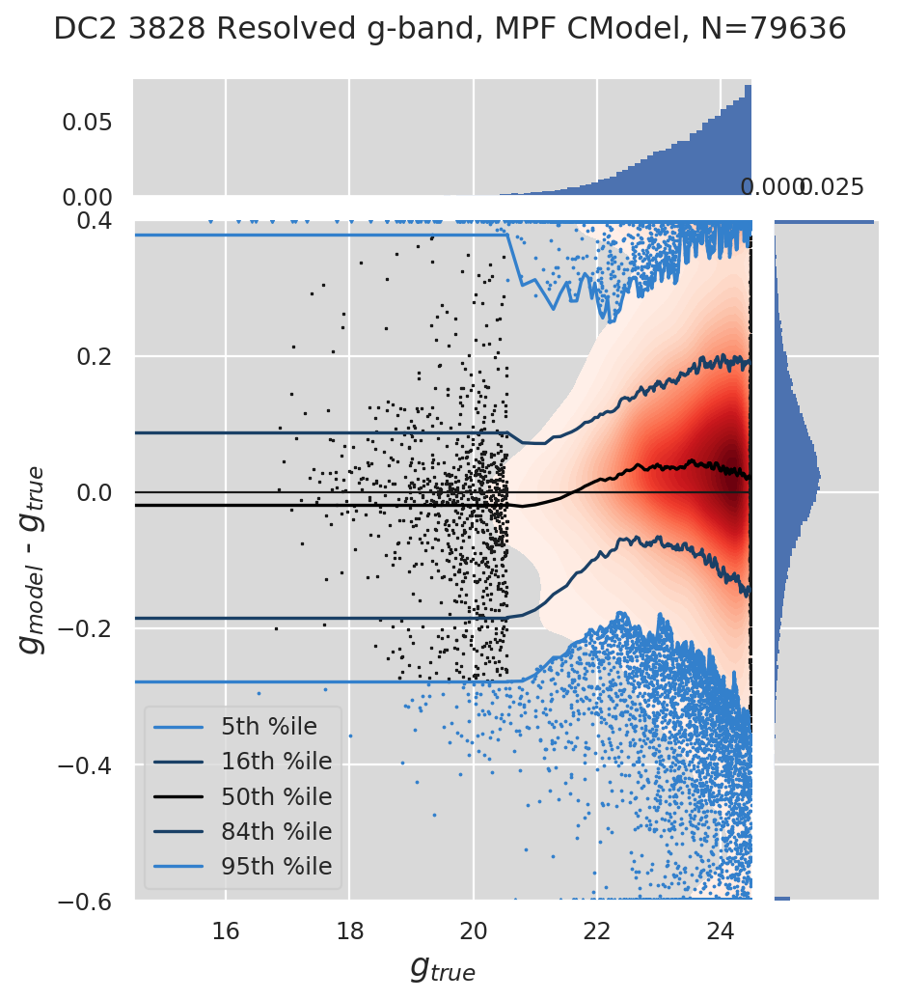

DC2 3828 Resolved g-band, MPF CModel(gri), N=84818


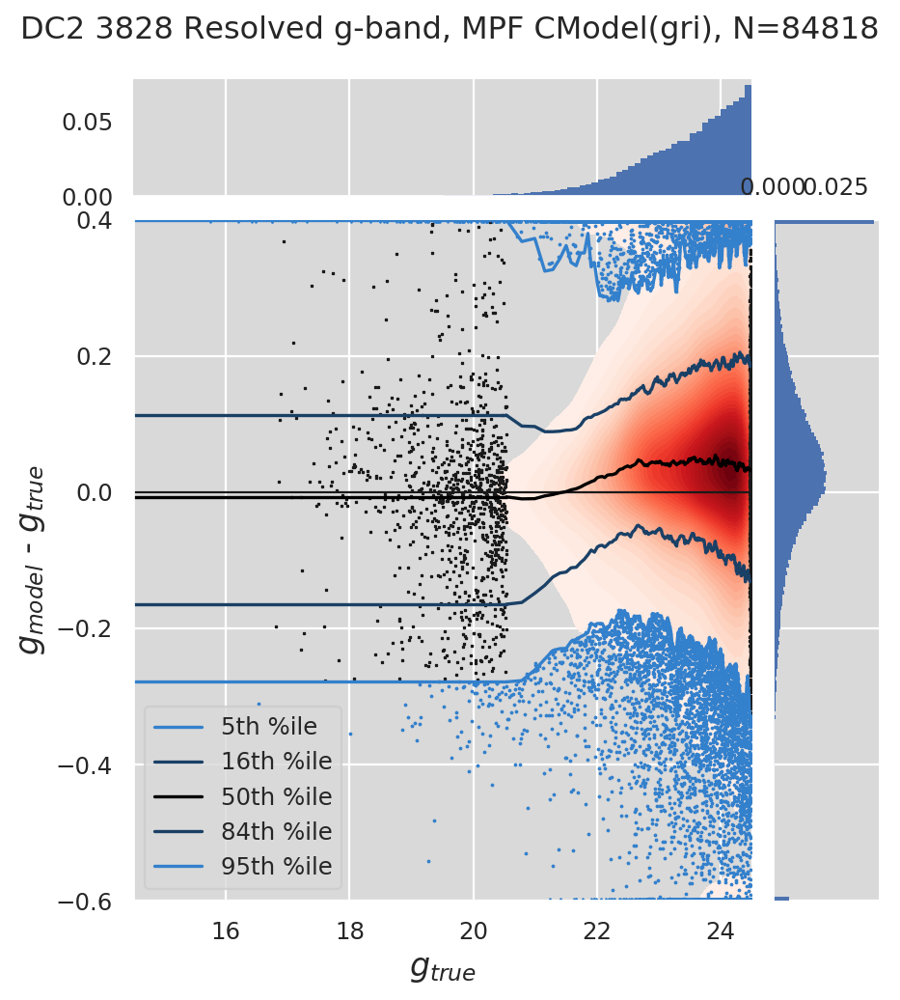

DC2 3828 Resolved r-band, MPF CModel, N=121818


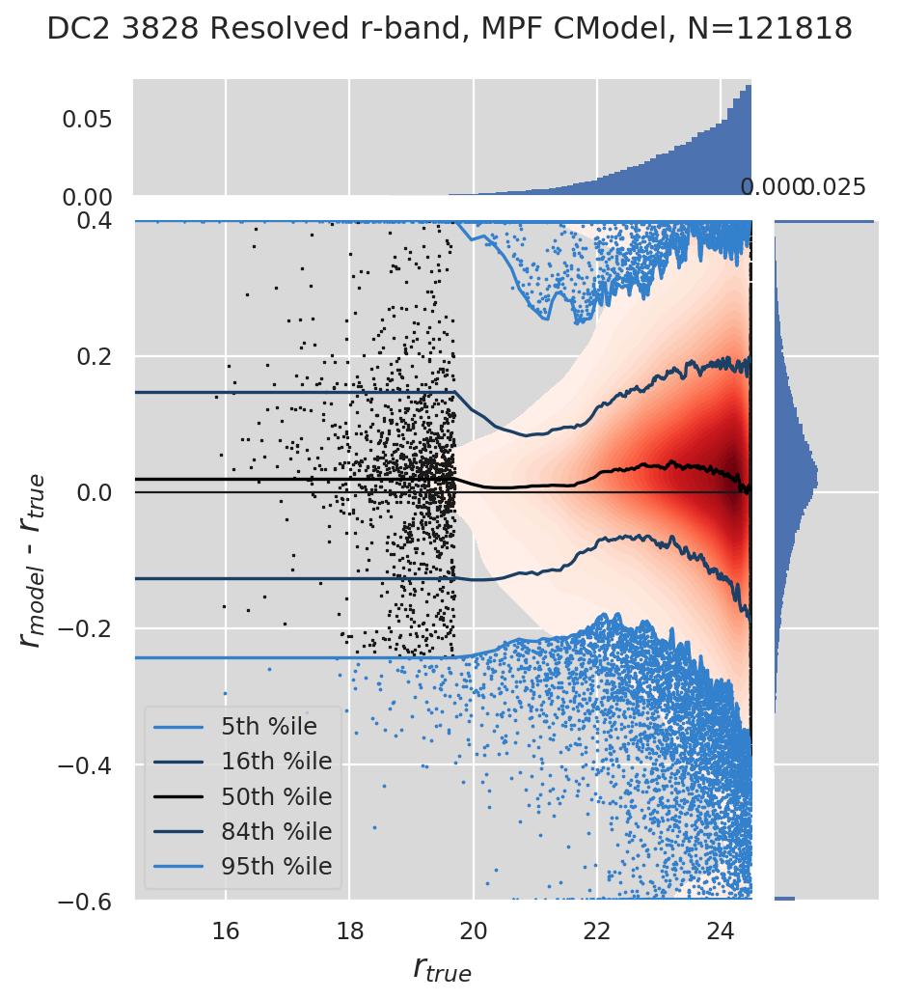

DC2 3828 Resolved r-band, MPF CModel(gri), N=129767


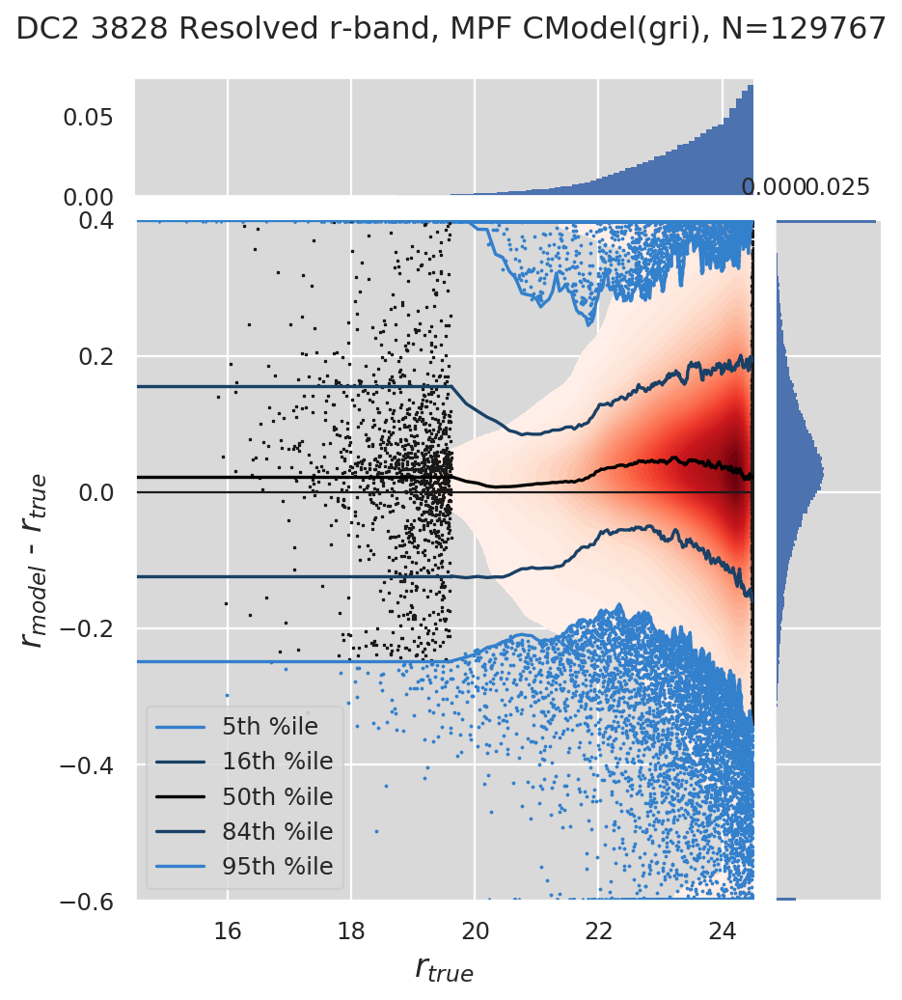

DC2 3828 Resolved i-band, MPF CModel, N=172427


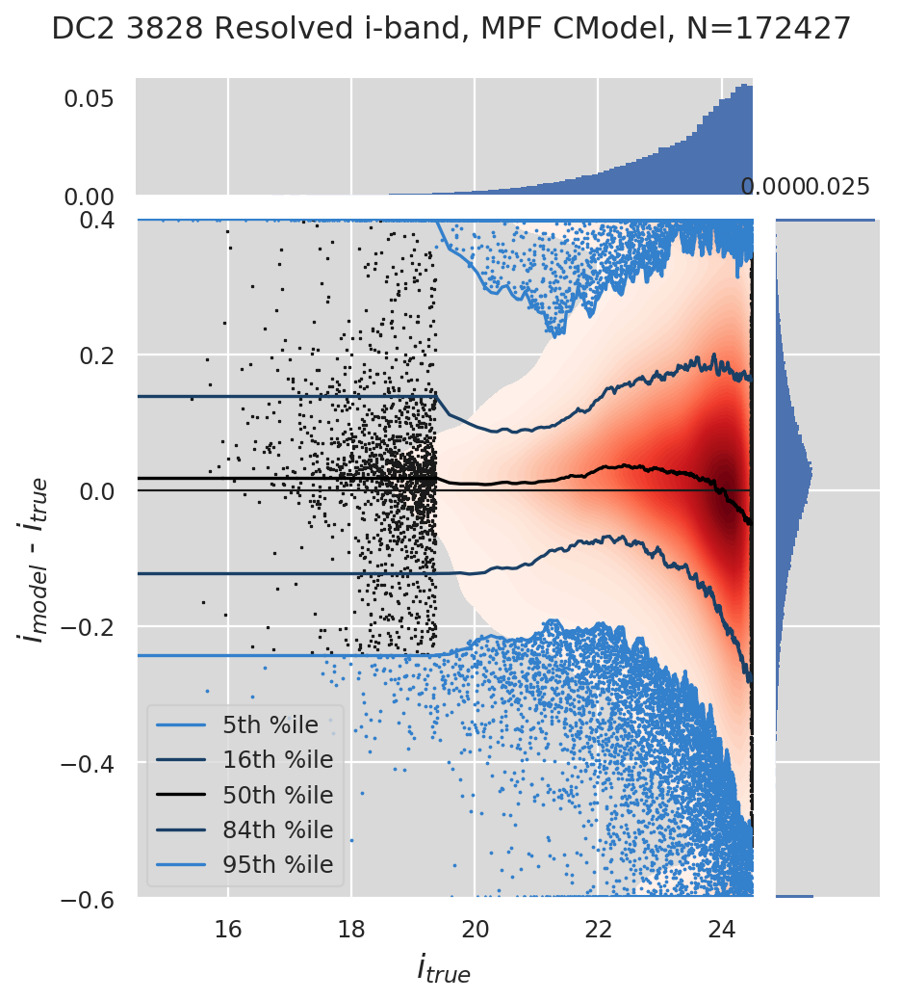

DC2 3828 Resolved i-band, MPF CModel(gri), N=183196


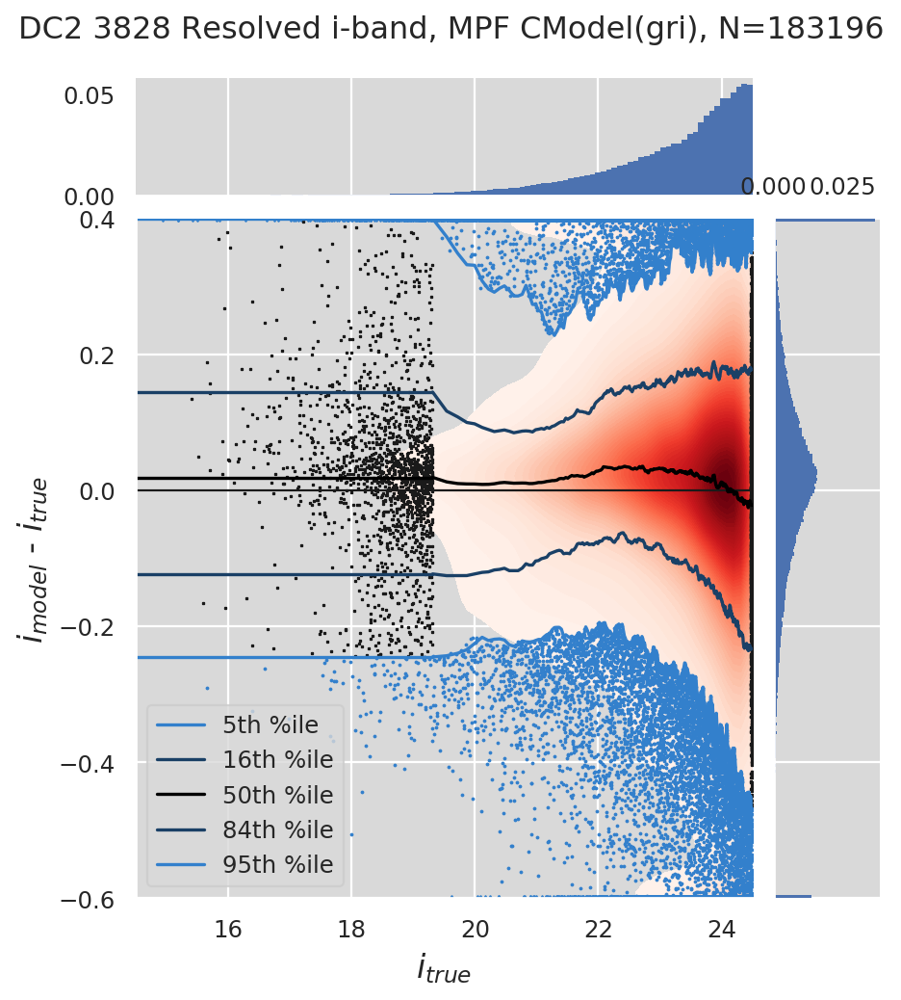

DC2 3828 Resolved g-r, MPF CModel, N=114724


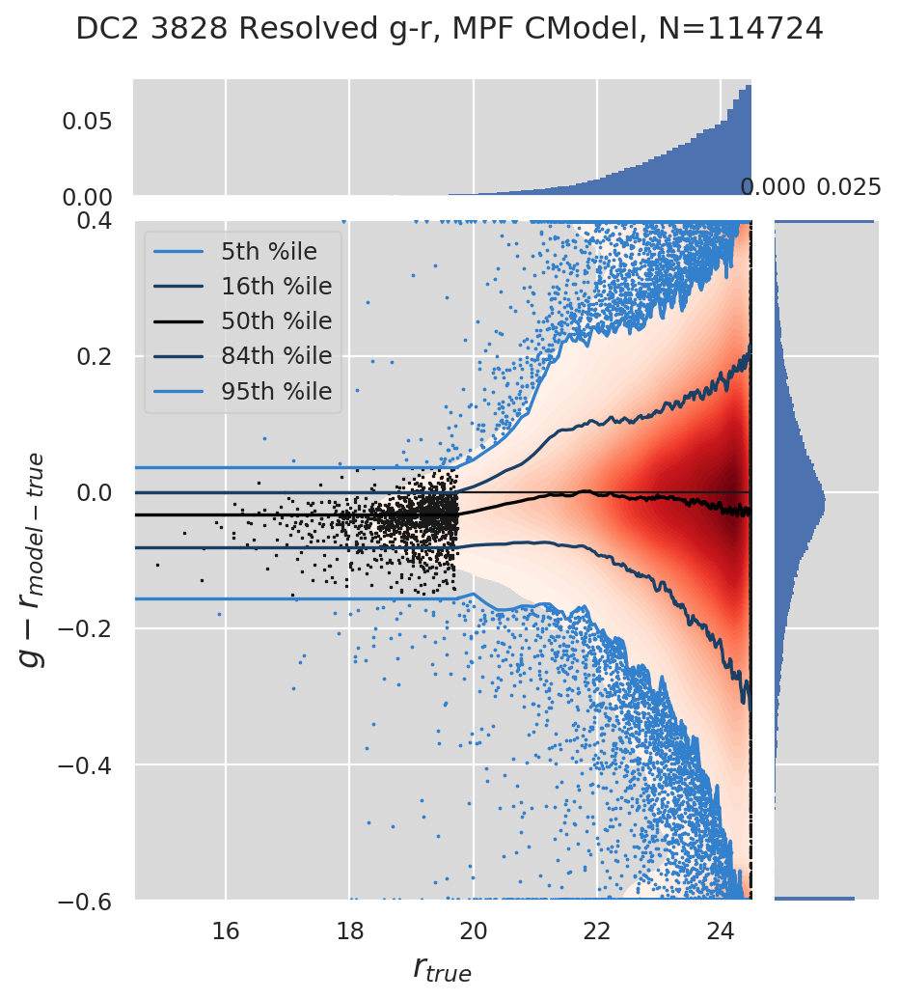

DC2 3828 Resolved g-r, MPF CModel(gri), N=129767


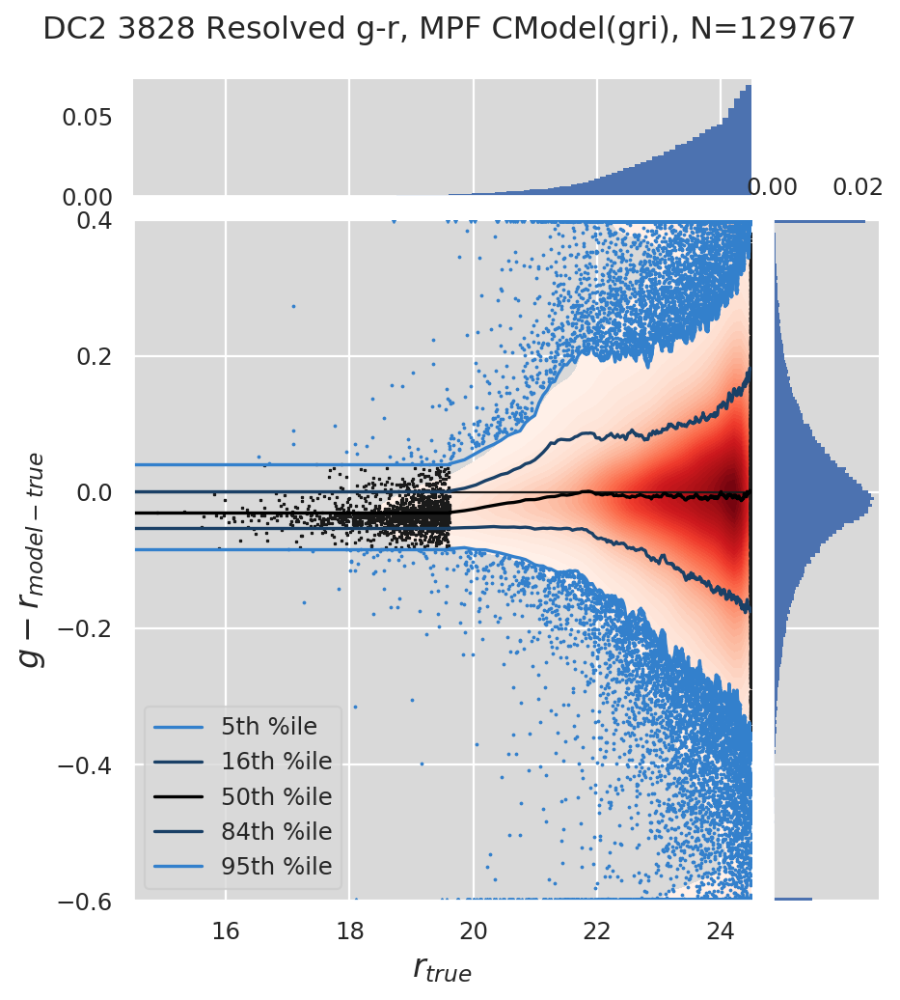

DC2 3828 Resolved r-i, MPF CModel, N=114544


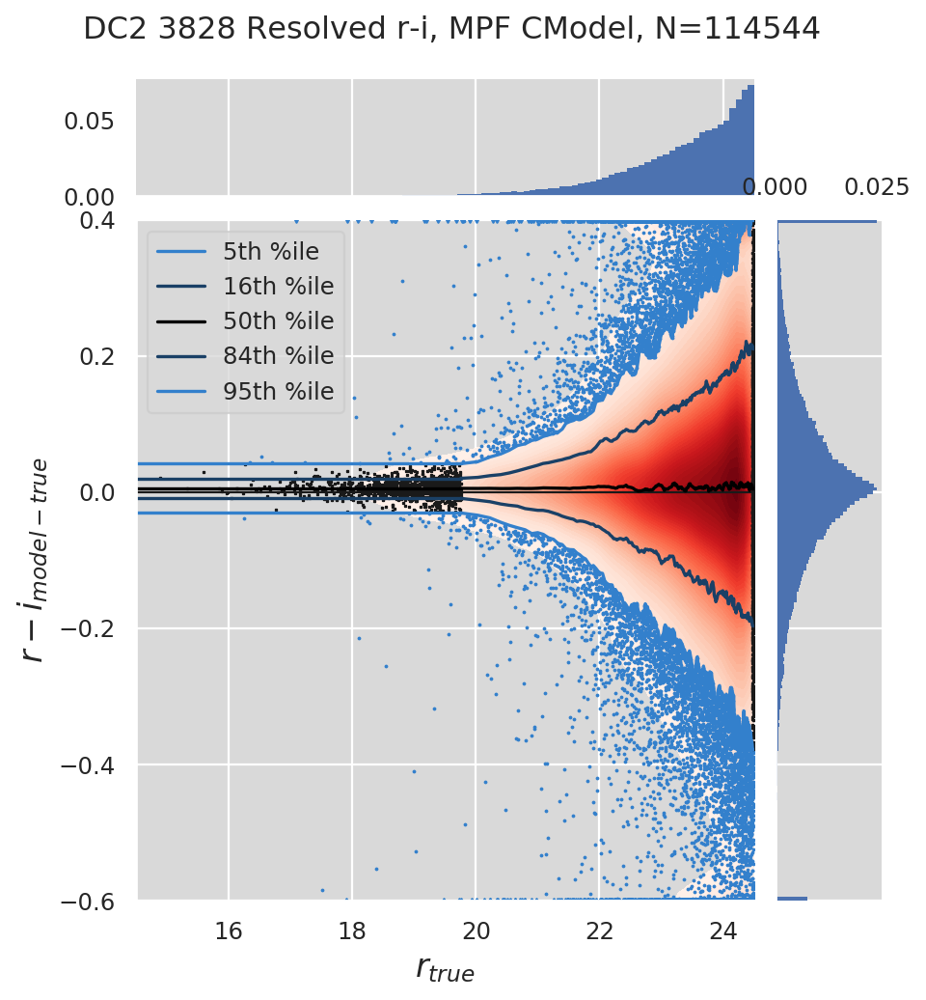

DC2 3828 Resolved r-i, MPF CModel(gri), N=129767


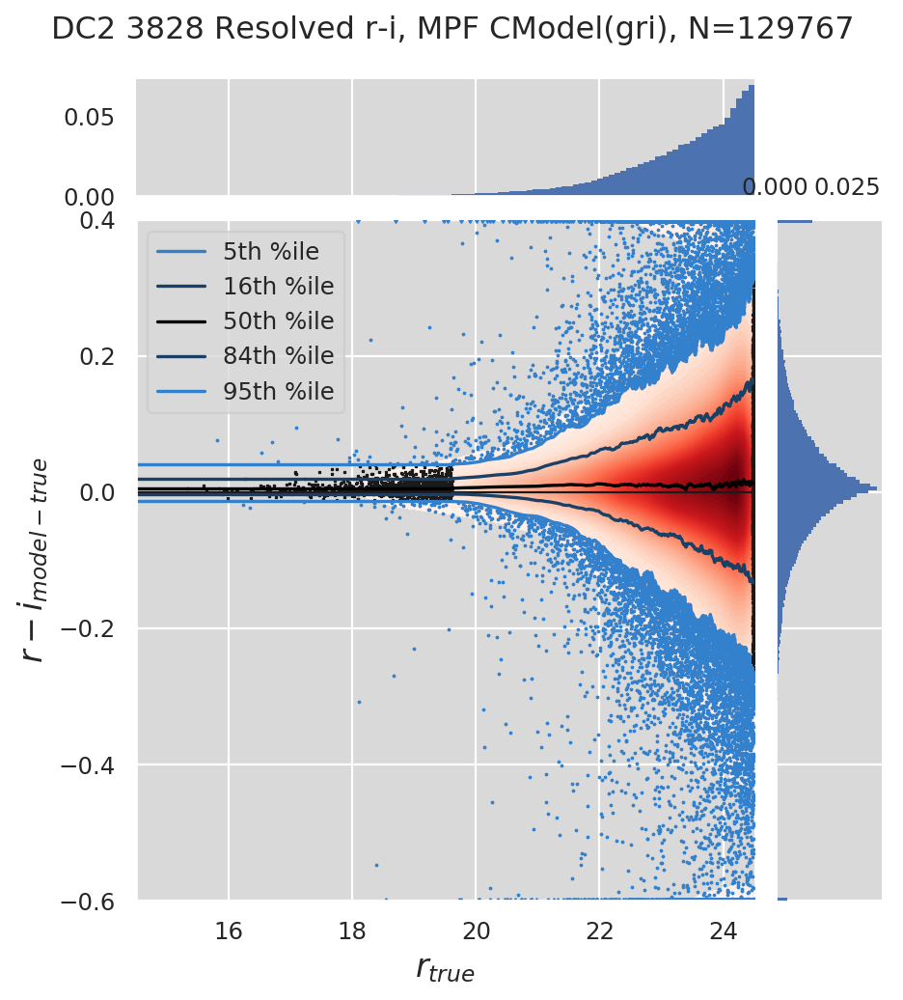

DC2 3828 Resolved g-band, MPF Sersic, N=79636


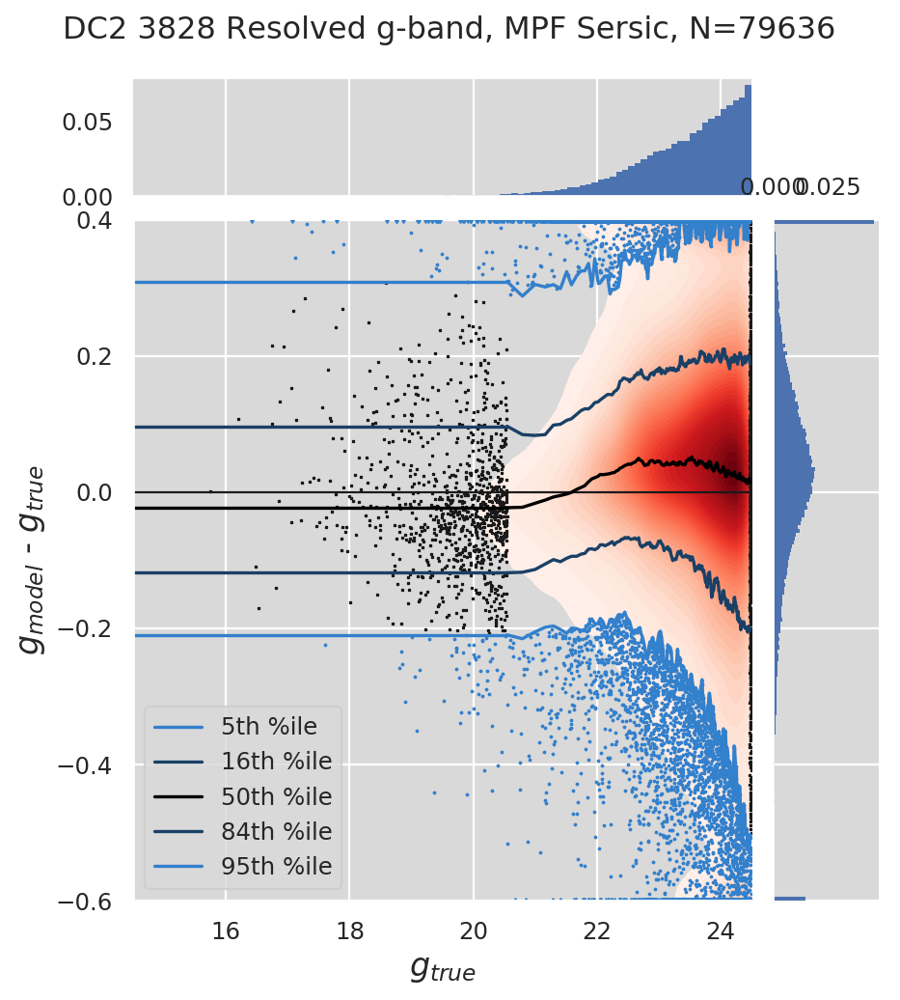

DC2 3828 Resolved g-band, MPF Sersic(gri), N=84818


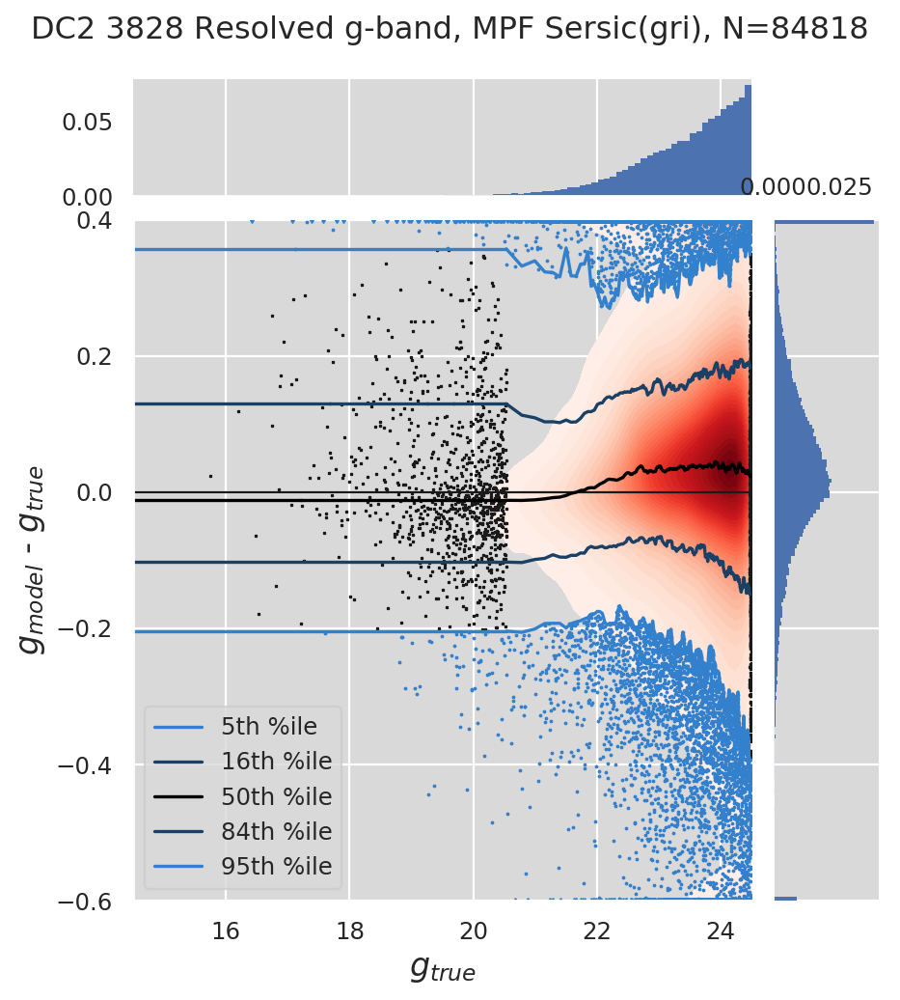

DC2 3828 Resolved r-band, MPF Sersic, N=121818


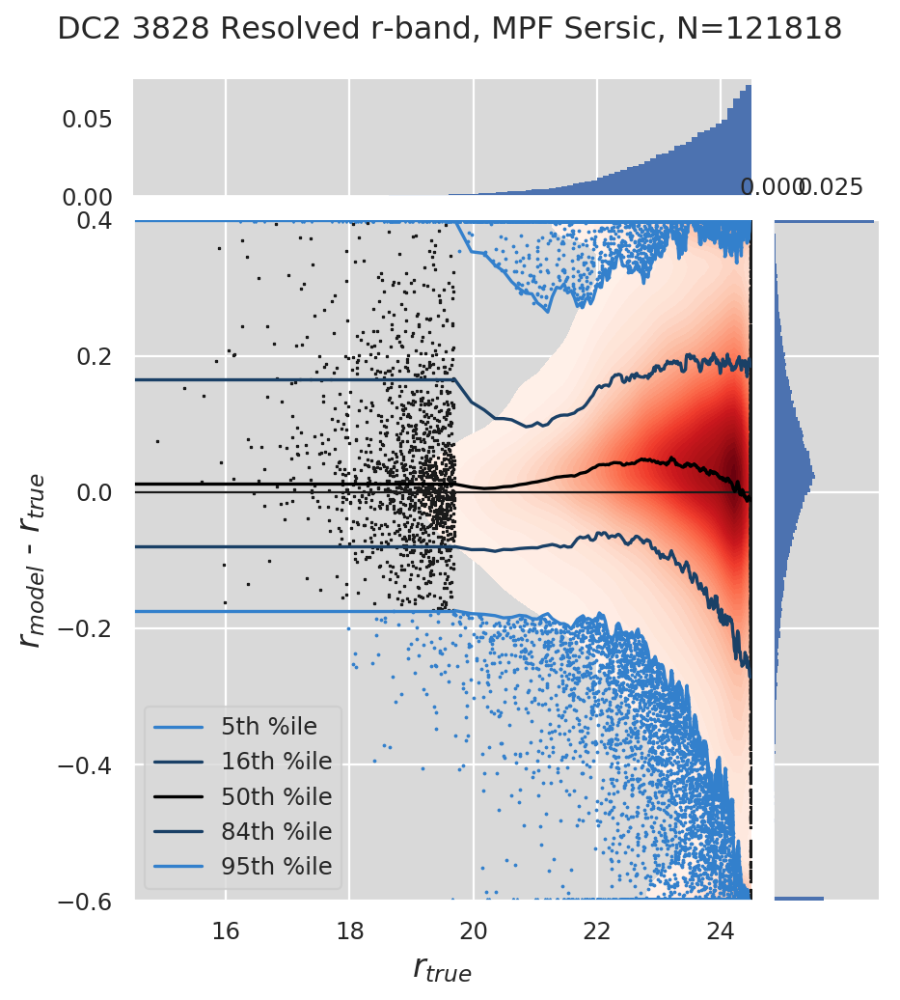

DC2 3828 Resolved r-band, MPF Sersic(gri), N=129767


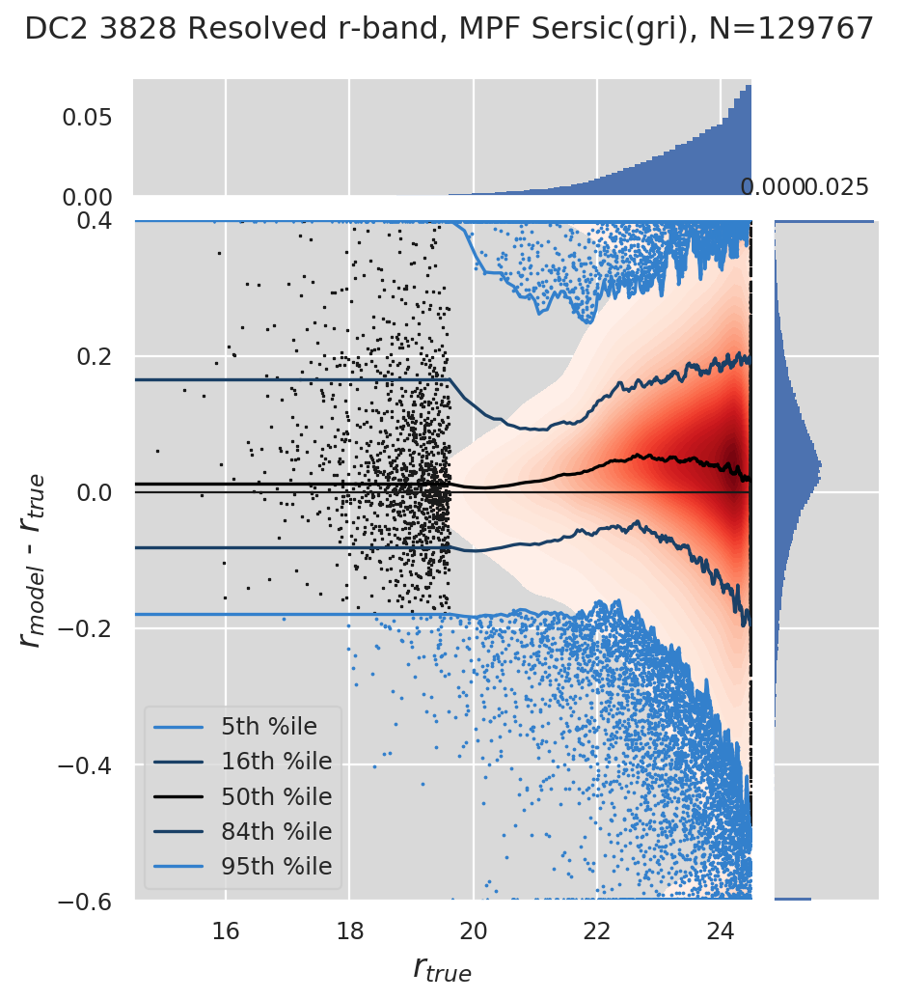

DC2 3828 Resolved i-band, MPF Sersic, N=172427


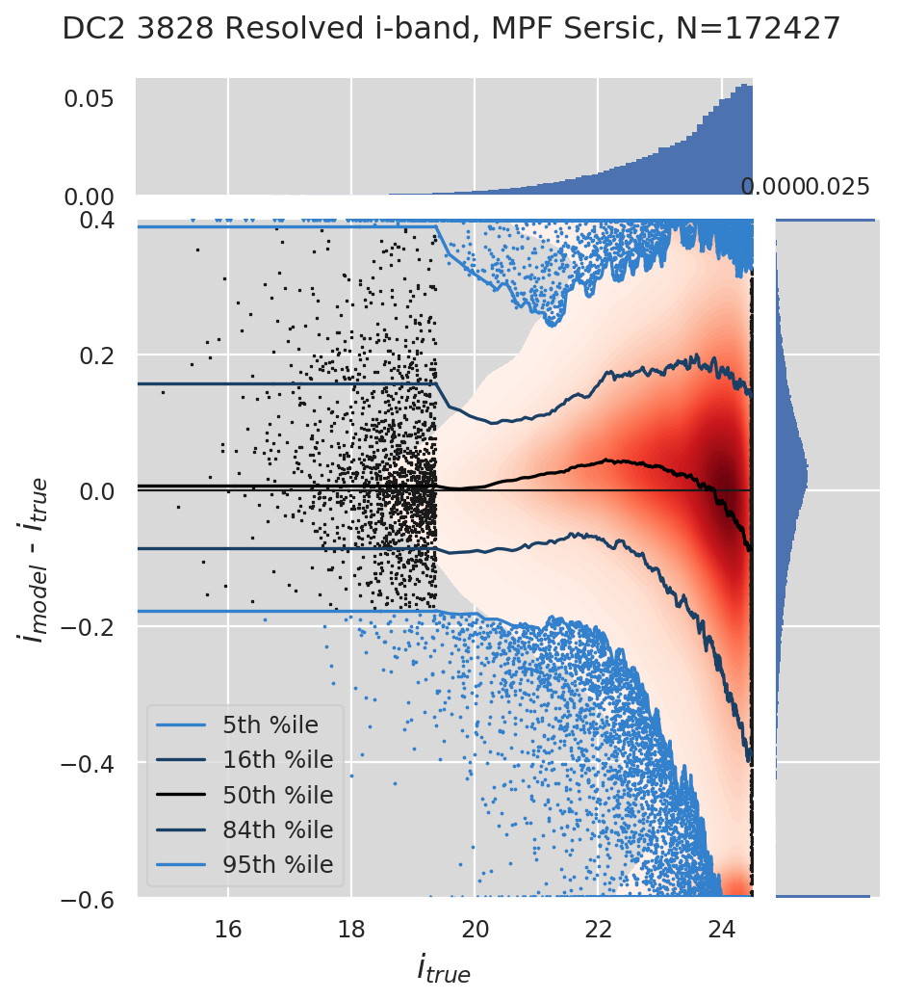

DC2 3828 Resolved i-band, MPF Sersic(gri), N=183196


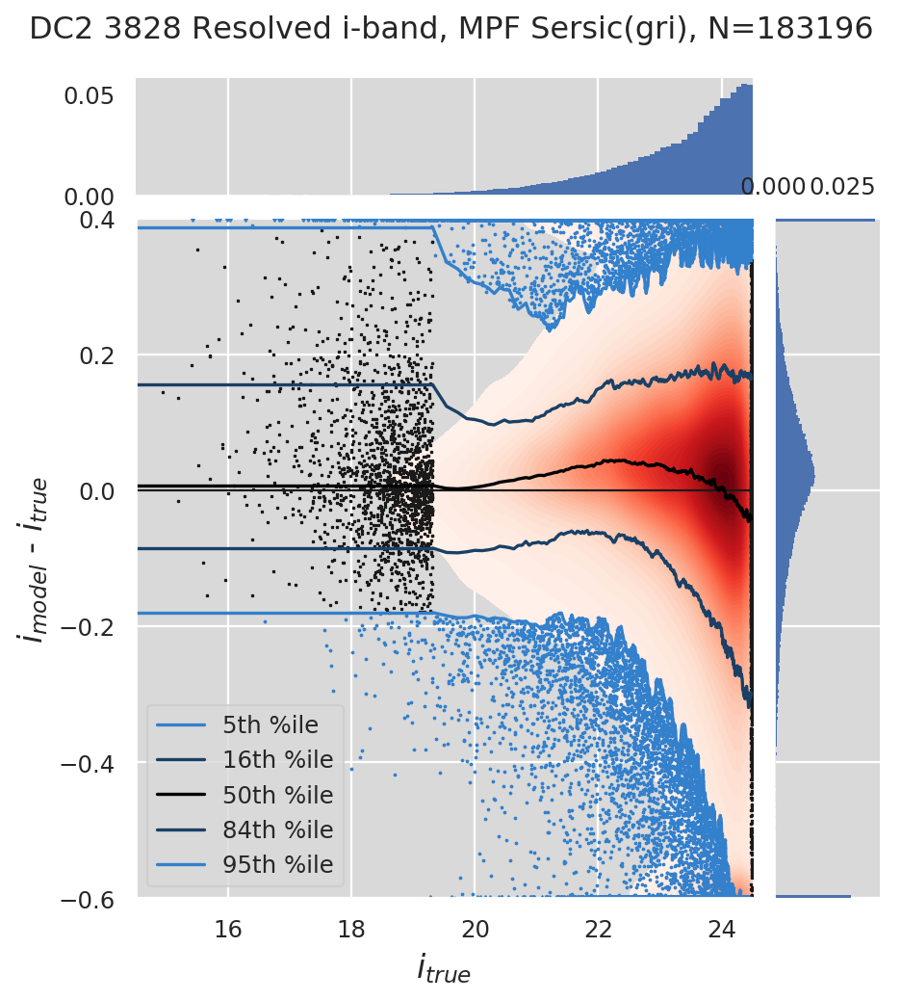

DC2 3828 Resolved g-r, MPF Sersic, N=114724


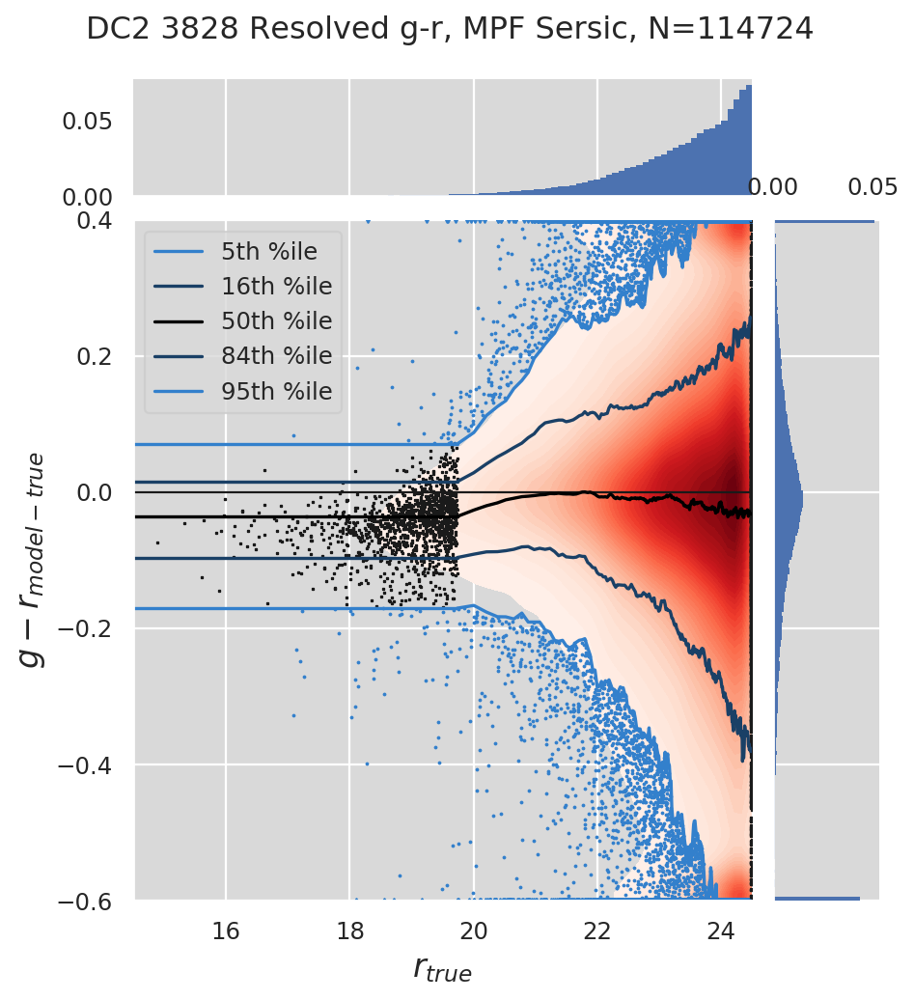

DC2 3828 Resolved g-r, MPF Sersic(gri), N=129767


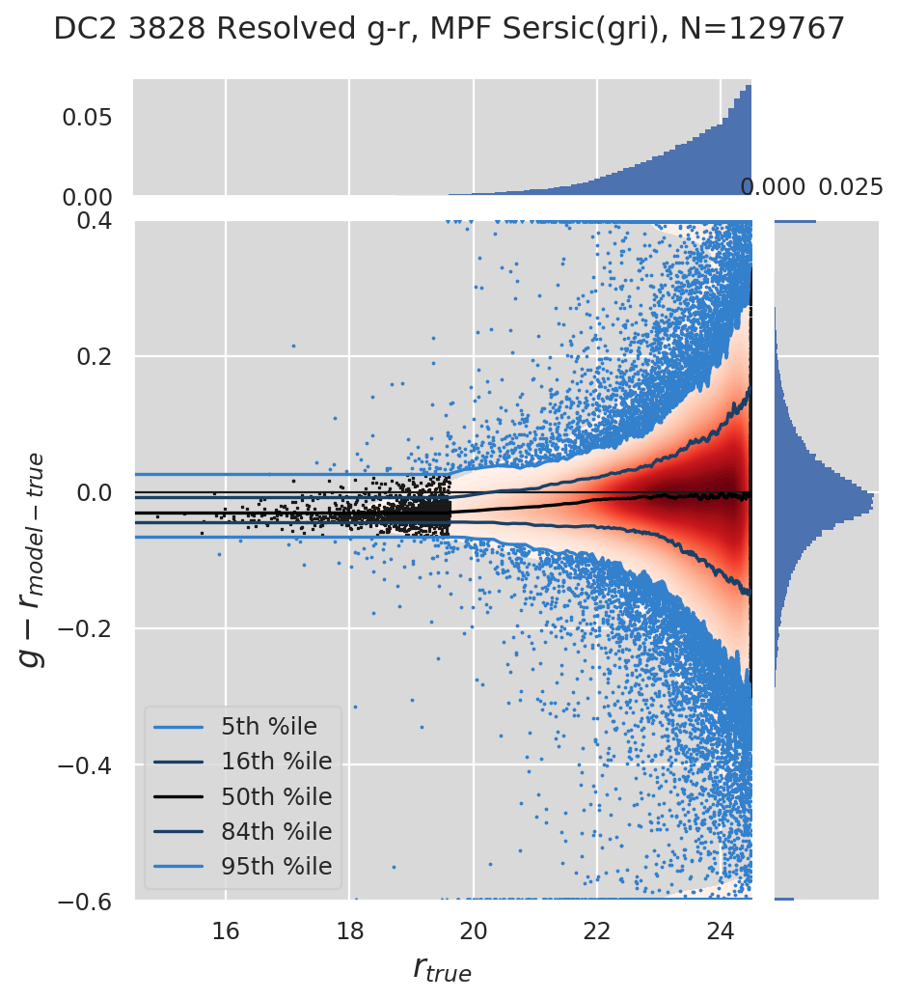

DC2 3828 Resolved r-i, MPF Sersic, N=114544


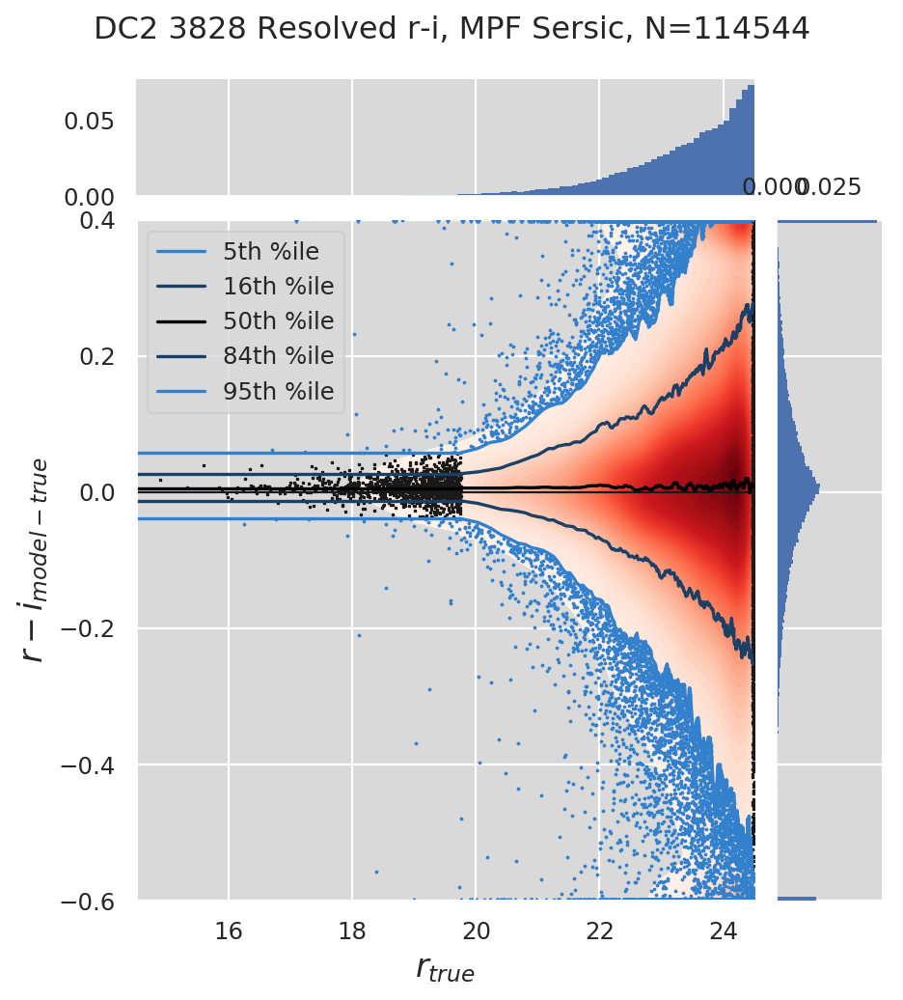

DC2 3828 Resolved r-i, MPF Sersic(gri), N=129767


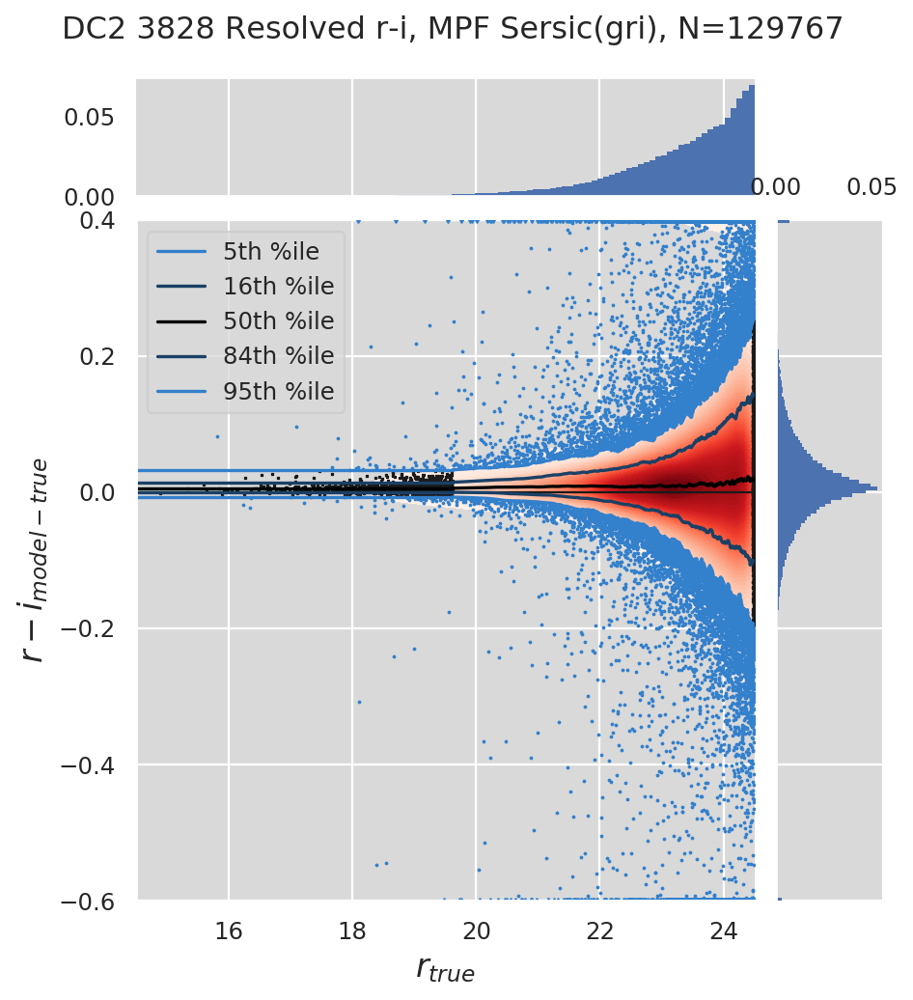

DC2 3828 Resolved g-band, MPF Sersic Free Amp., N=79636


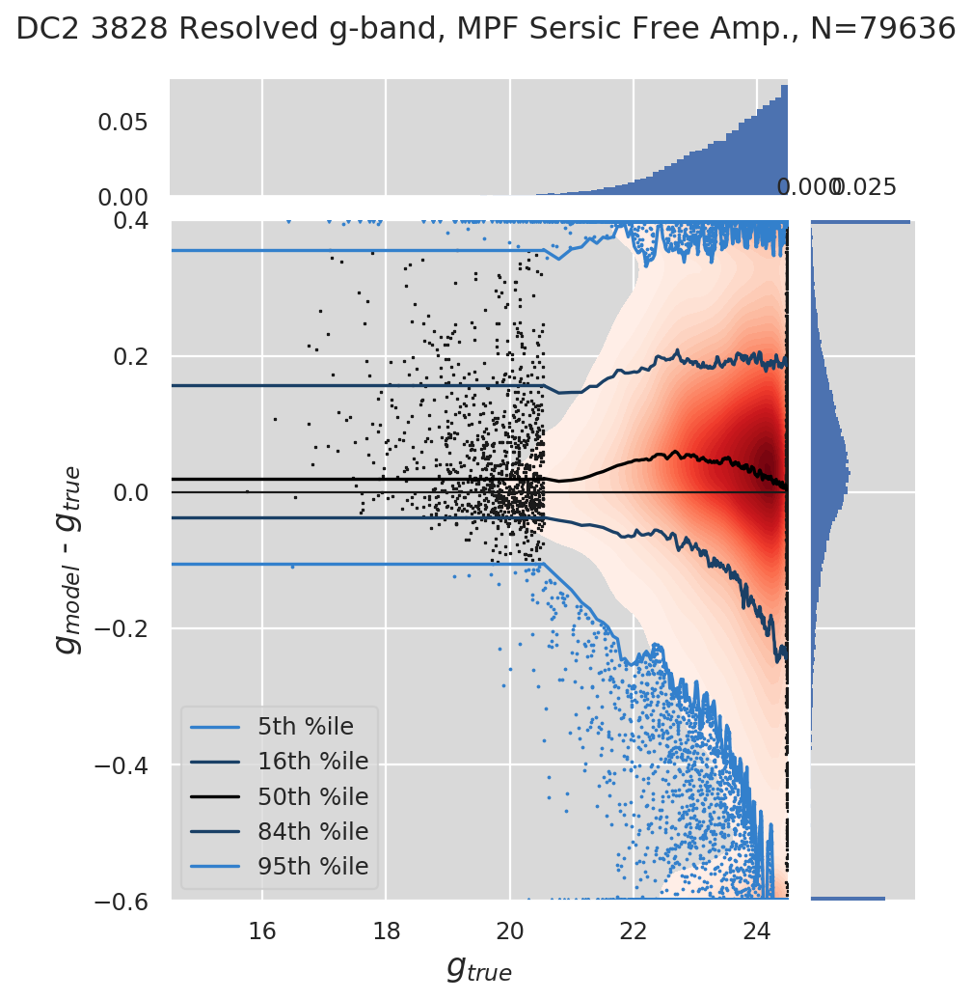

DC2 3828 Resolved g-band, MPF Sersic Free Amp.(gri), N=84818


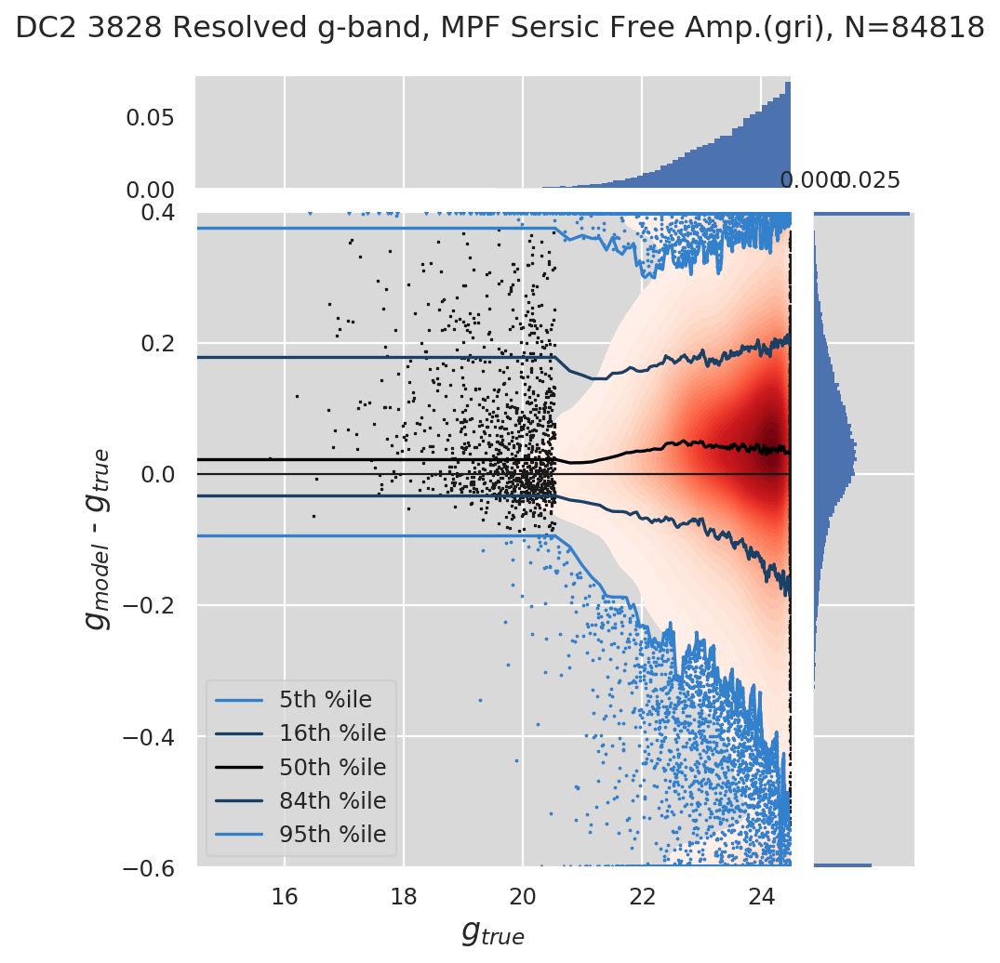

DC2 3828 Resolved r-band, MPF Sersic Free Amp., N=121818


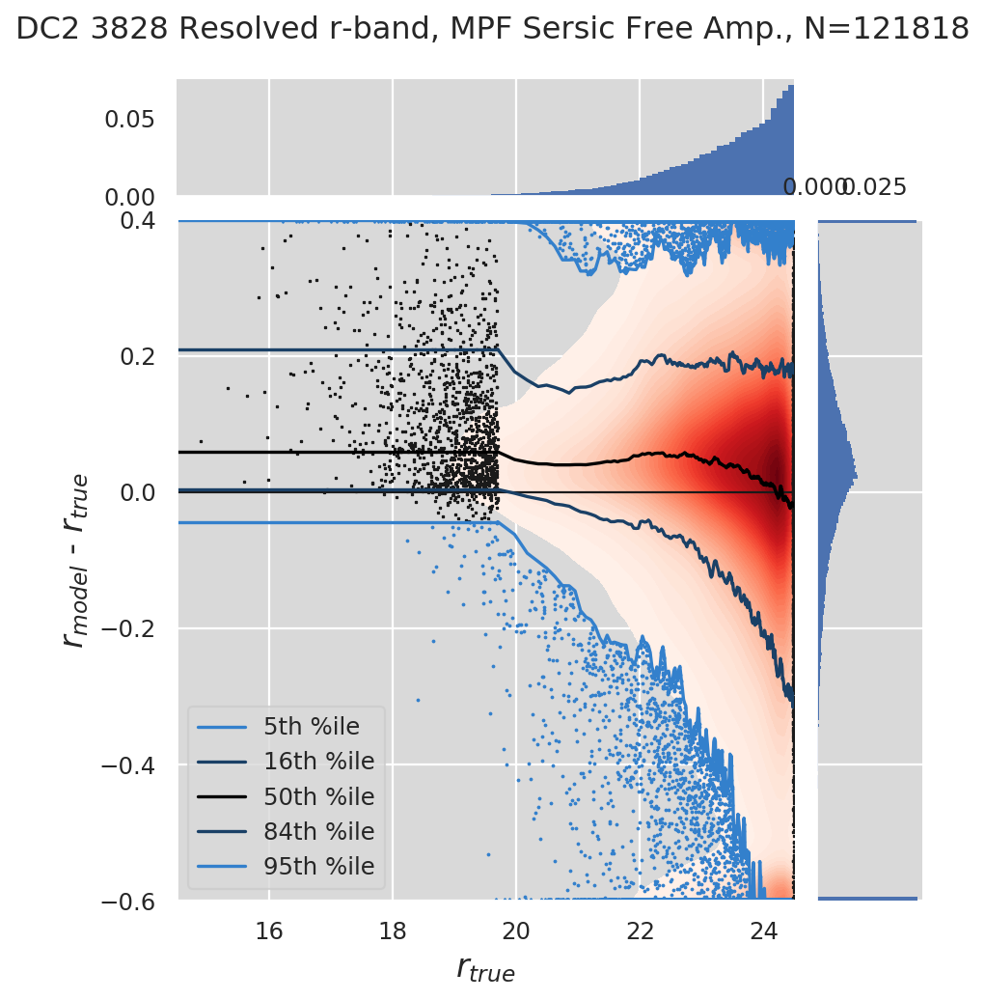

DC2 3828 Resolved r-band, MPF Sersic Free Amp.(gri), N=129767


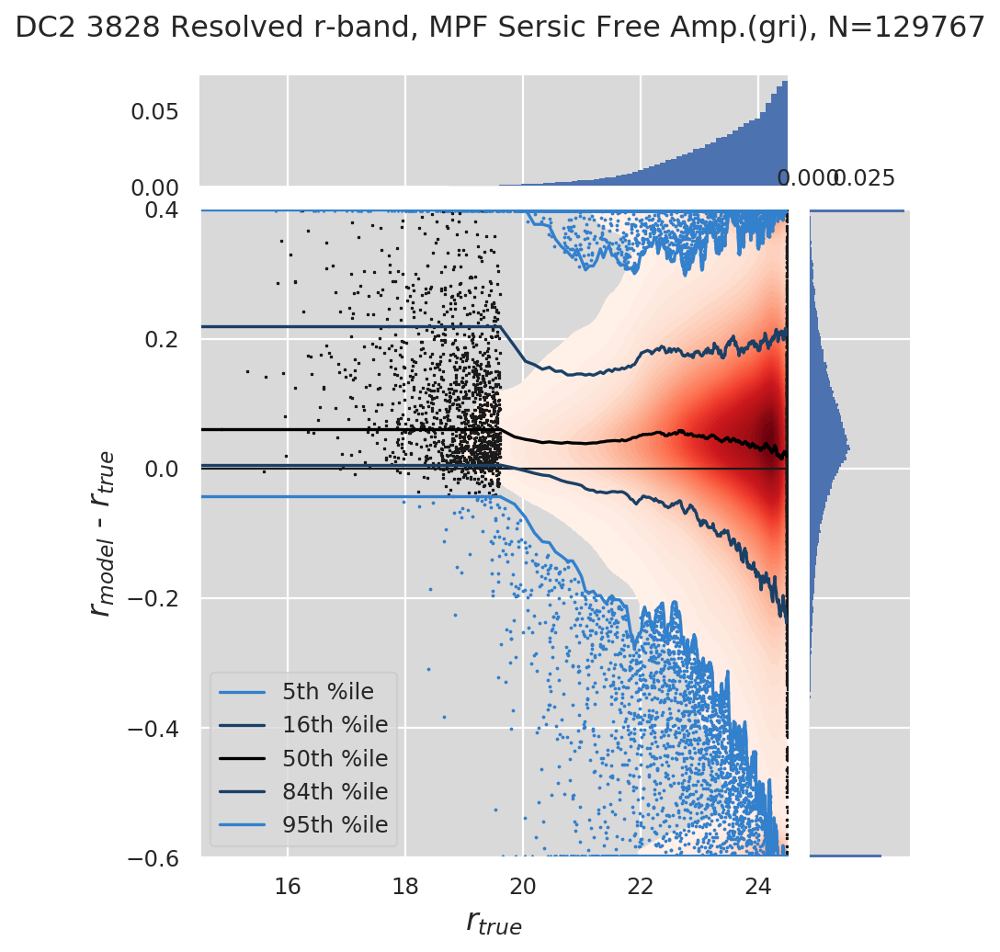

DC2 3828 Resolved i-band, MPF Sersic Free Amp., N=172427


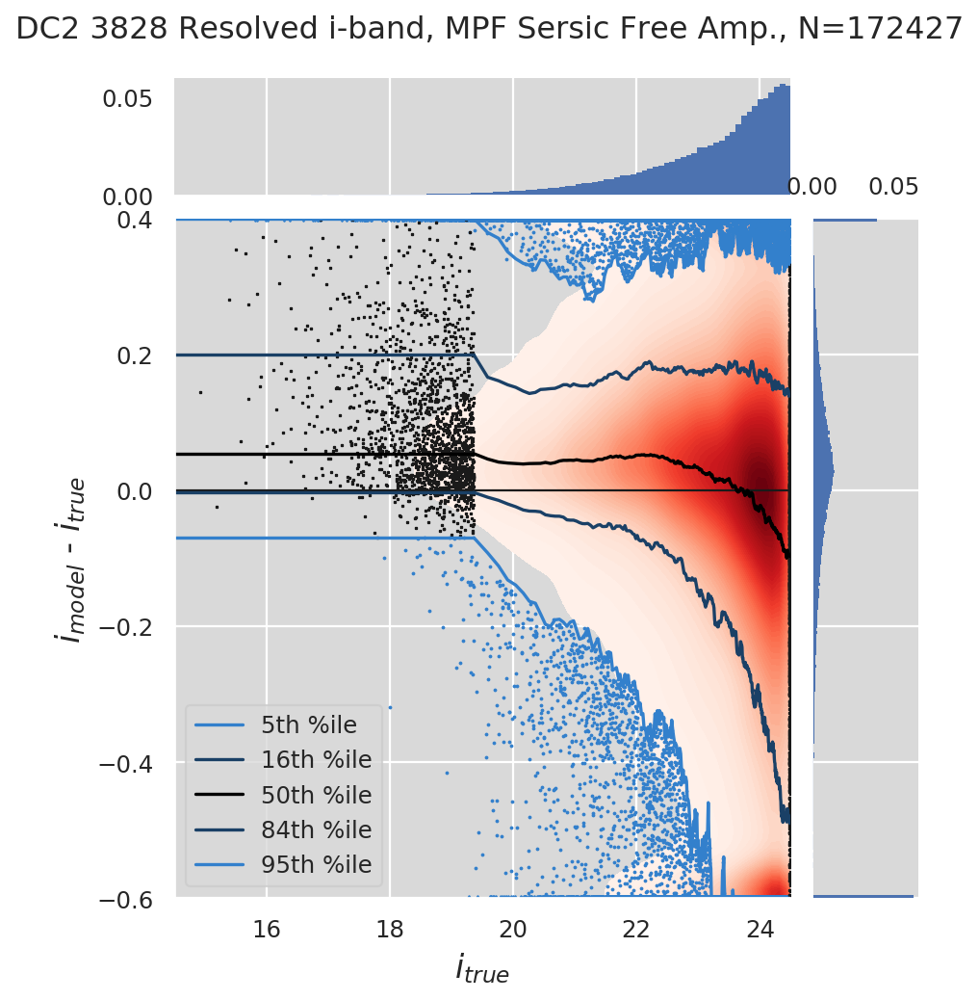

DC2 3828 Resolved i-band, MPF Sersic Free Amp.(gri), N=183196


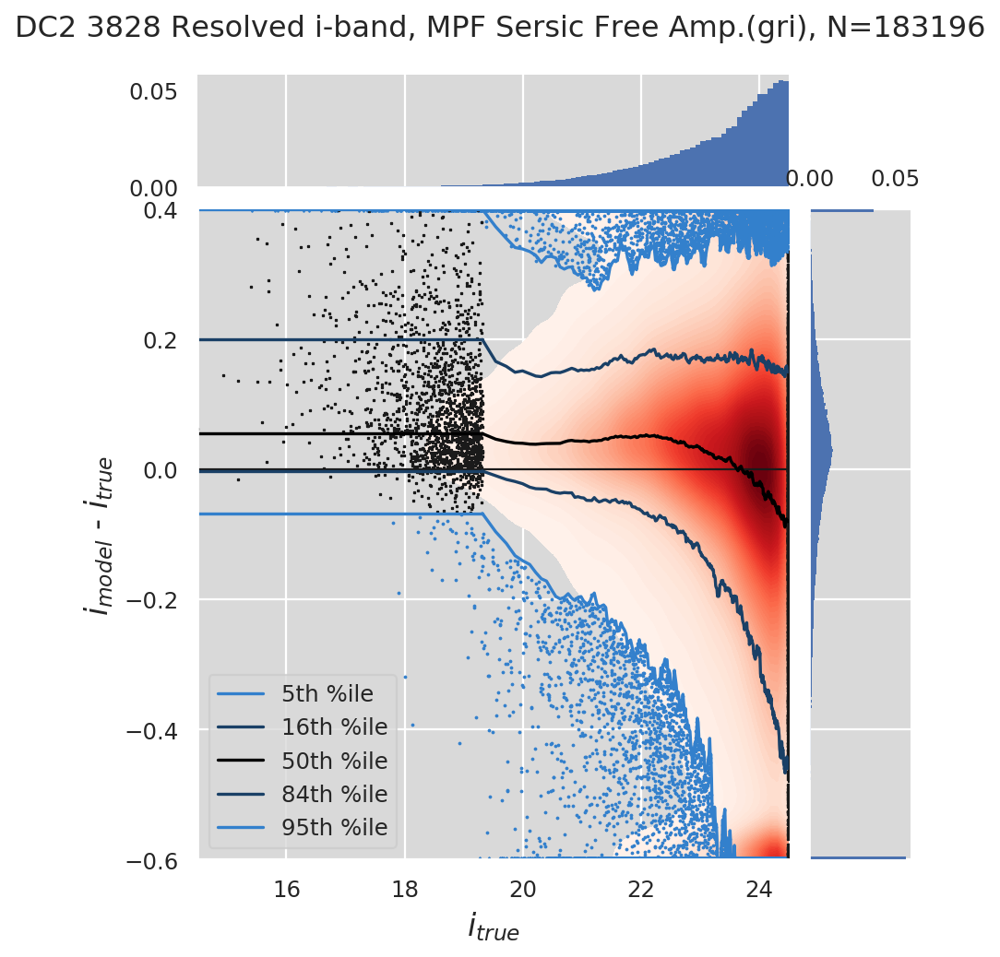

DC2 3828 Resolved g-r, MPF Sersic Free Amp., N=114724


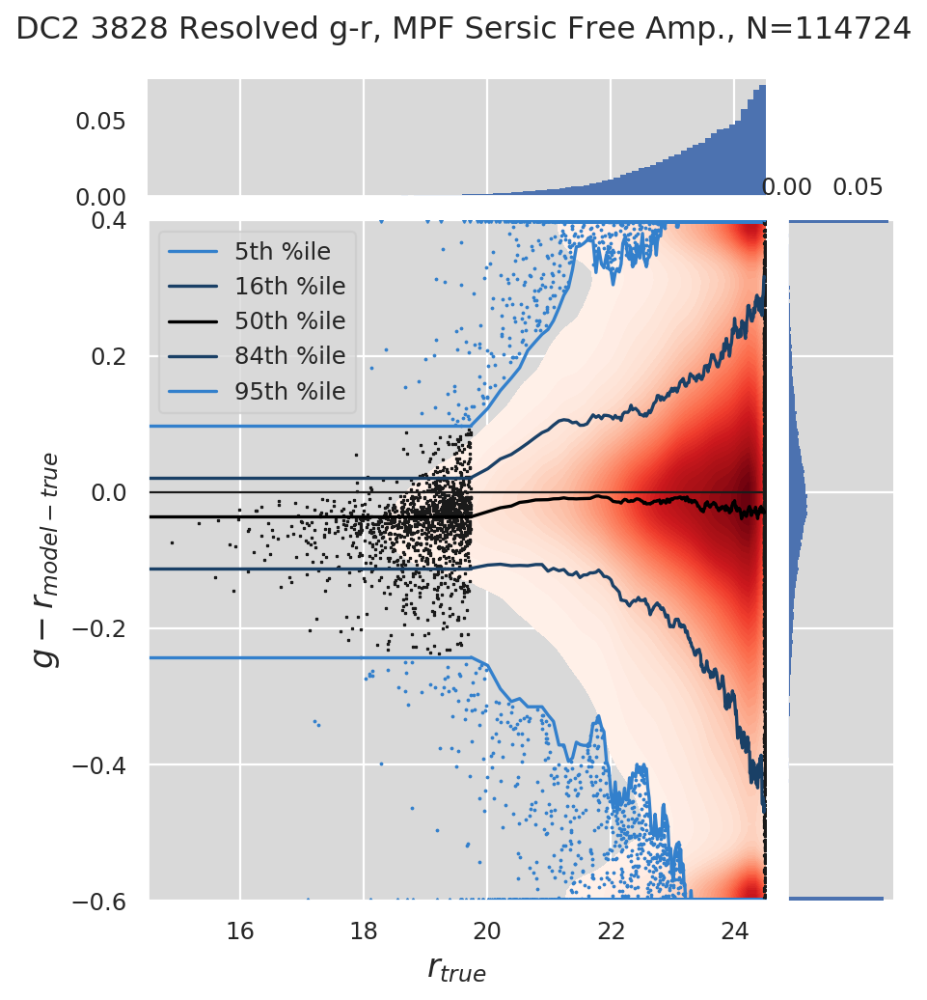

DC2 3828 Resolved g-r, MPF Sersic Free Amp.(gri), N=129767


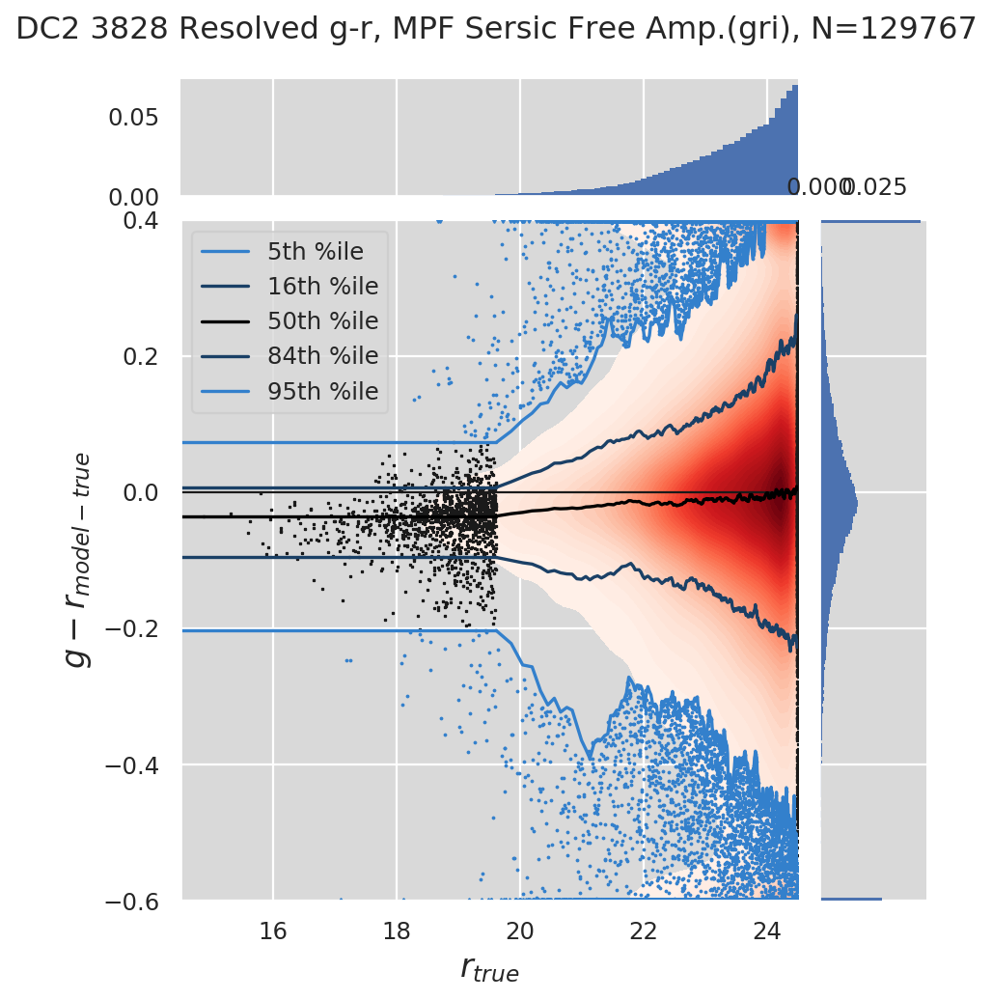

DC2 3828 Resolved r-i, MPF Sersic Free Amp., N=114544


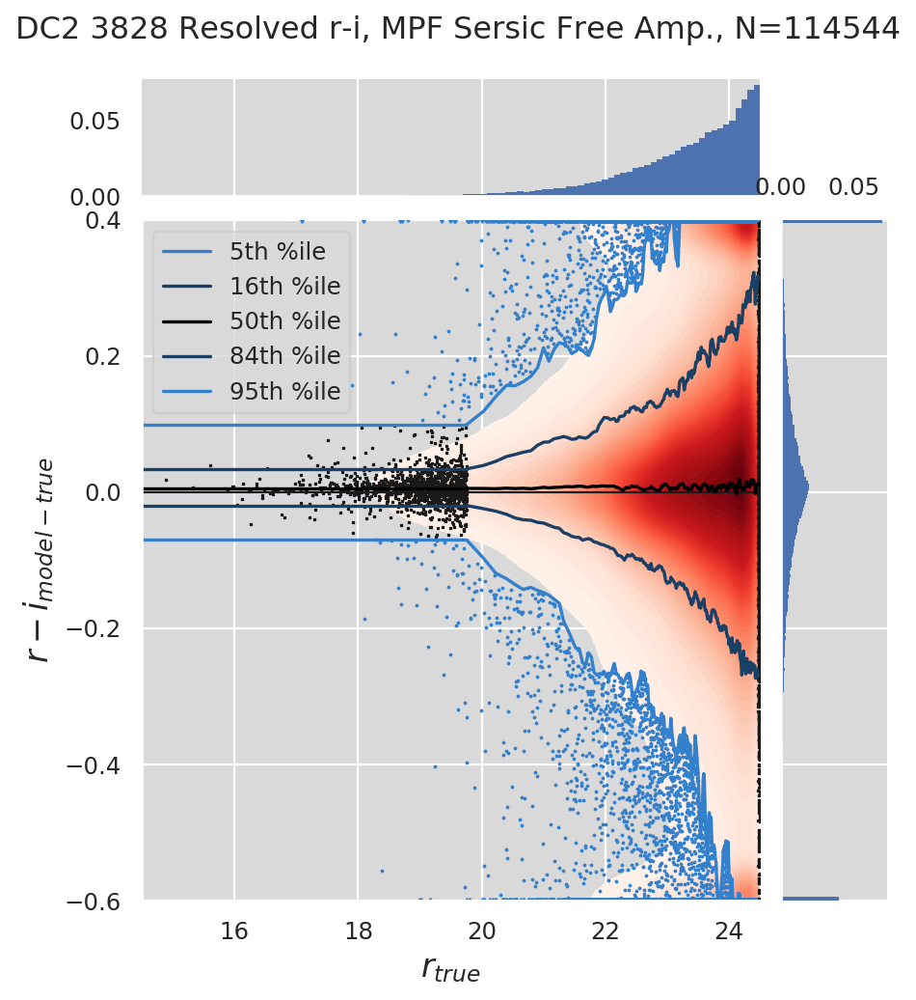

DC2 3828 Resolved r-i, MPF Sersic Free Amp.(gri), N=129767


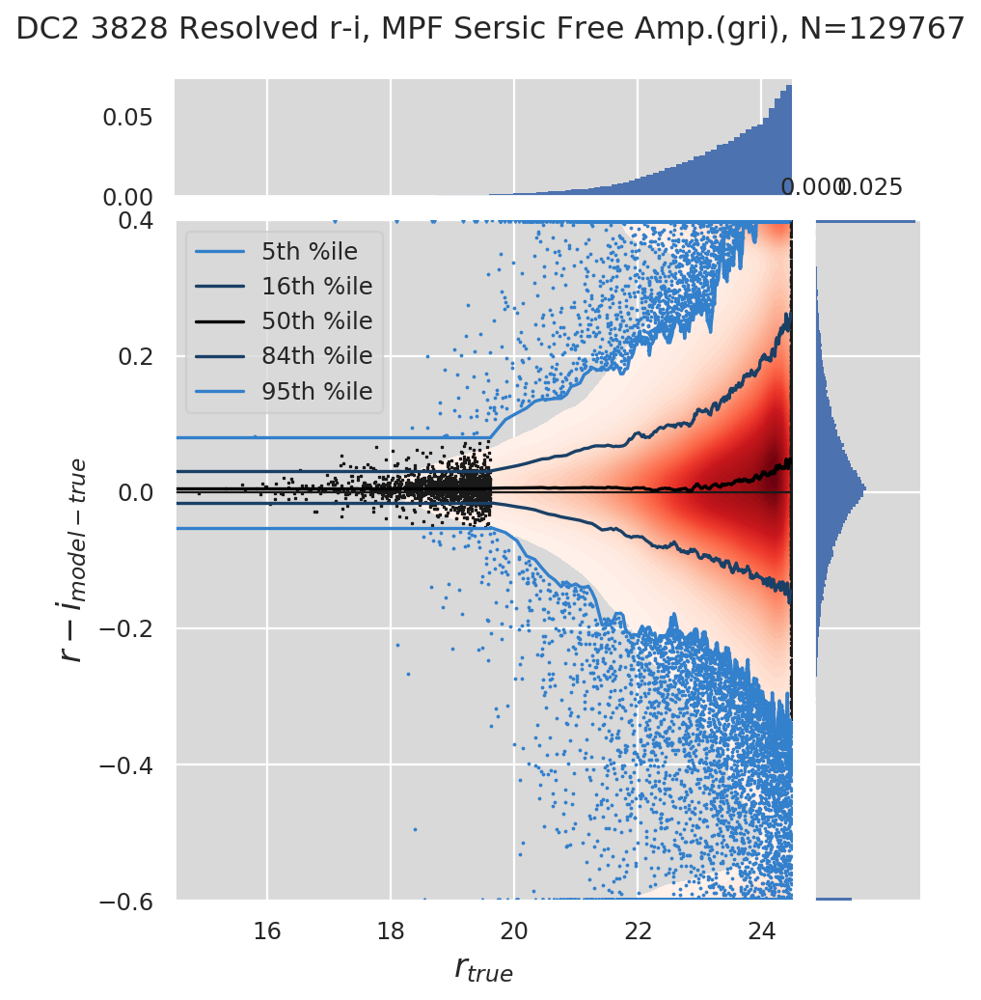

DC2 3828 Resolved g-band, MPF Sersic x 2, N=79636


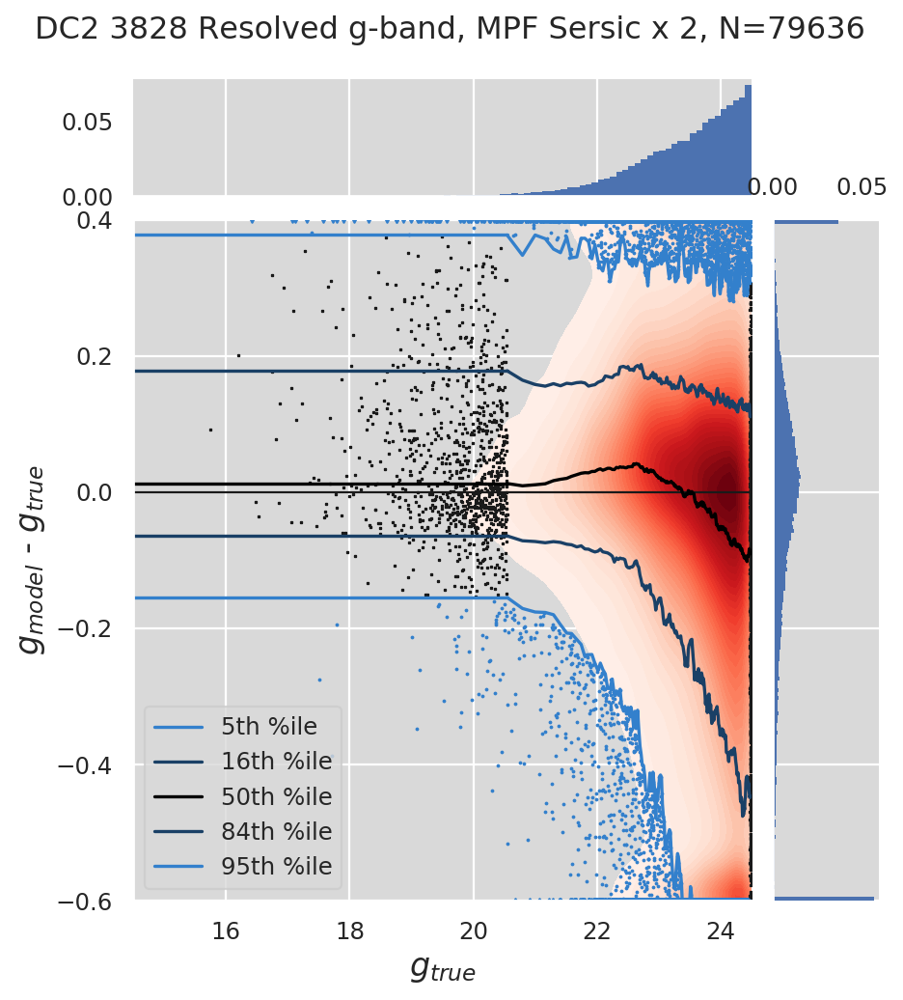

DC2 3828 Resolved g-band, MPF Sersic x 2(gri), N=84818


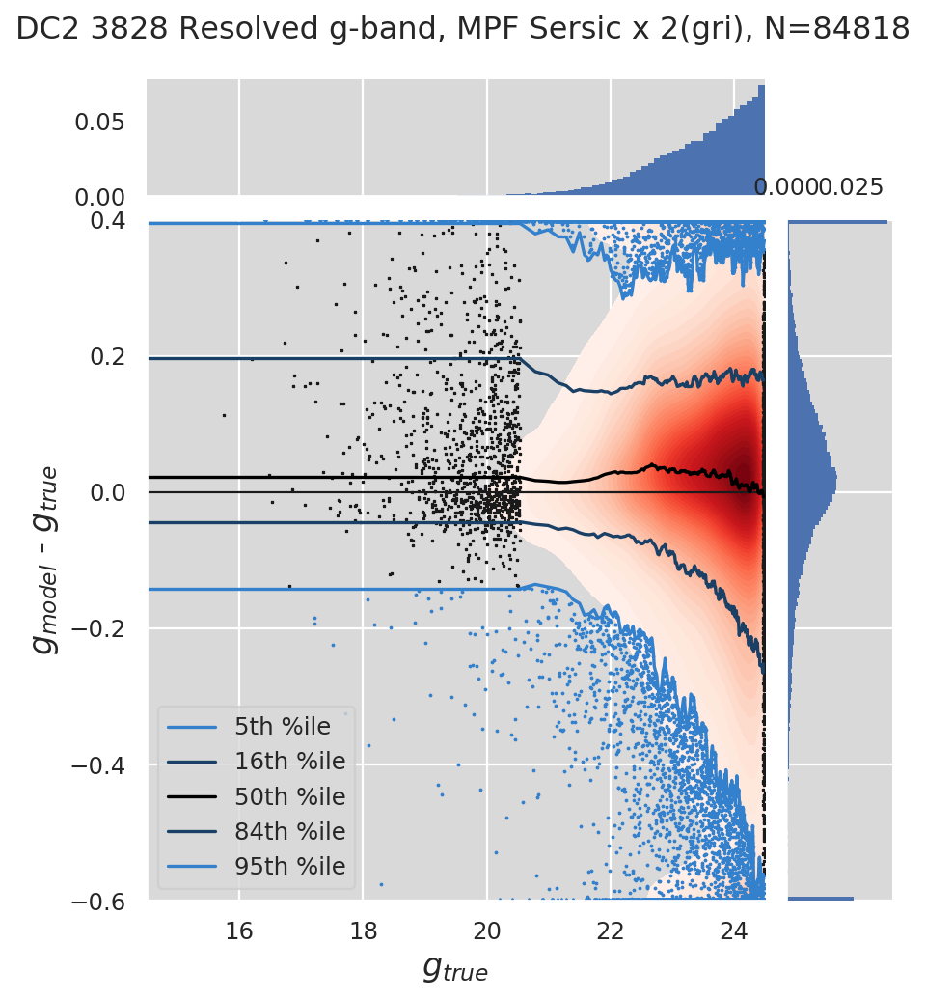

DC2 3828 Resolved r-band, MPF Sersic x 2, N=121818


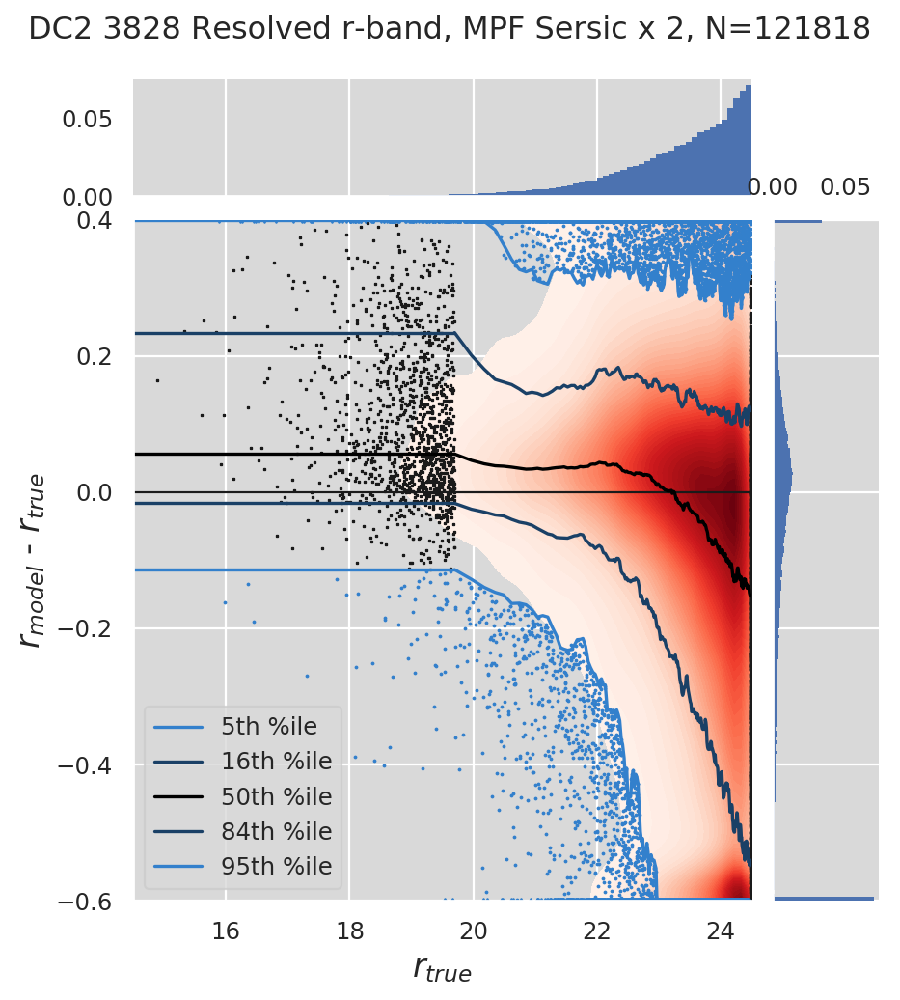

DC2 3828 Resolved r-band, MPF Sersic x 2(gri), N=129767


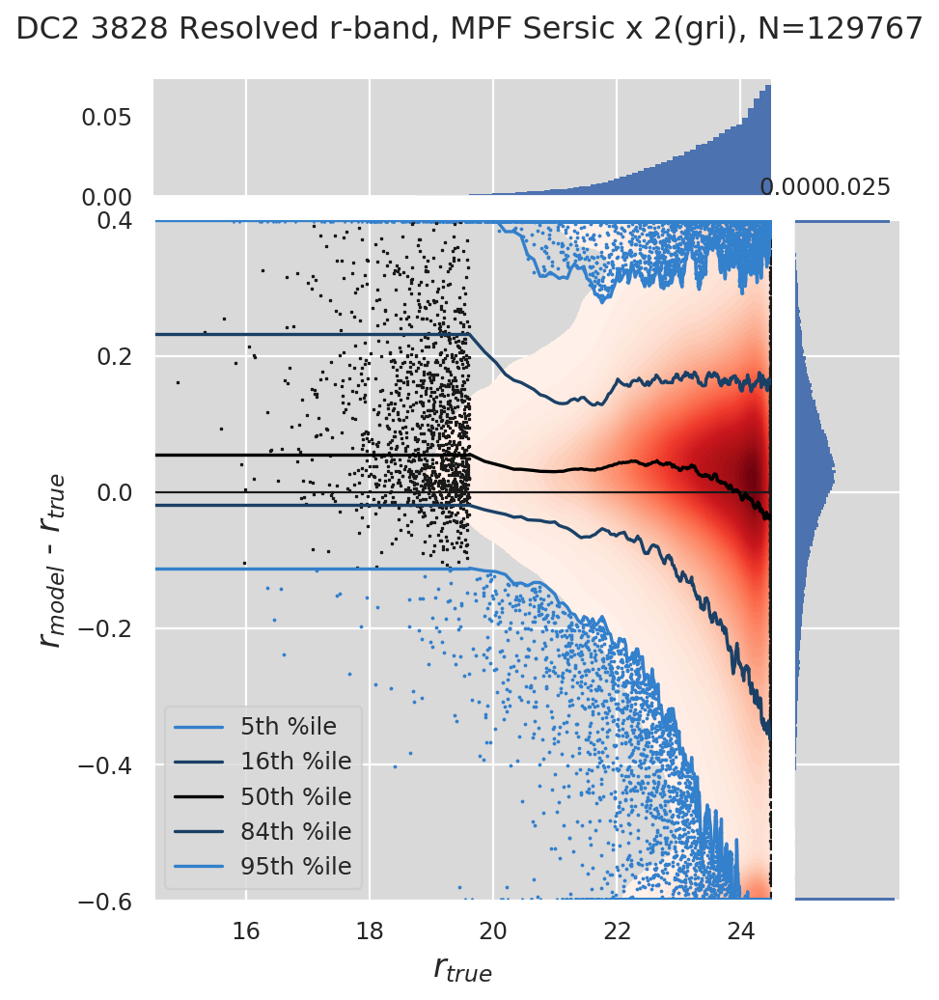

DC2 3828 Resolved i-band, MPF Sersic x 2, N=172427


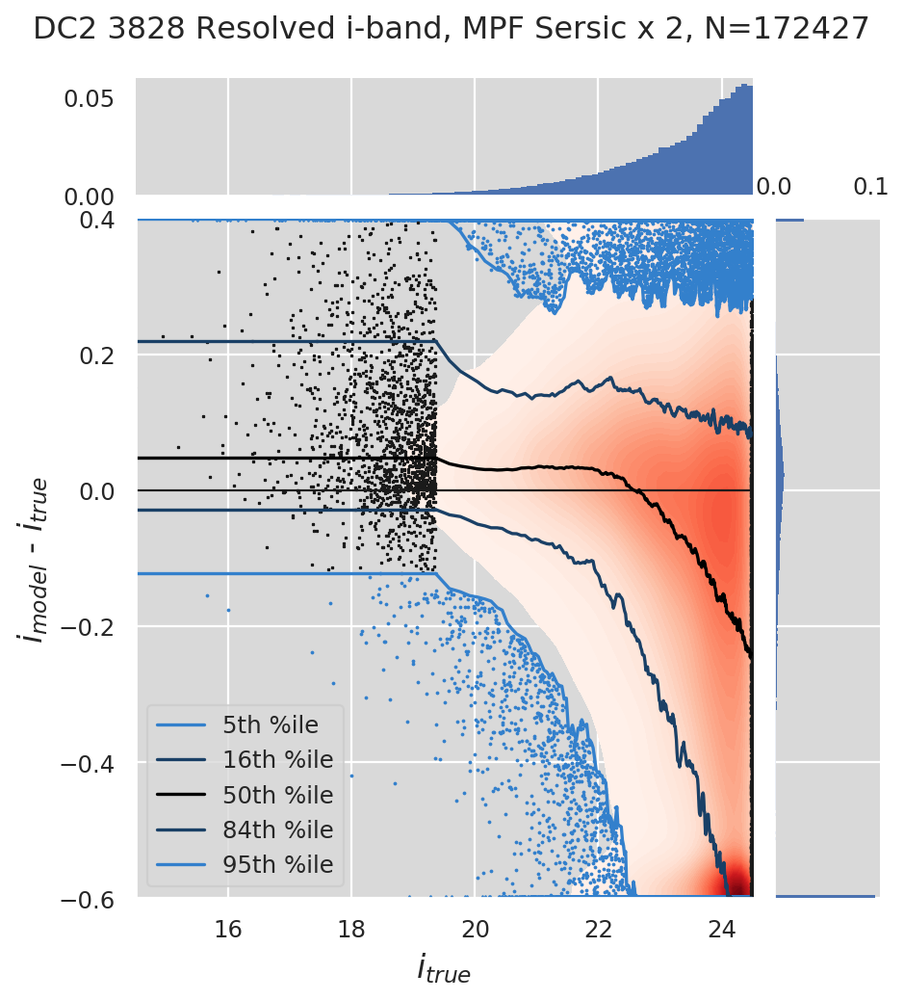

DC2 3828 Resolved i-band, MPF Sersic x 2(gri), N=183196


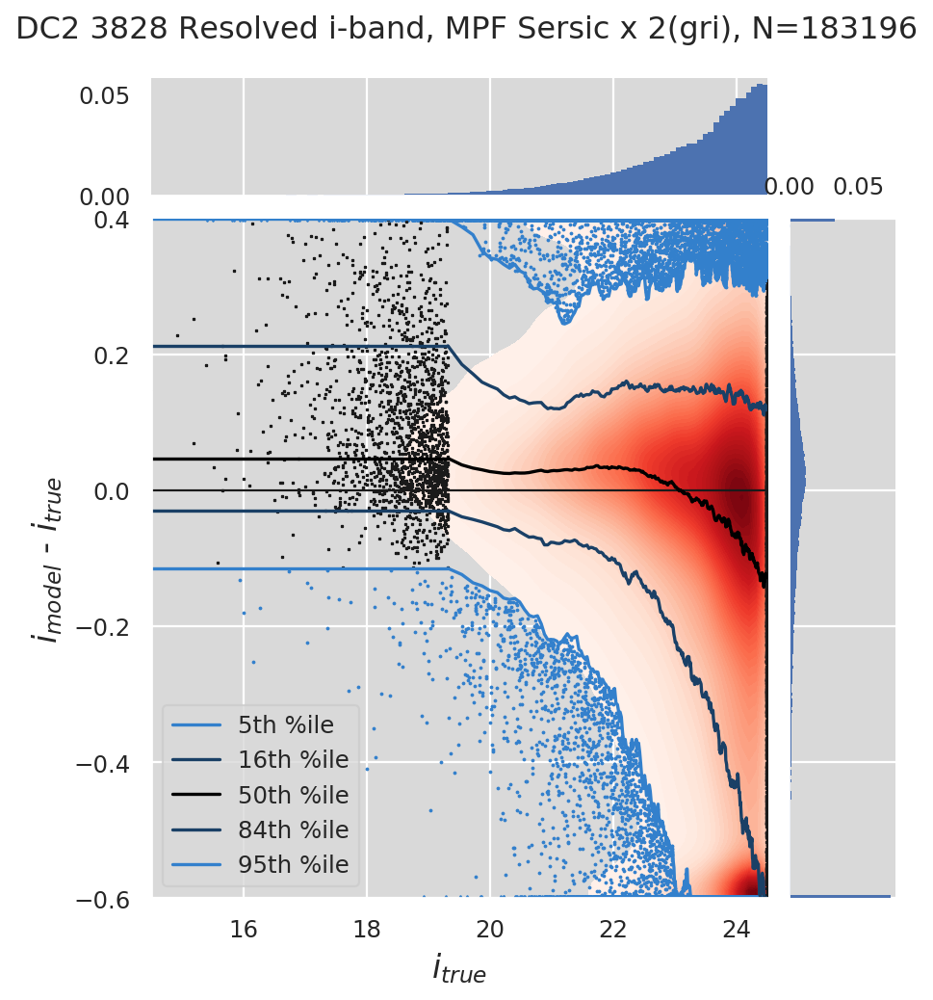

DC2 3828 Resolved g-r, MPF Sersic x 2, N=114724


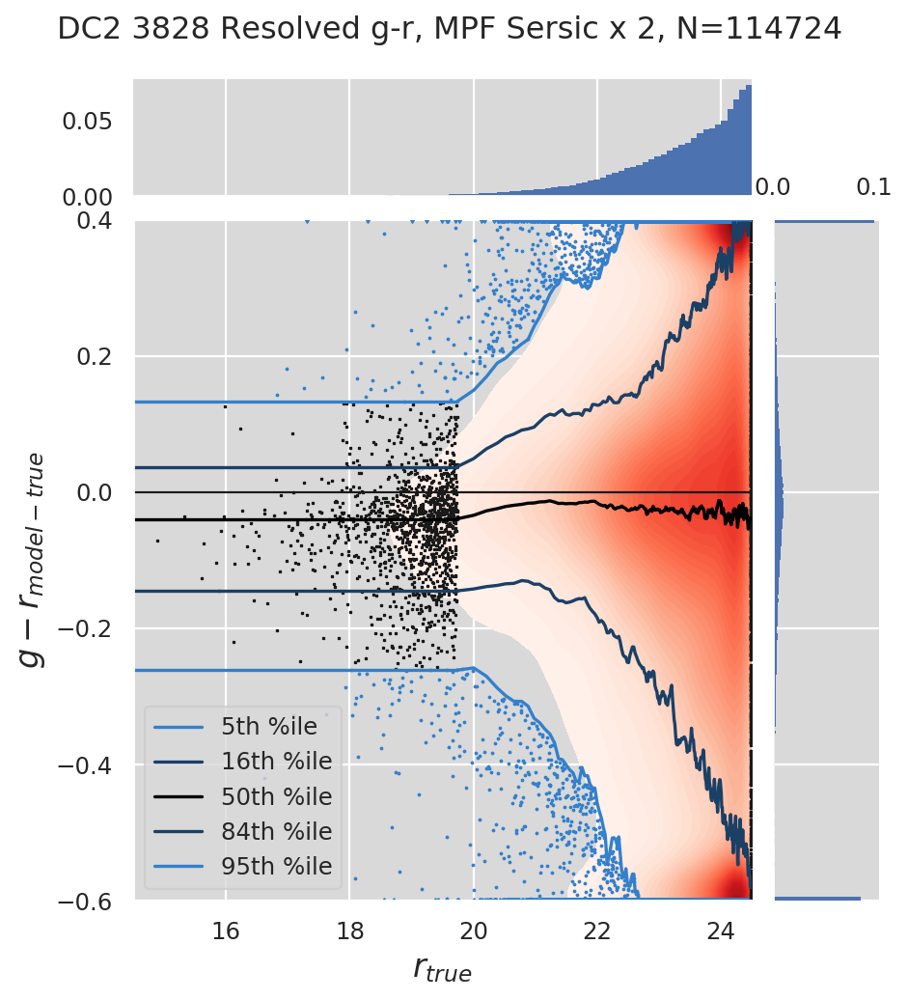

DC2 3828 Resolved g-r, MPF Sersic x 2(gri), N=129767


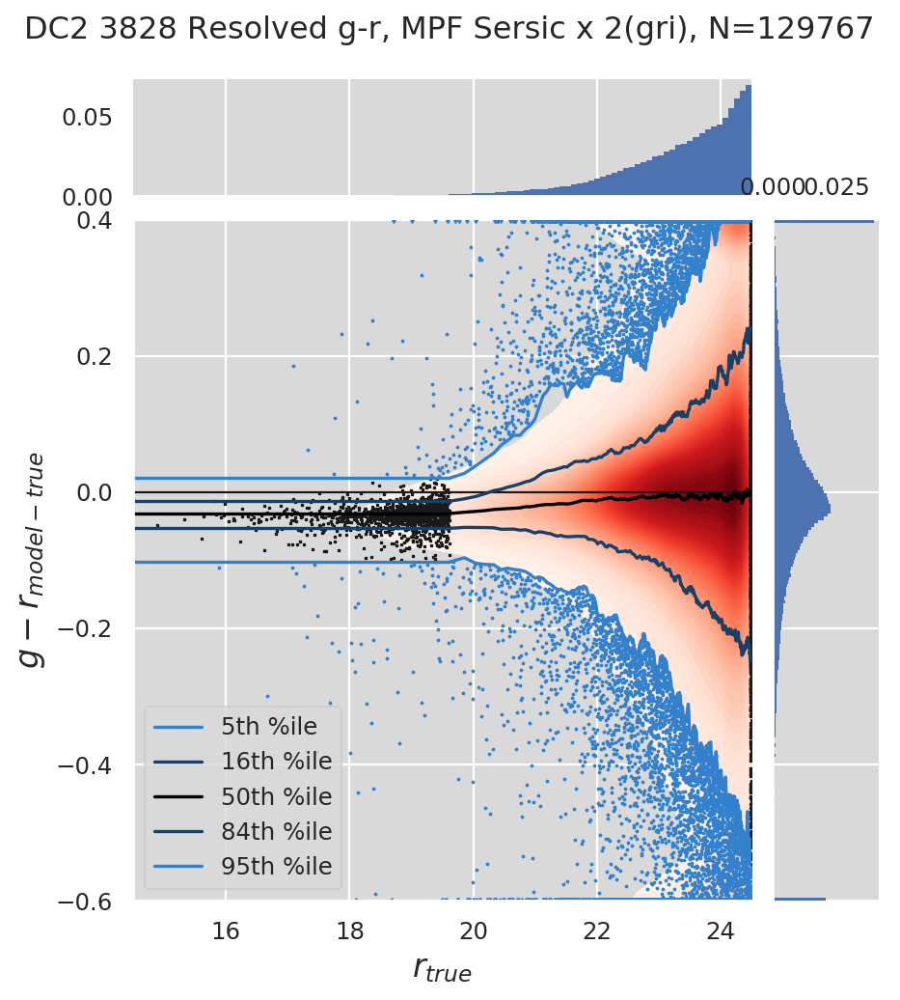

DC2 3828 Resolved r-i, MPF Sersic x 2, N=114544


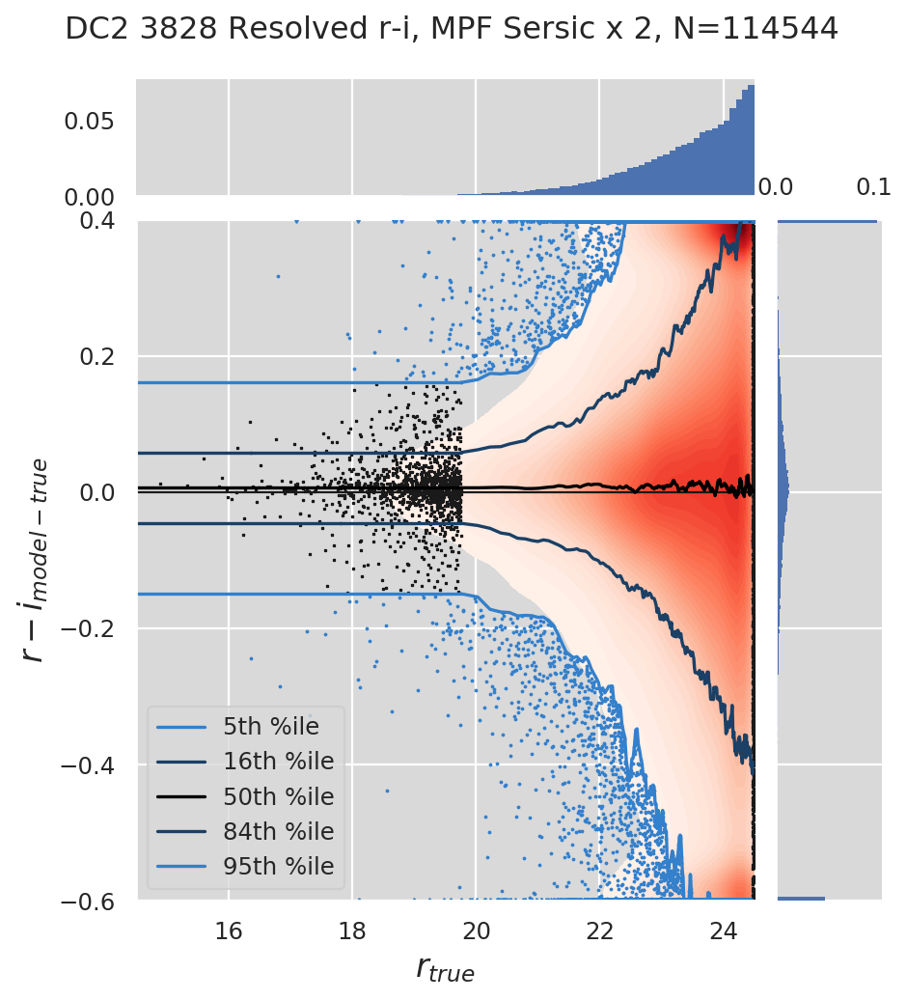

DC2 3828 Resolved r-i, MPF Sersic x 2(gri), N=129767


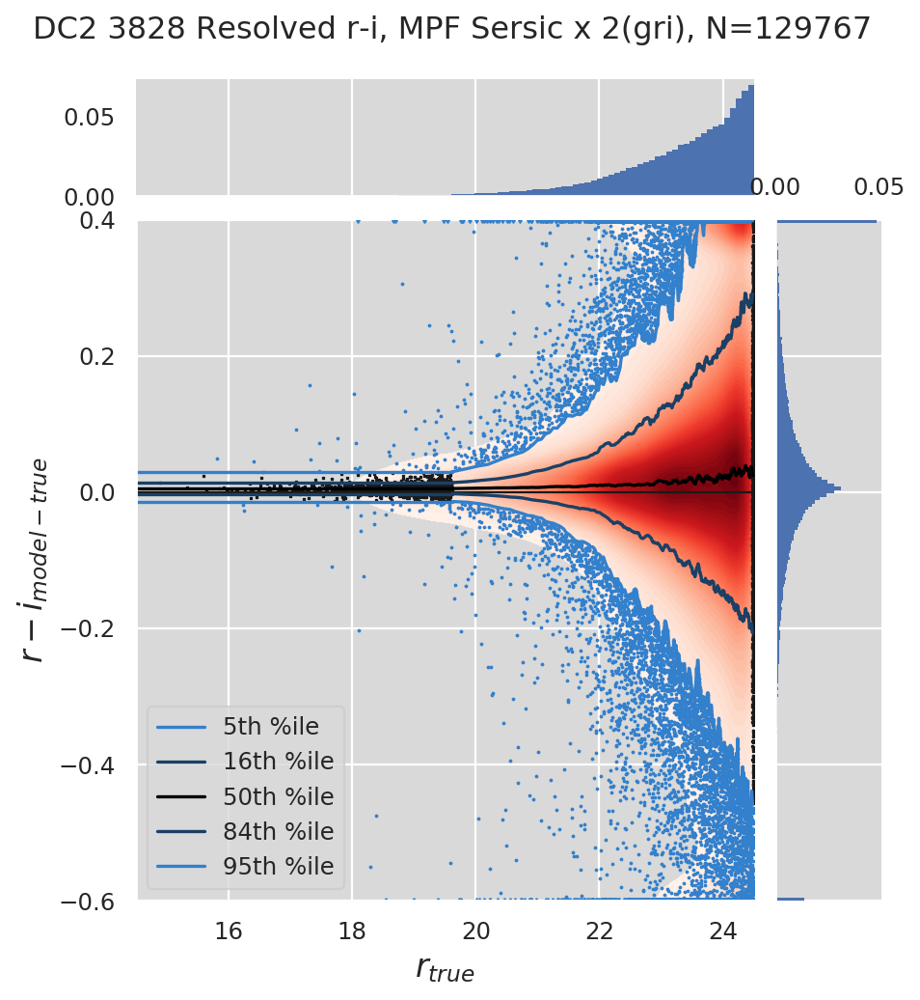

DC2 3828 Resolved g-band, MPF Sersic x 2 Free Amp., N=79636


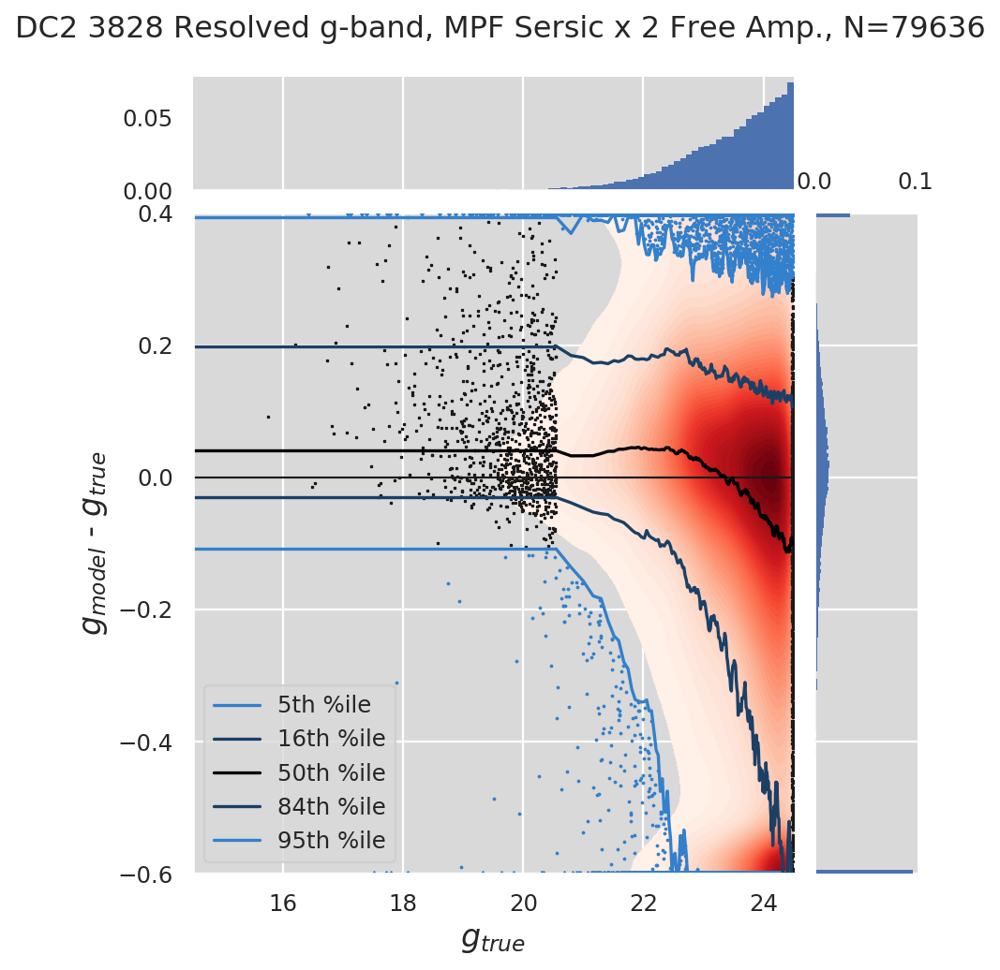

DC2 3828 Resolved g-band, MPF Sersic x 2 Free Amp.(gri), N=84818


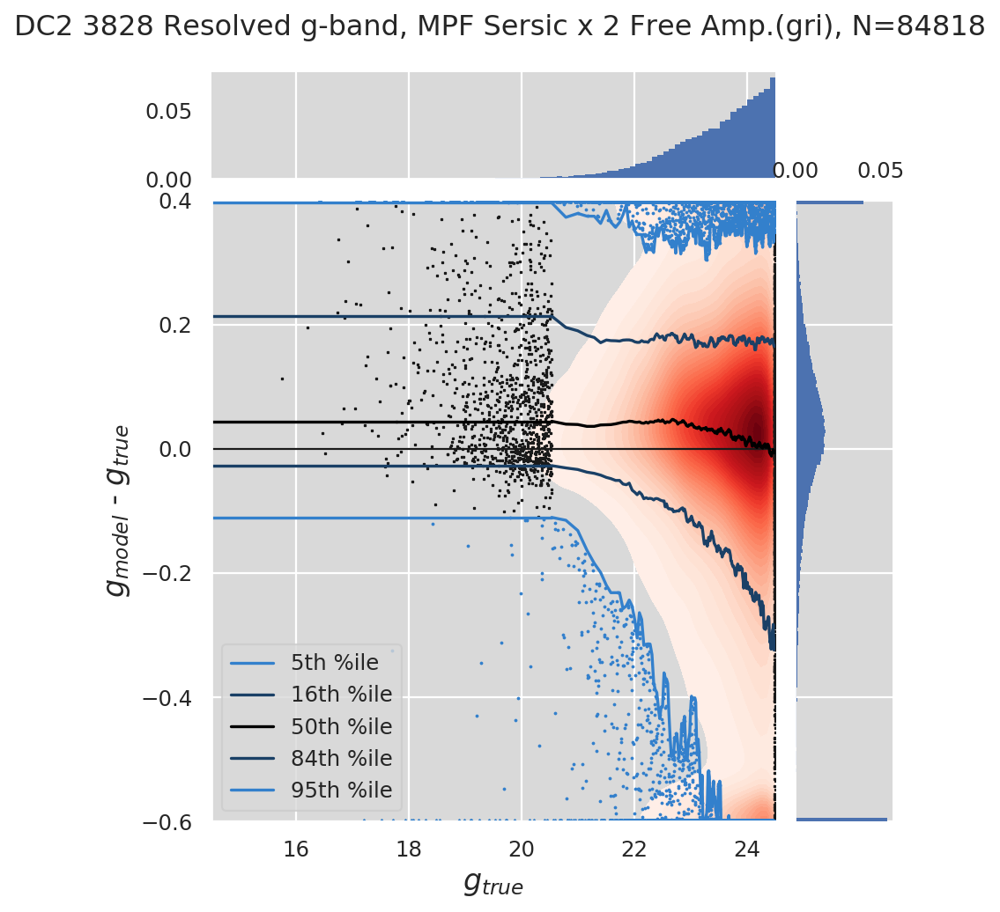

DC2 3828 Resolved r-band, MPF Sersic x 2 Free Amp., N=121818


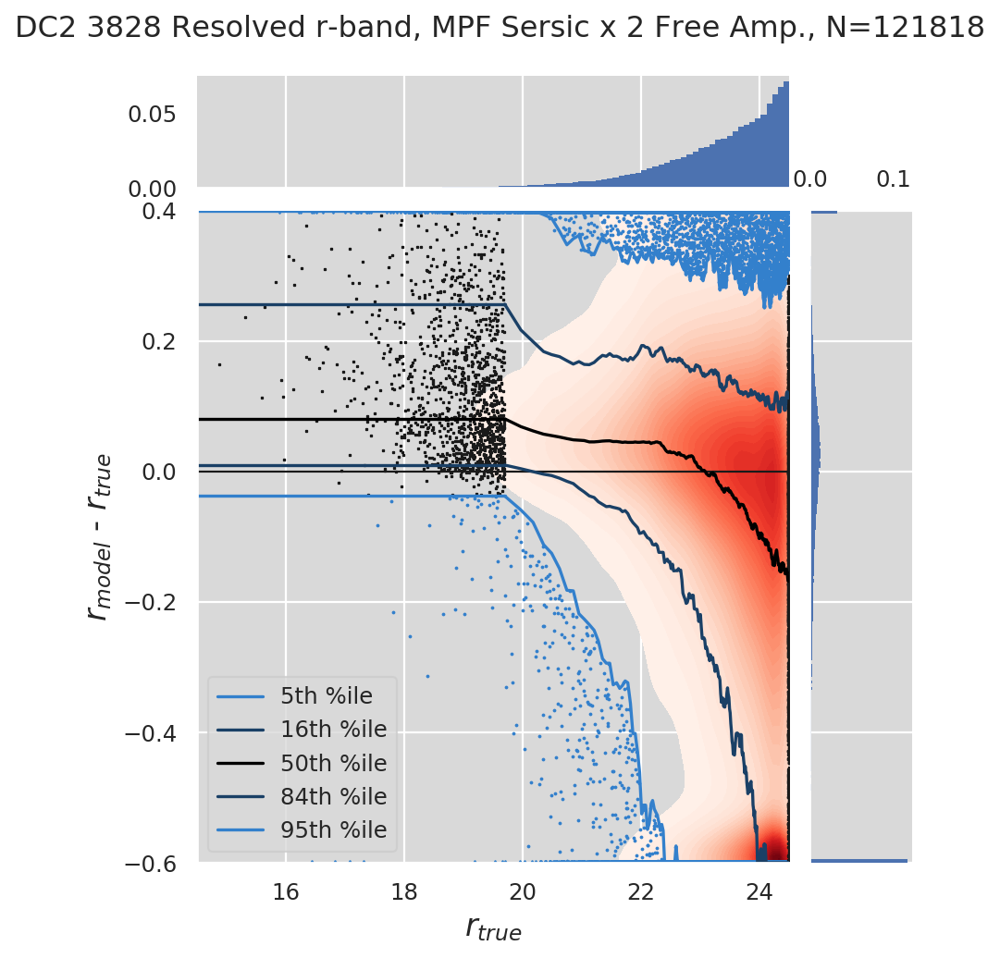

DC2 3828 Resolved r-band, MPF Sersic x 2 Free Amp.(gri), N=129767


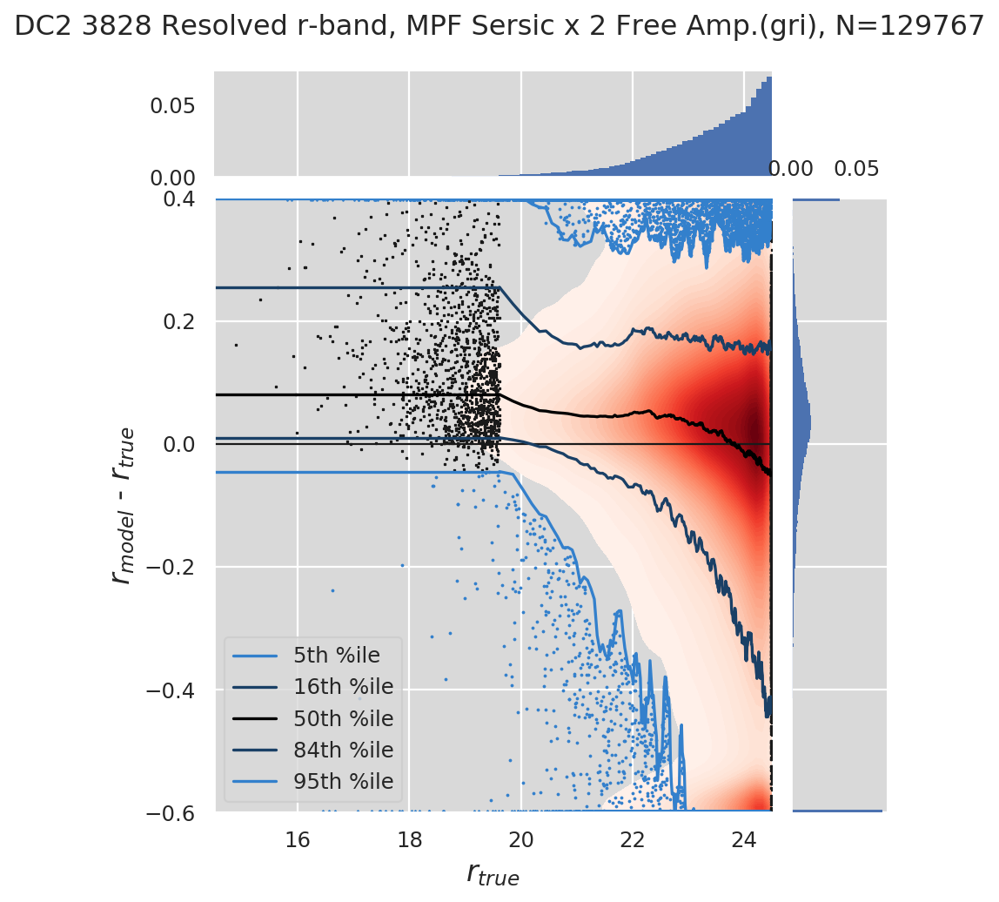

DC2 3828 Resolved i-band, MPF Sersic x 2 Free Amp., N=172426


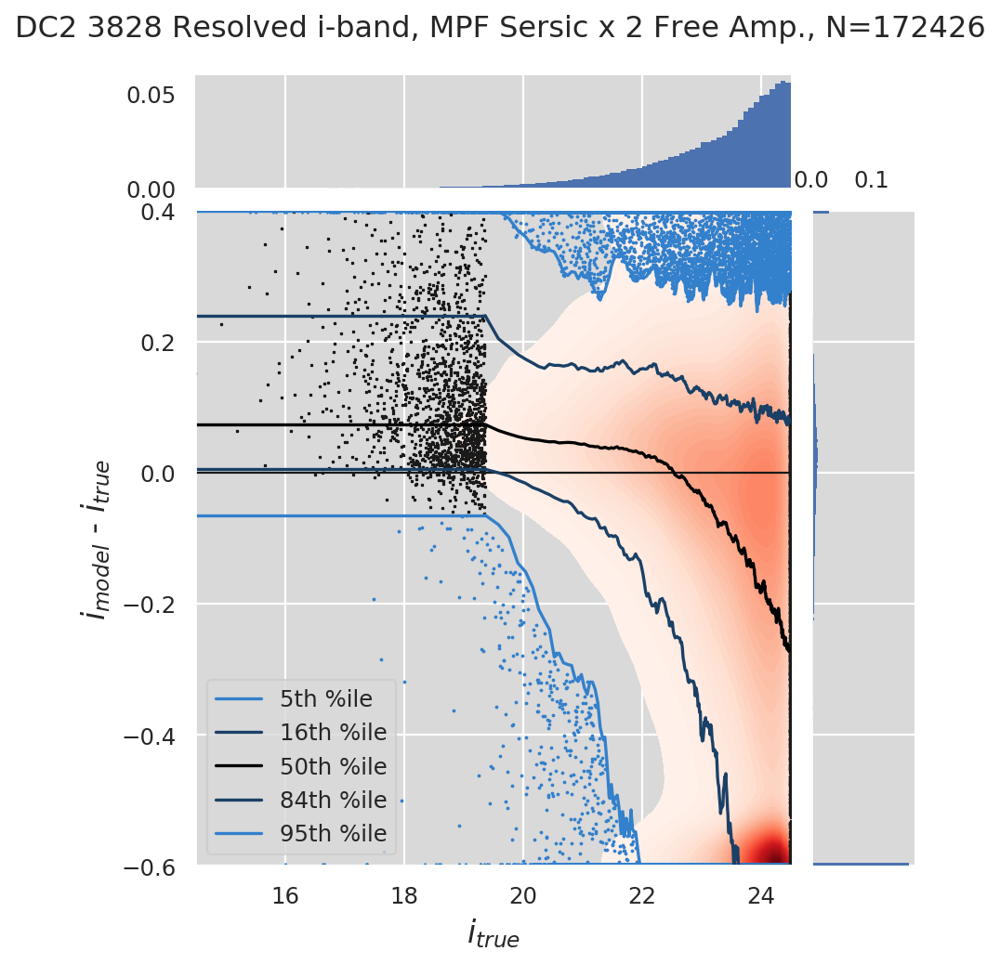

DC2 3828 Resolved i-band, MPF Sersic x 2 Free Amp.(gri), N=183196


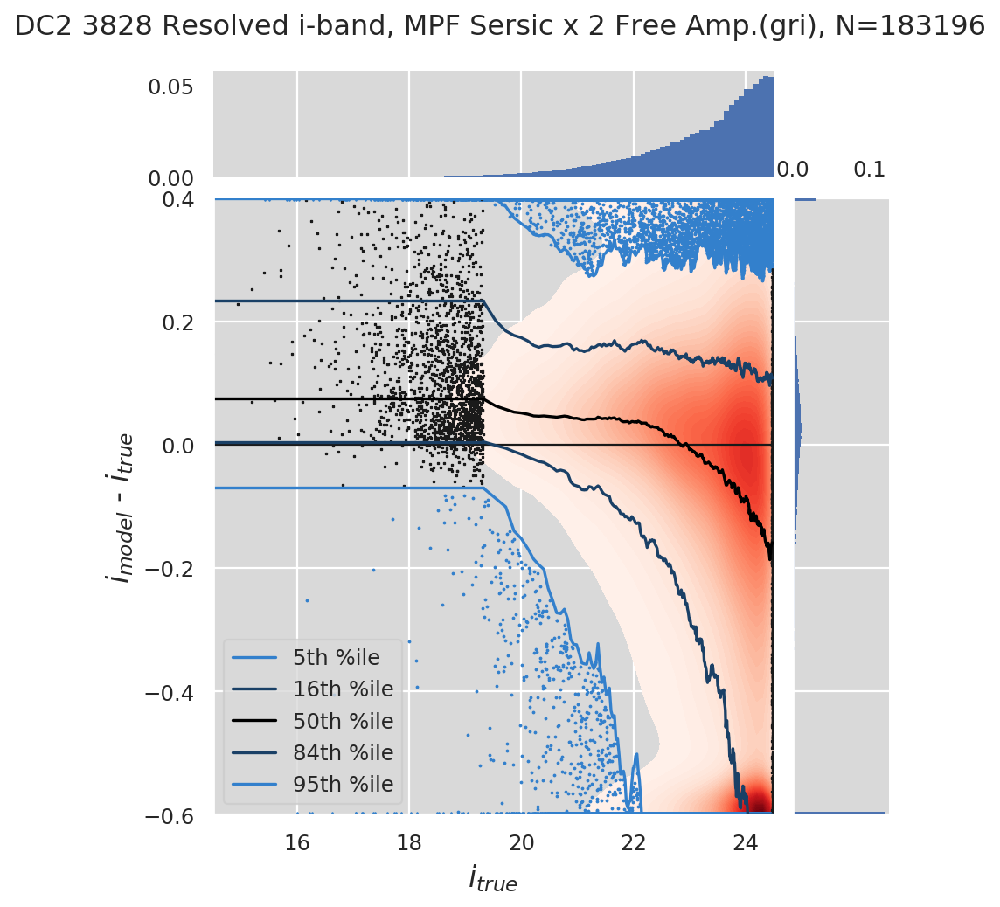

DC2 3828 Resolved g-r, MPF Sersic x 2 Free Amp., N=114724


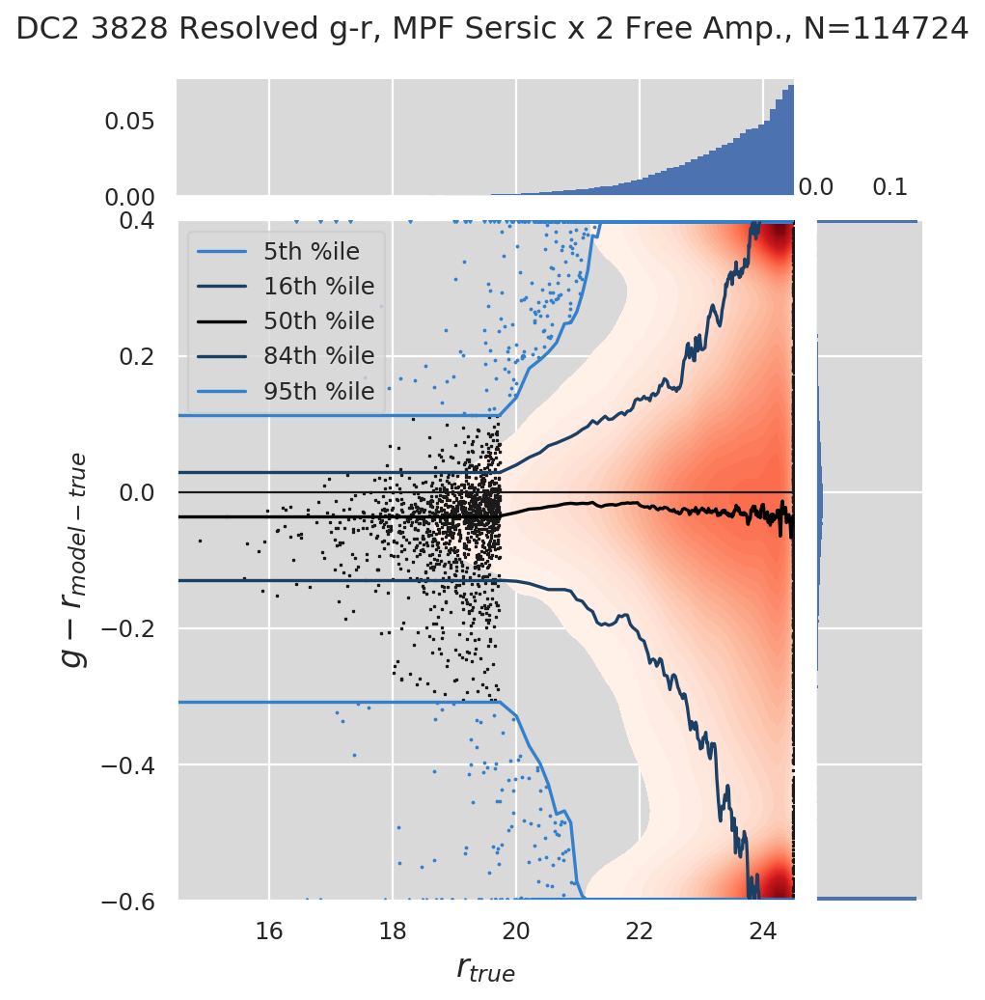

DC2 3828 Resolved g-r, MPF Sersic x 2 Free Amp.(gri), N=129767


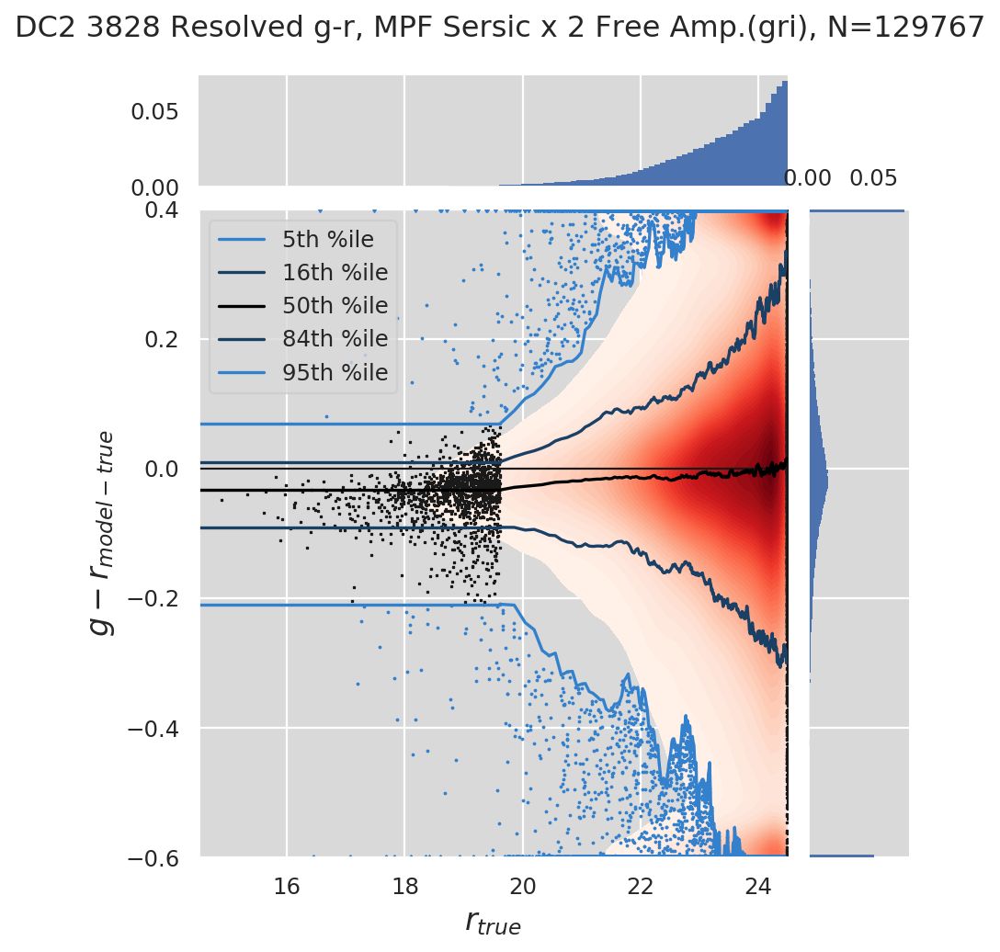

DC2 3828 Resolved r-i, MPF Sersic x 2 Free Amp., N=114543


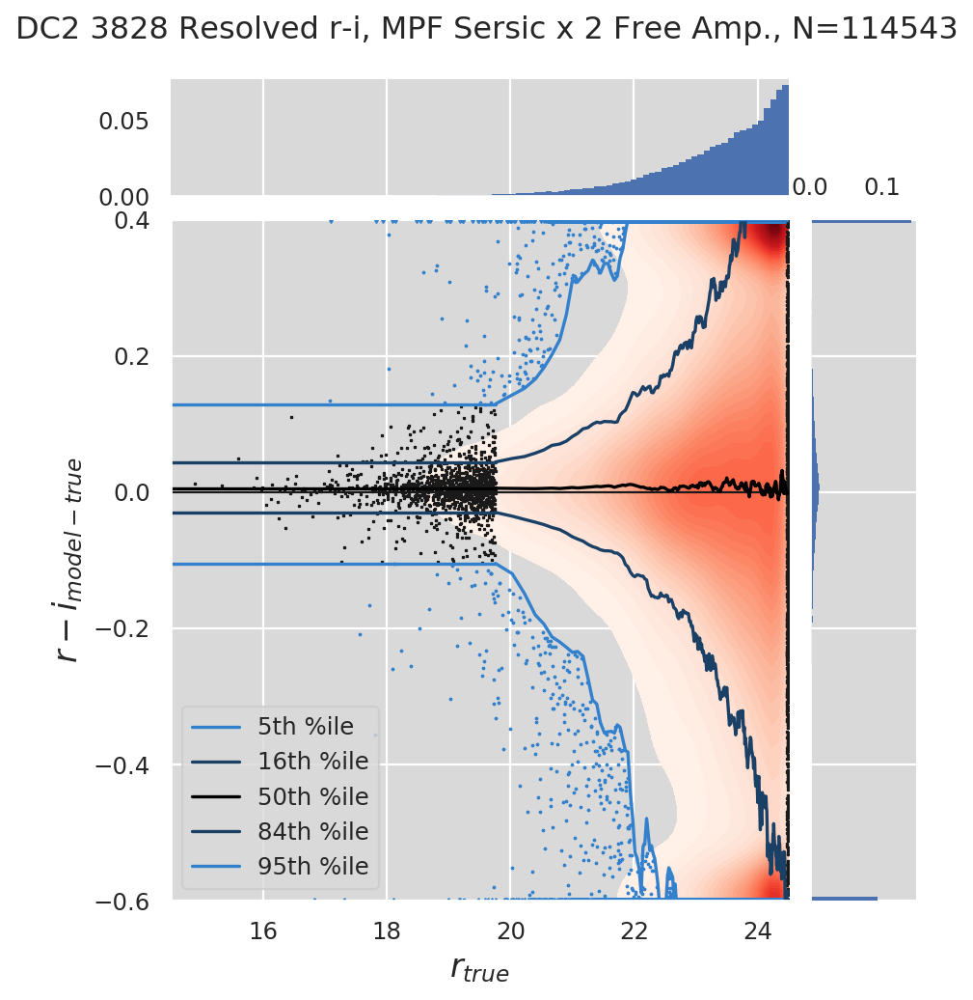

DC2 3828 Resolved r-i, MPF Sersic x 2 Free Amp.(gri), N=129767


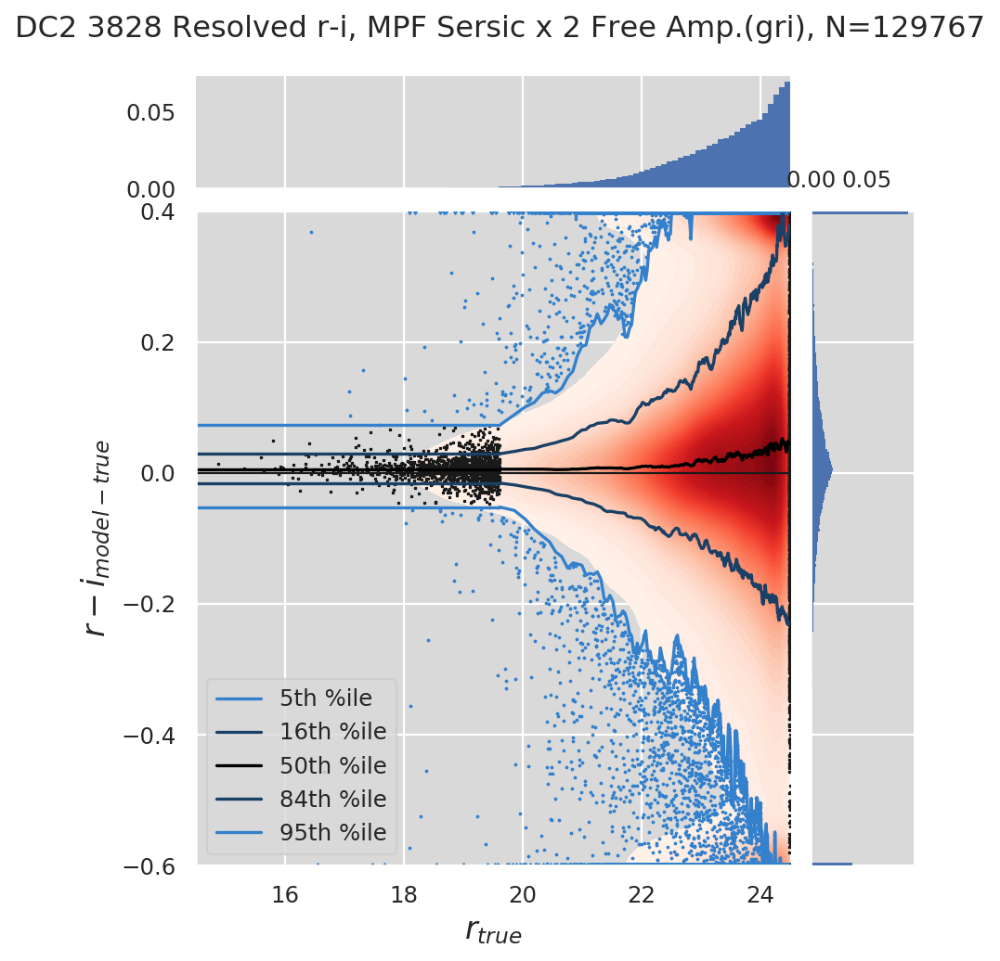

In [9]:
# Galaxies
plot_matches(
    cats, True, models, filters_single, band_ref=band_ref, band_multi=band_multi,
    band_ref_multi=band_ref, mag_max=24.5, match_dist_asec=0.168,
    plot_compure=False, rematch=True, **args_type['resolved'], **args
)

## Point source fluxes and colours

There's not much to say here, other than that the stars look basically fine up to the saturation limit of ~16 and the choice of PSF/source model and single- vs multi-band fitting makes little difference. Someone more versed in stellar photometry might have more to say about the small biases in the medians, outliers, etc.

N=0 sky object matches
Rematched 134/10797; 9209 originally and 9209 rematched already matched
N=0sky object matches after rematching
DC2 3828 Unresolved g-band, MPF CModel, N=6635


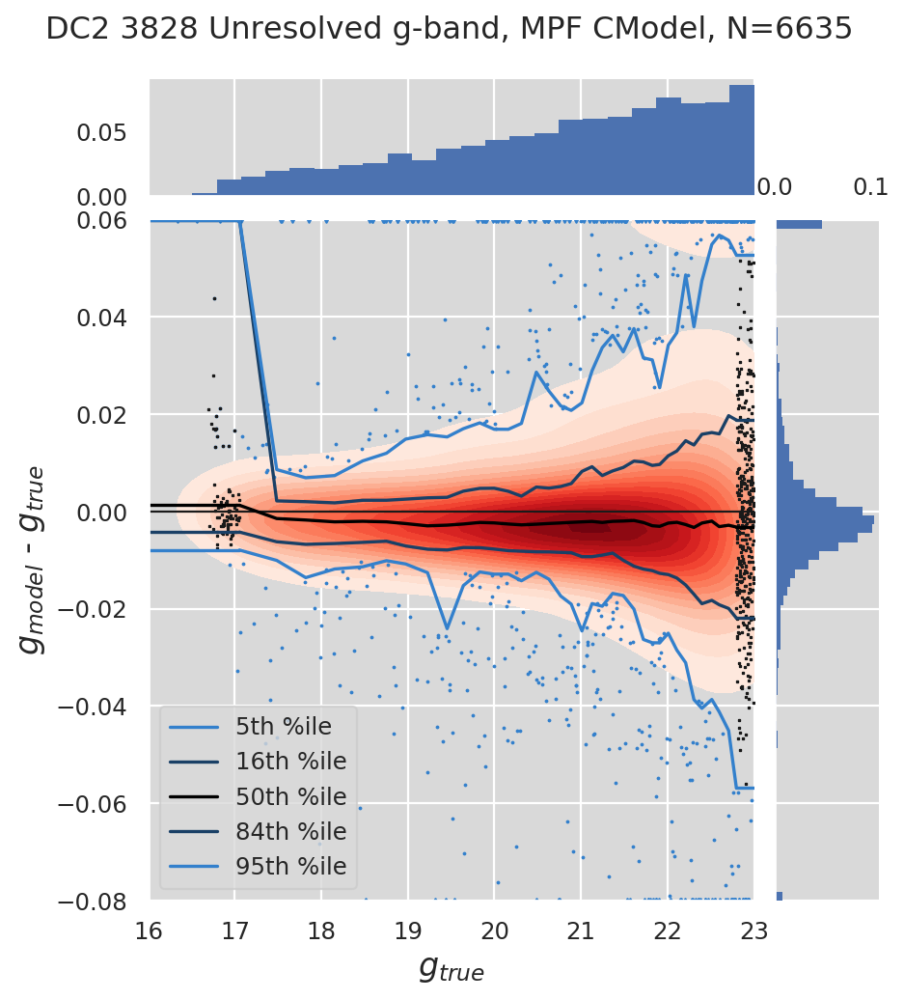

DC2 3828 Unresolved g-band, MPF CModel(gri), N=7007


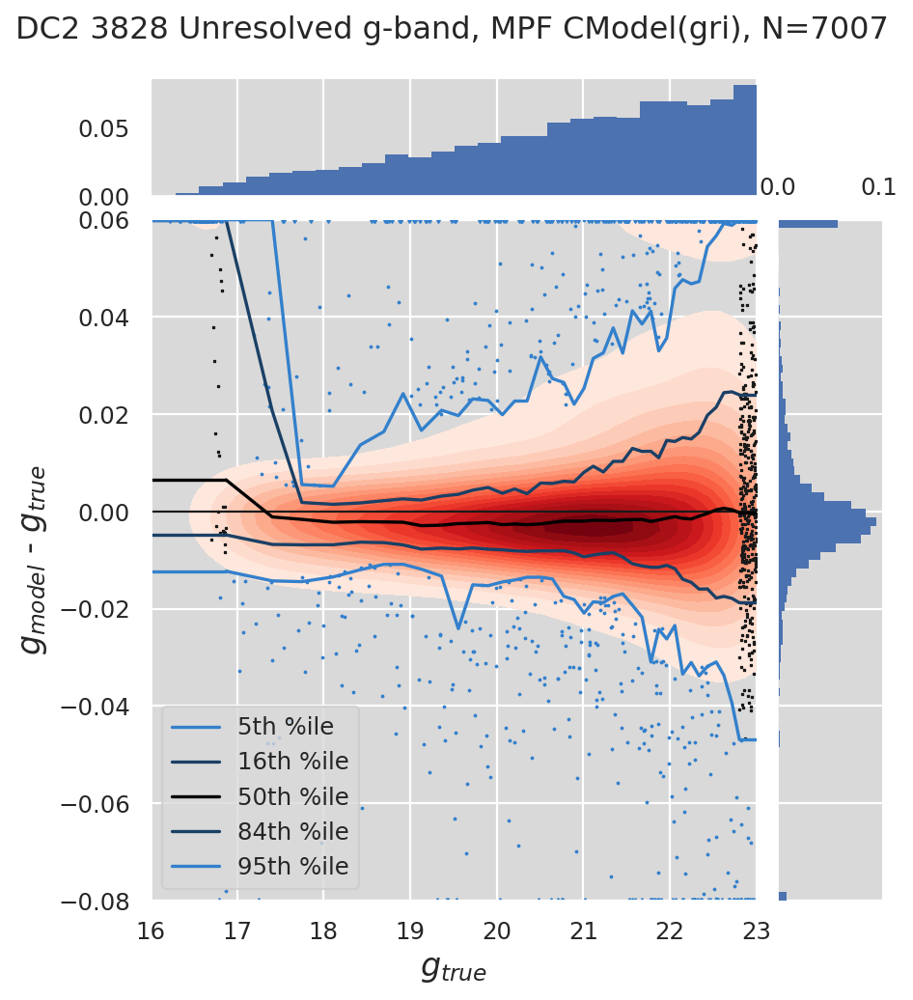

DC2 3828 Unresolved r-band, MPF CModel, N=8457


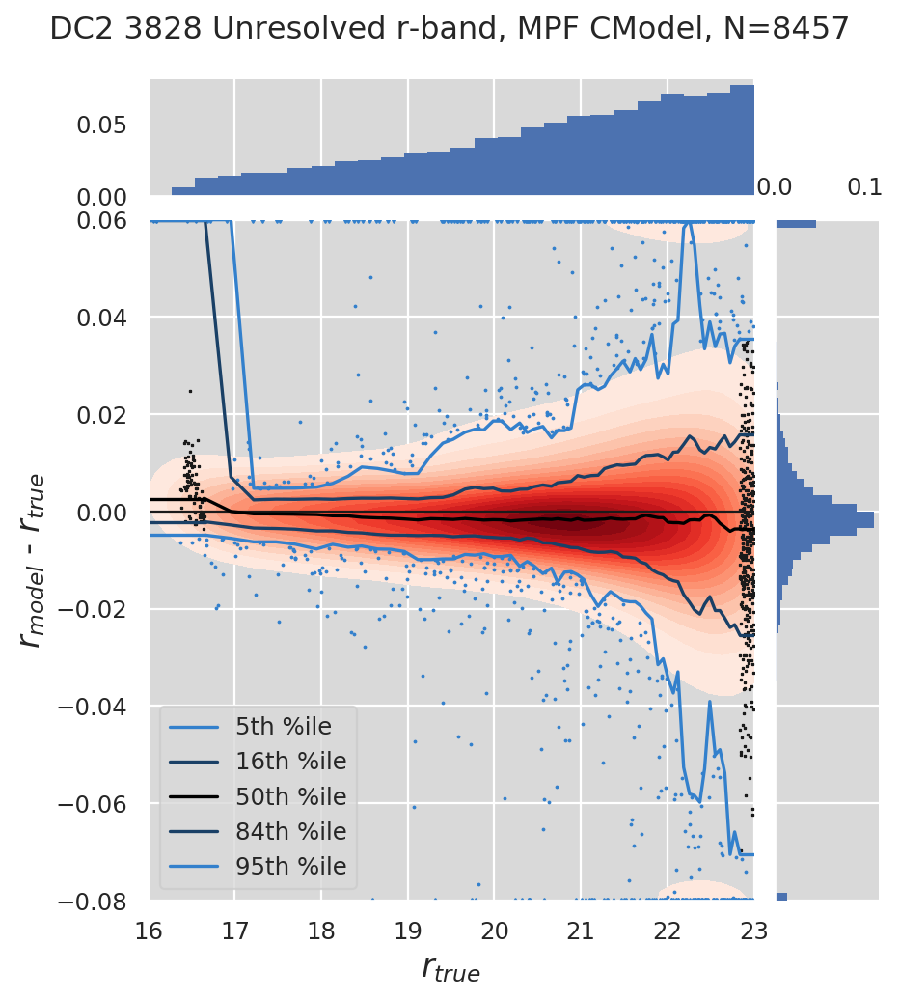

DC2 3828 Unresolved r-band, MPF CModel(gri), N=8976


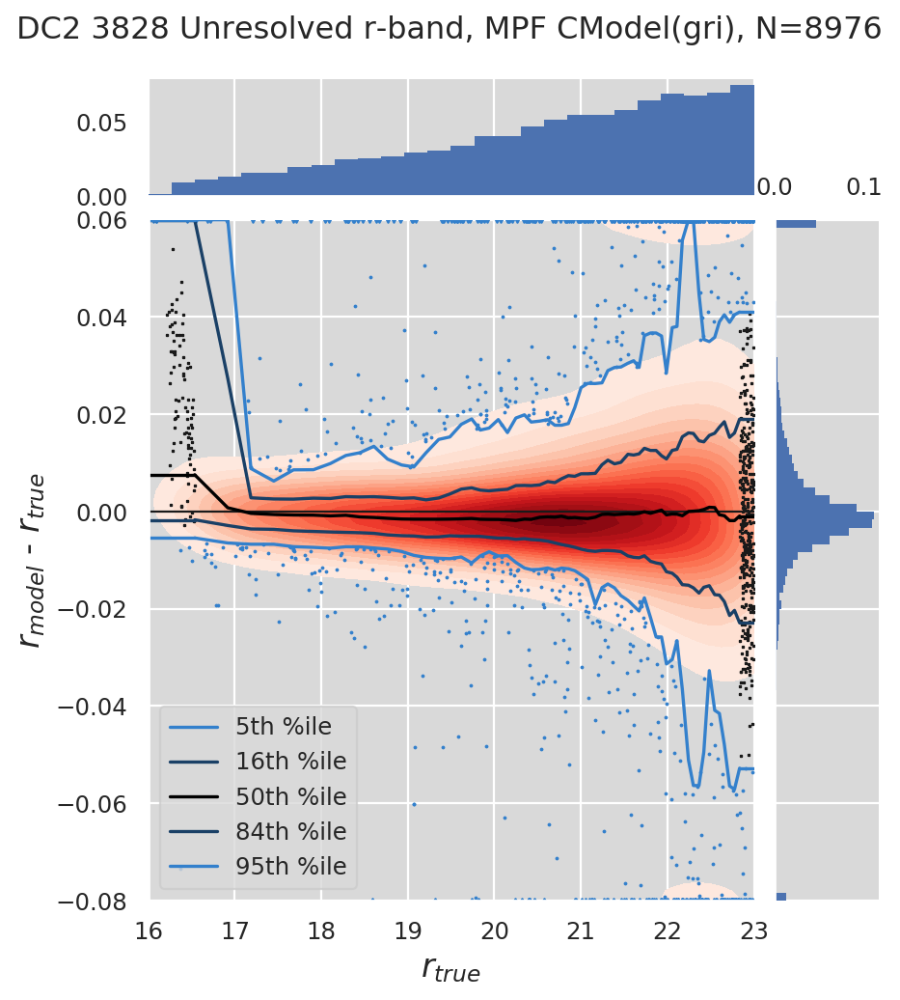

DC2 3828 Unresolved i-band, MPF CModel, N=8483


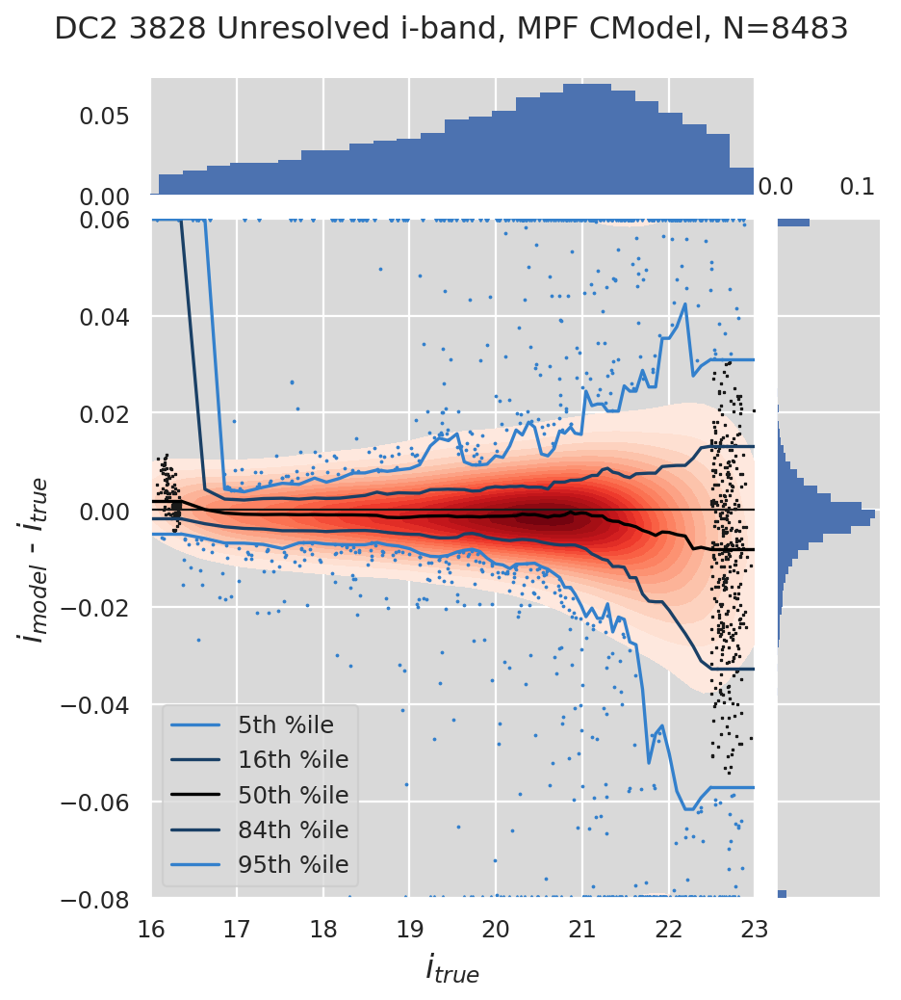

DC2 3828 Unresolved i-band, MPF CModel(gri), N=8977


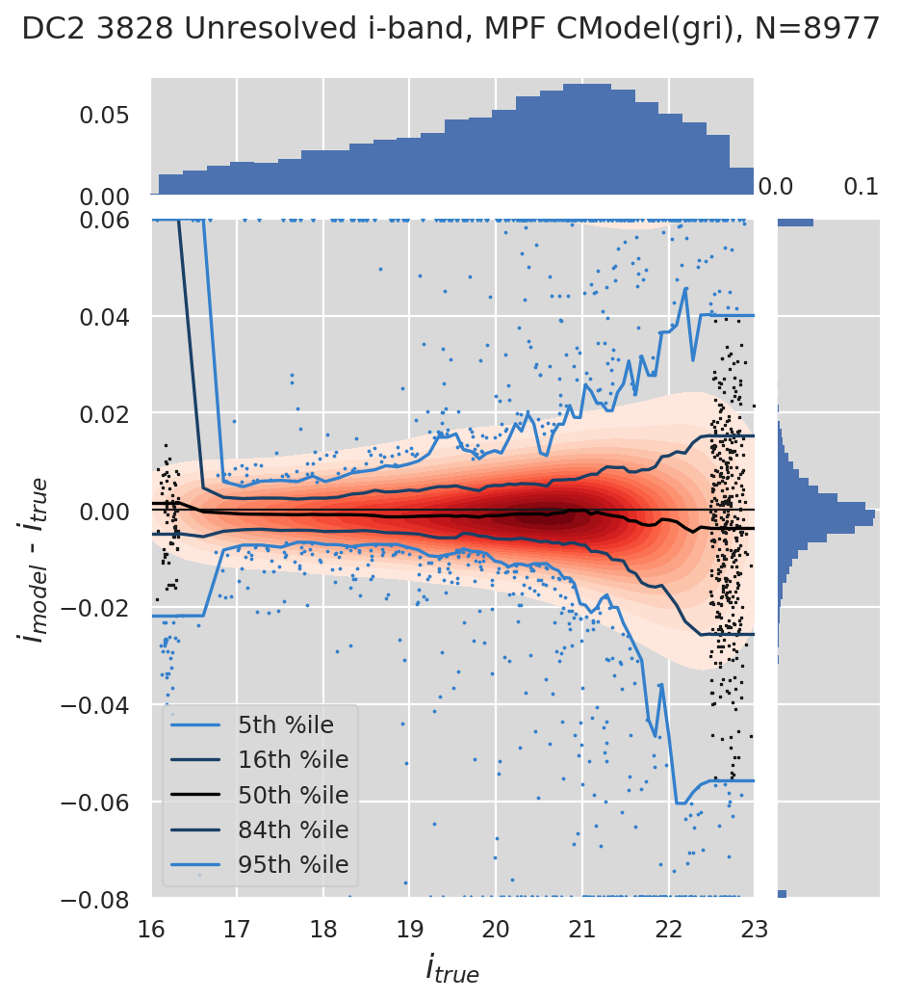

DC2 3828 Unresolved g-r, MPF CModel, N=7965


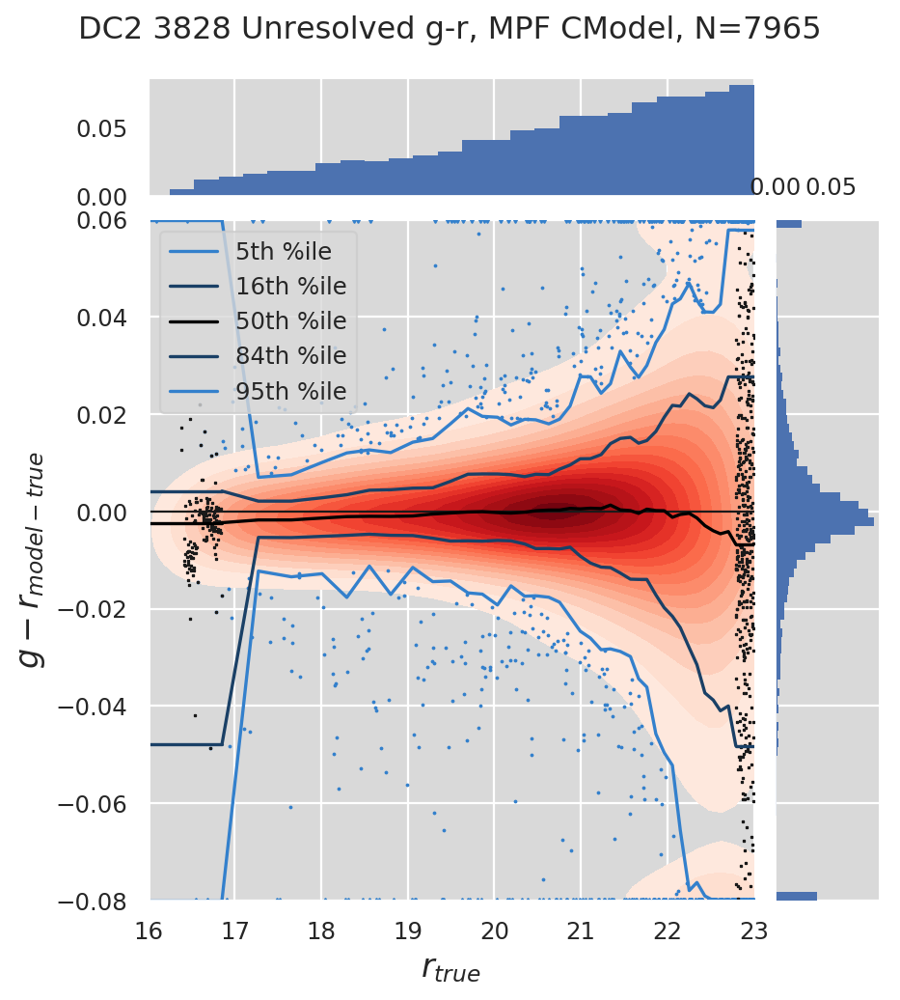

DC2 3828 Unresolved g-r, MPF CModel(gri), N=8976


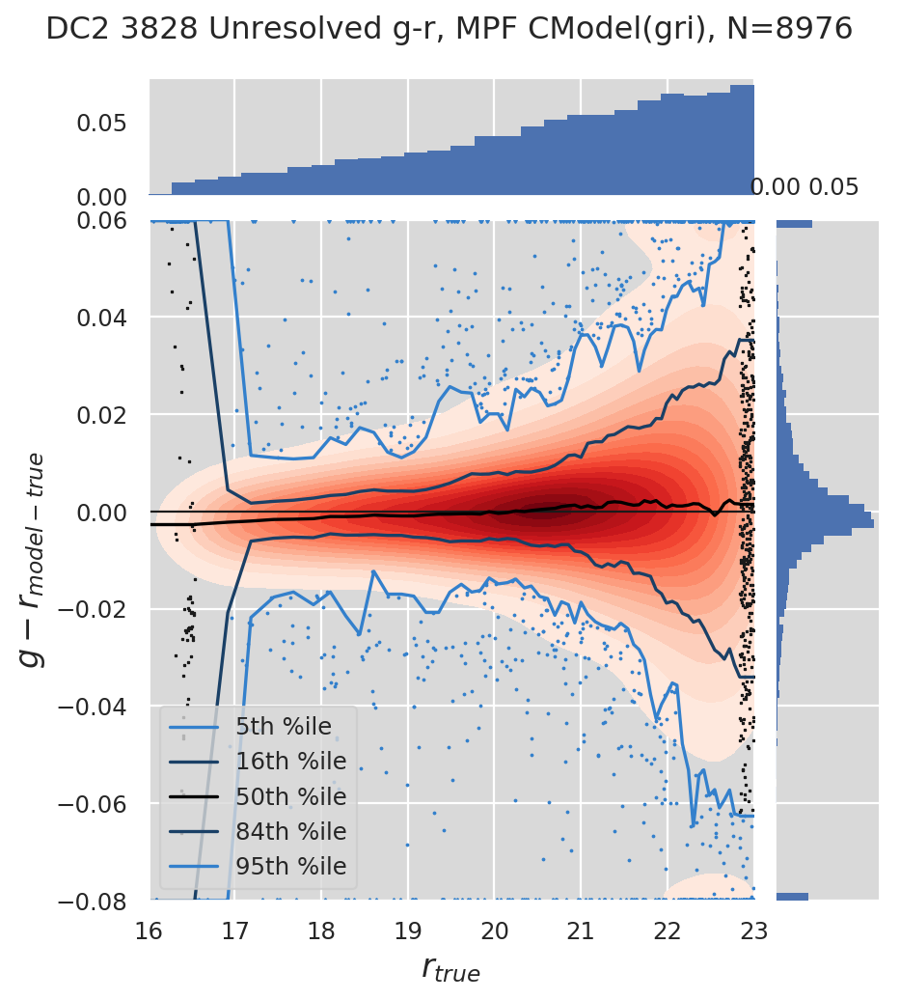

DC2 3828 Unresolved r-i, MPF CModel, N=7939


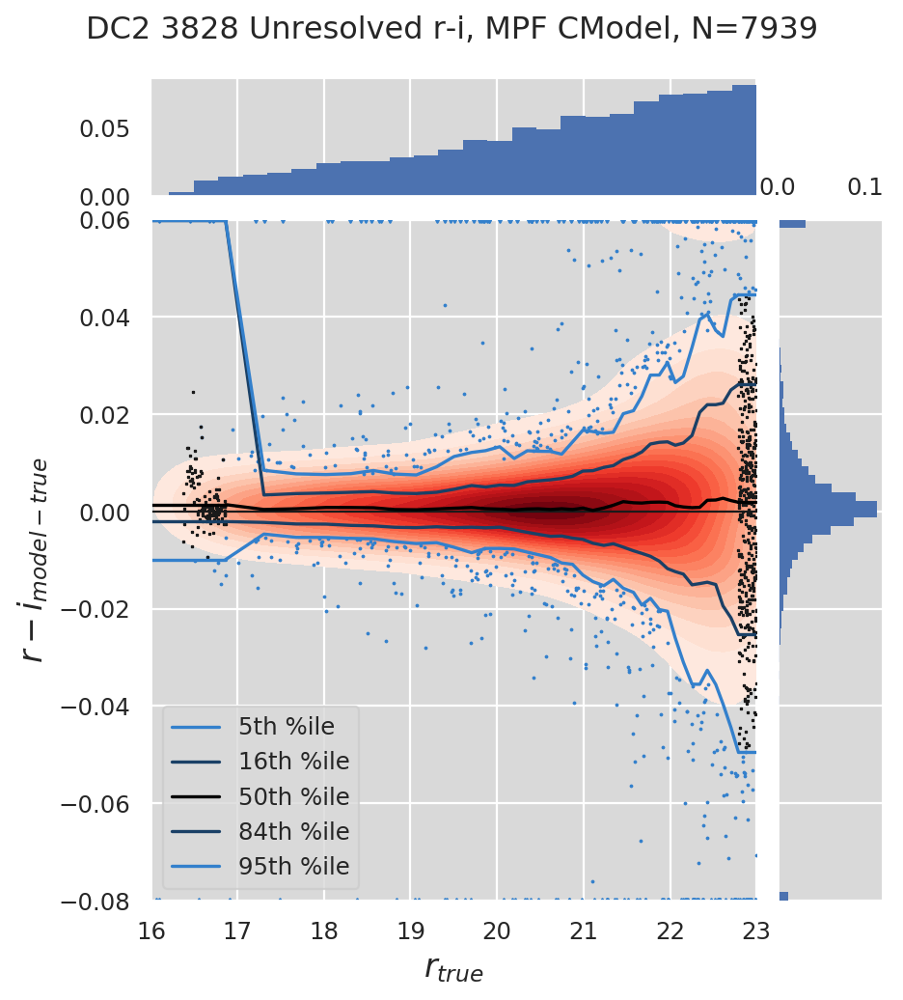

DC2 3828 Unresolved r-i, MPF CModel(gri), N=8976


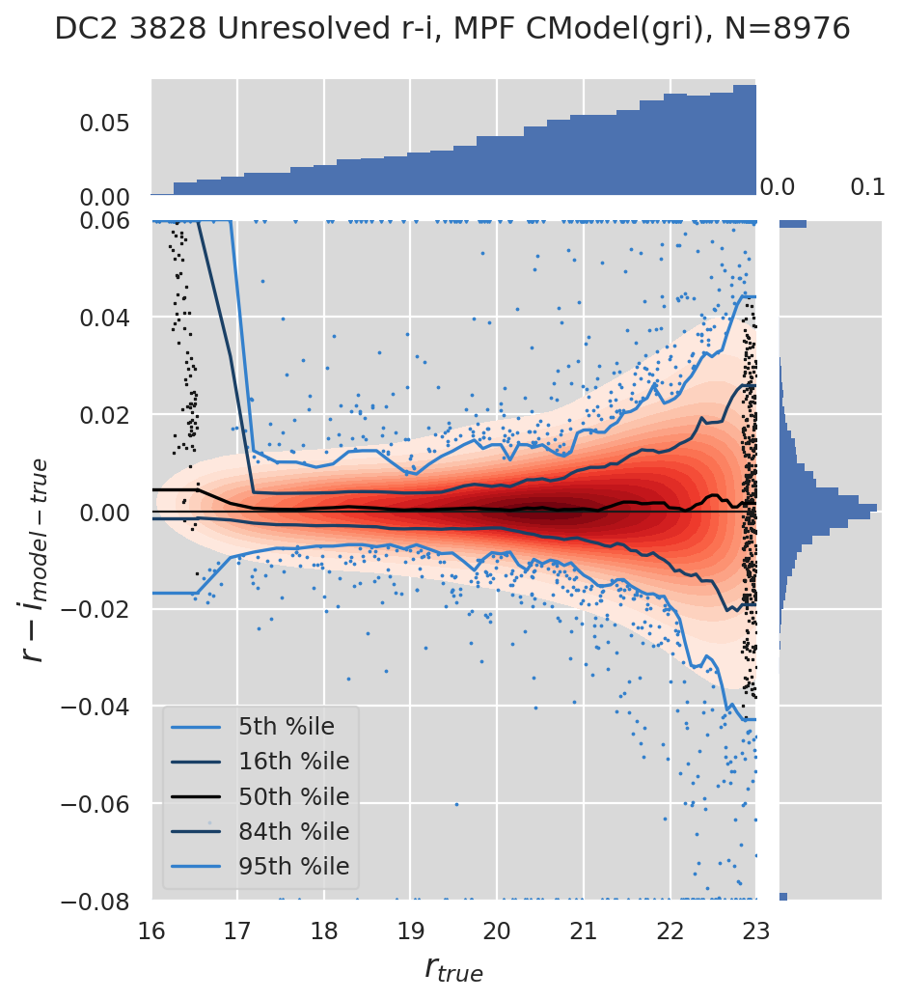

DC2 3828 Unresolved g-band, MPF Sersic, N=6635


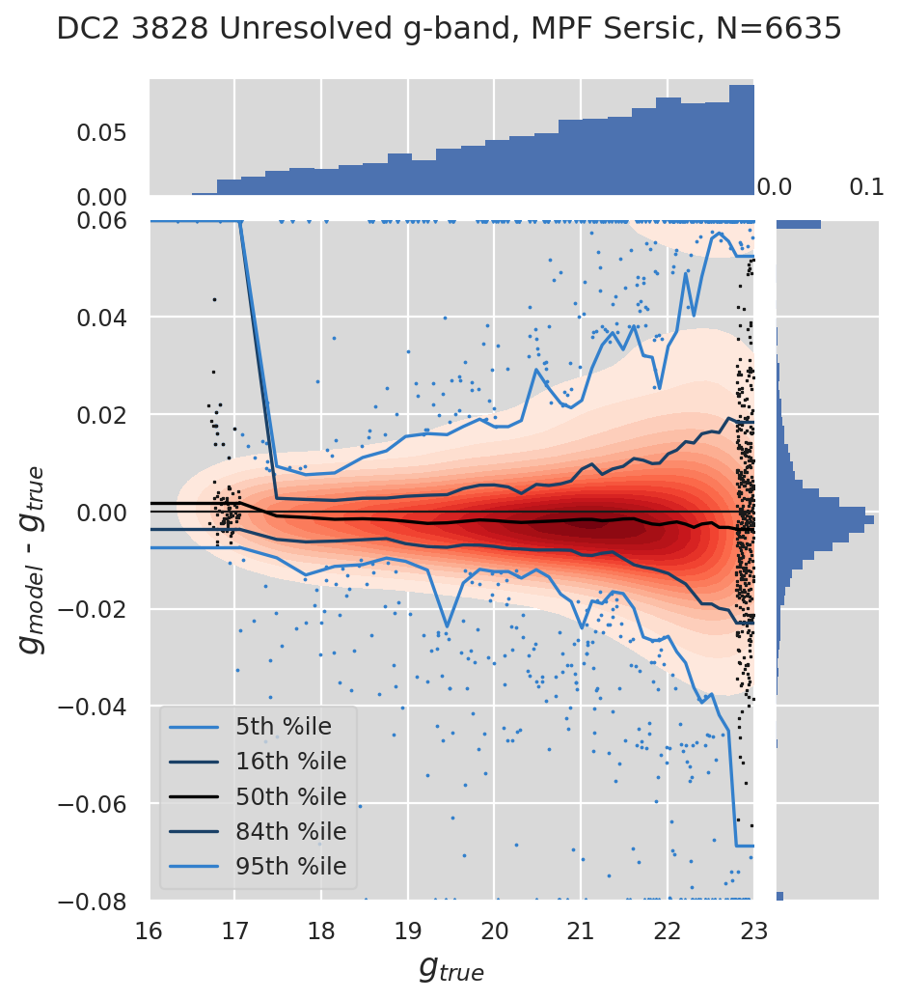

DC2 3828 Unresolved g-band, MPF Sersic(gri), N=7007


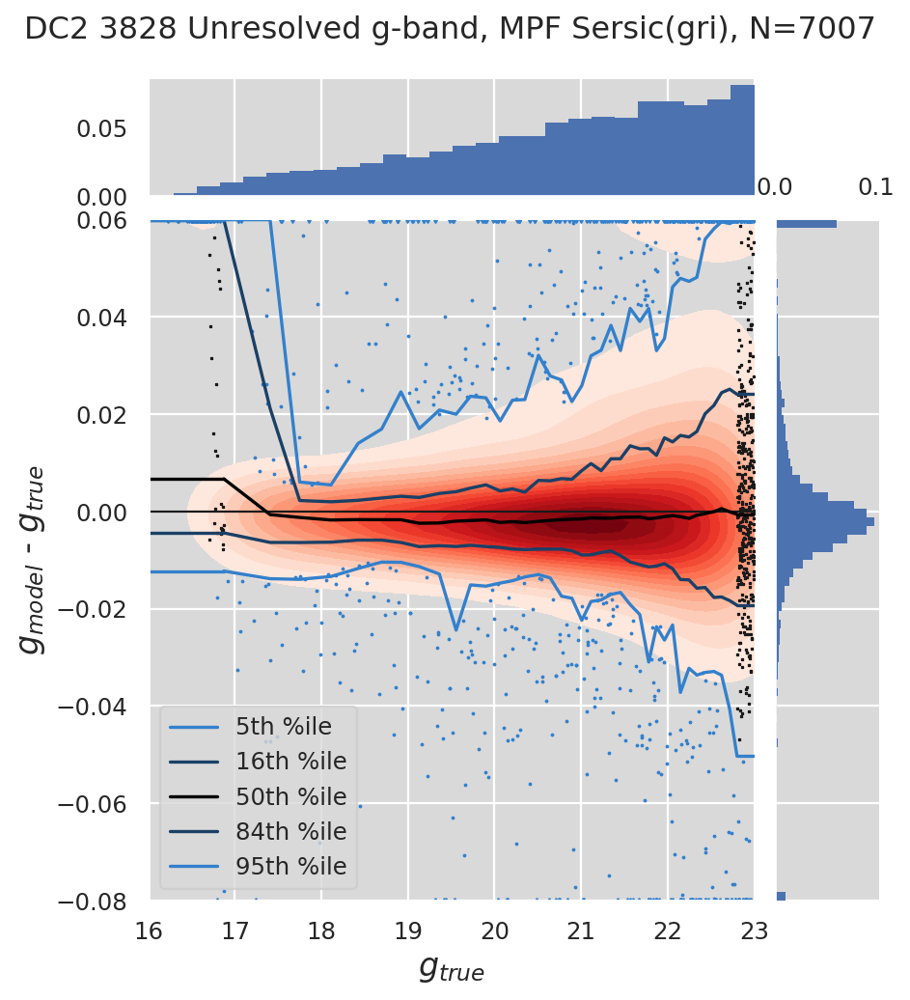

DC2 3828 Unresolved r-band, MPF Sersic, N=8457


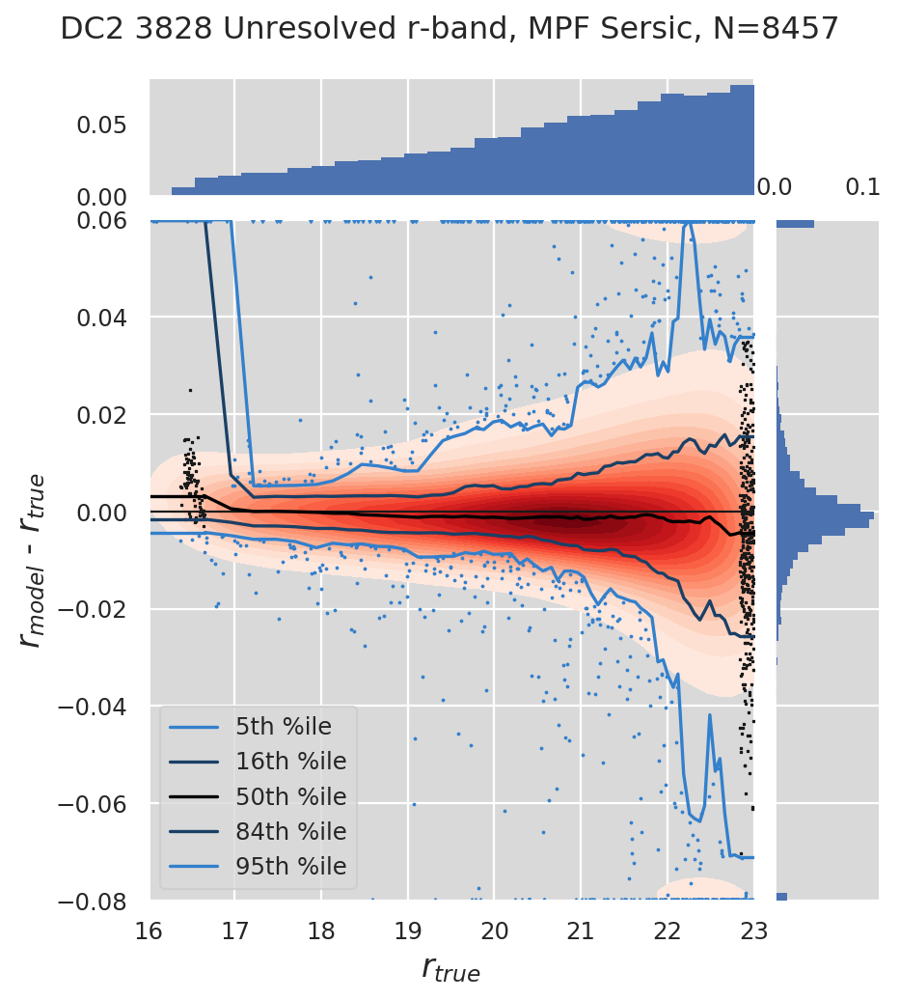

DC2 3828 Unresolved r-band, MPF Sersic(gri), N=8976


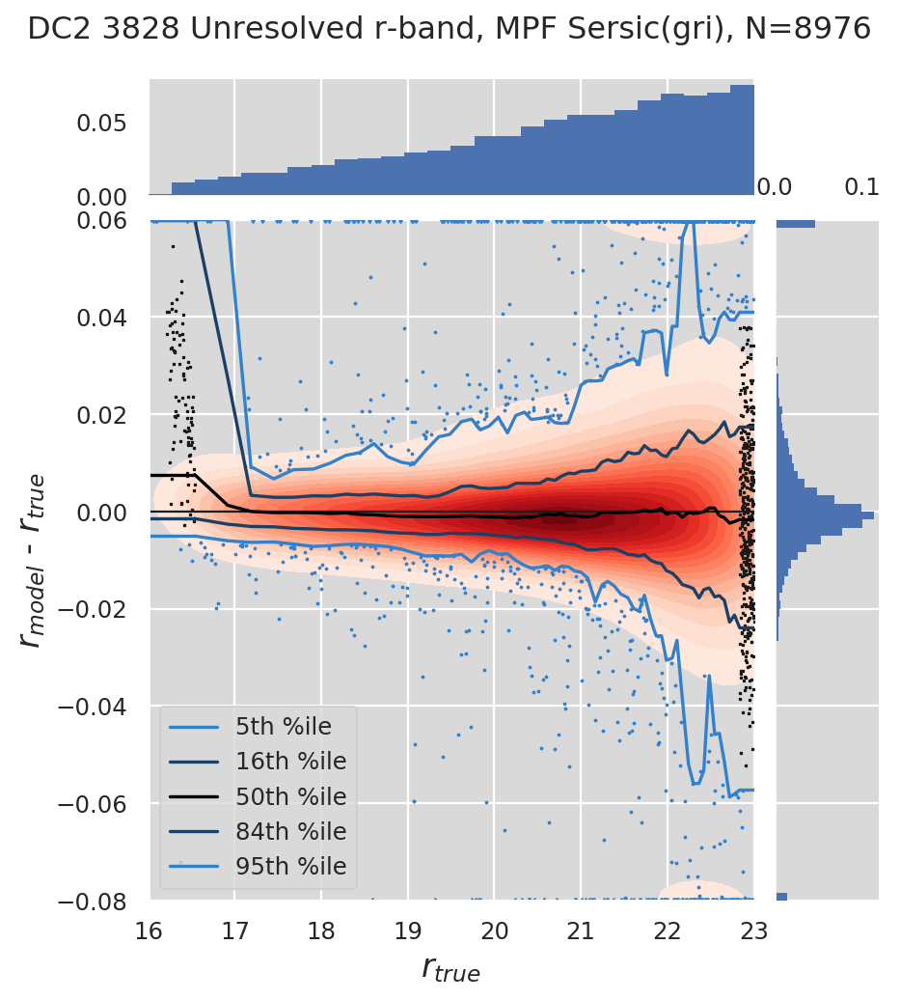

DC2 3828 Unresolved i-band, MPF Sersic, N=8483


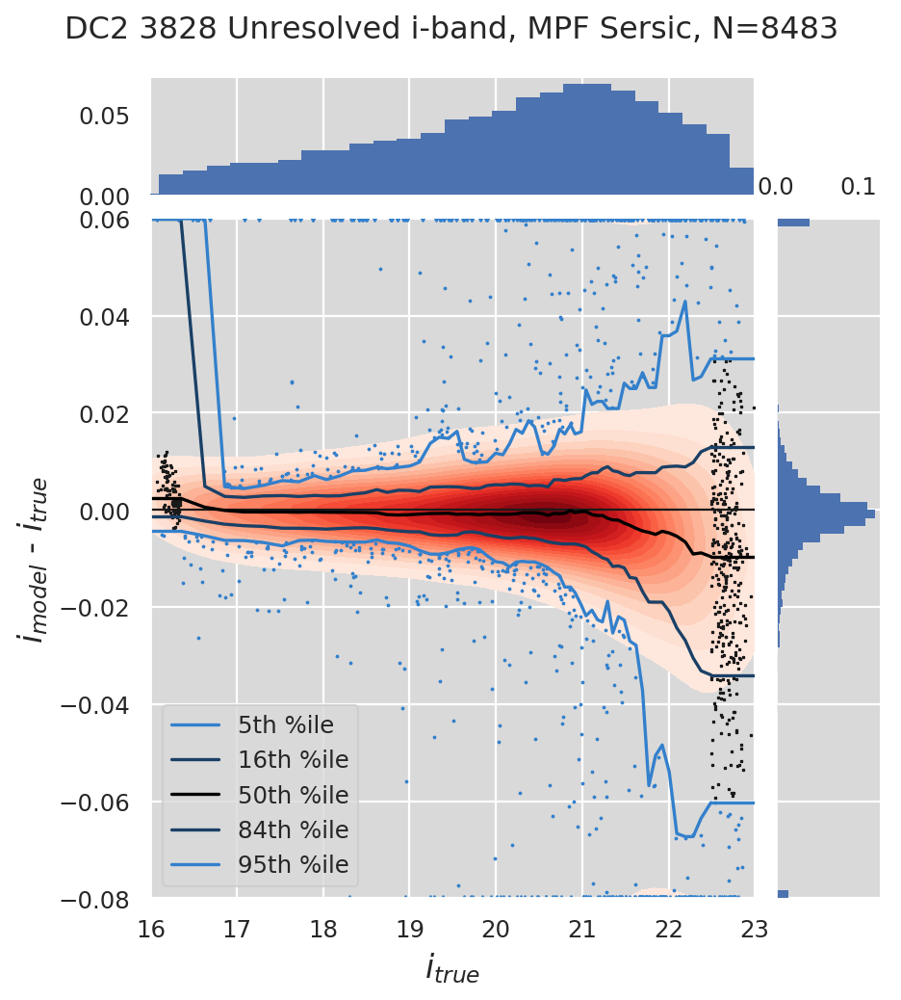

DC2 3828 Unresolved i-band, MPF Sersic(gri), N=8977


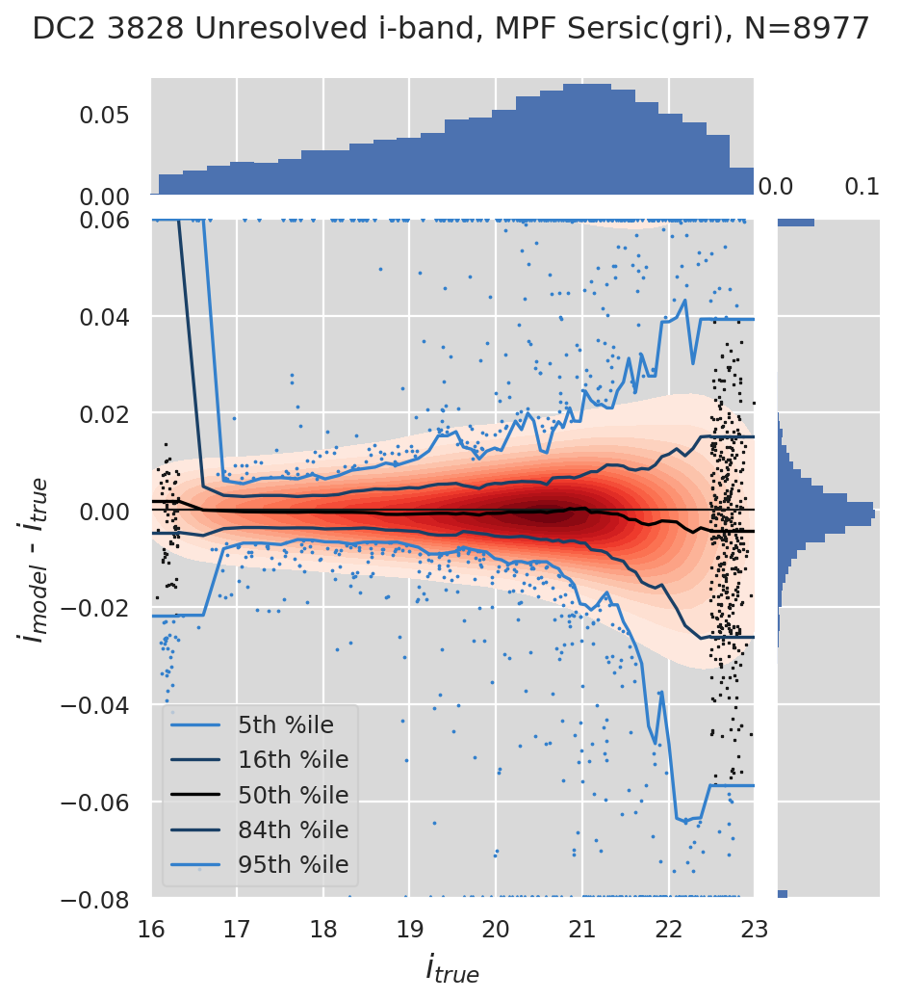

DC2 3828 Unresolved g-r, MPF Sersic, N=7965


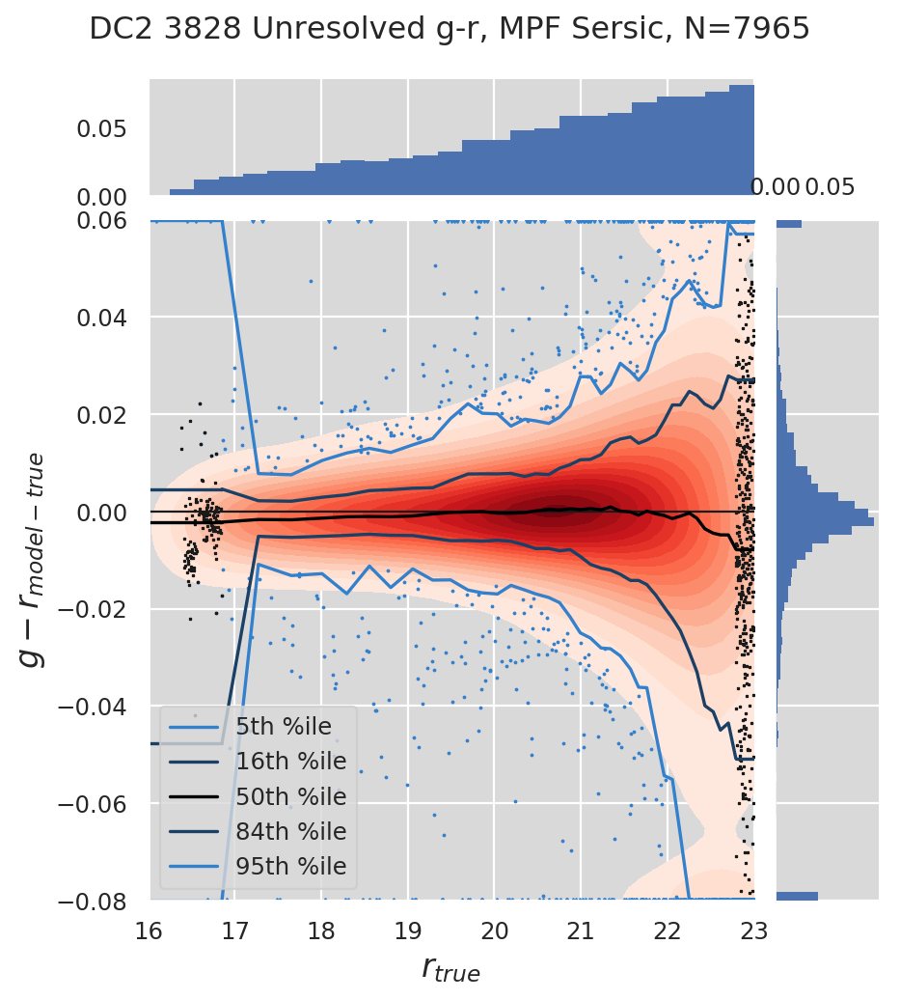

DC2 3828 Unresolved g-r, MPF Sersic(gri), N=8976


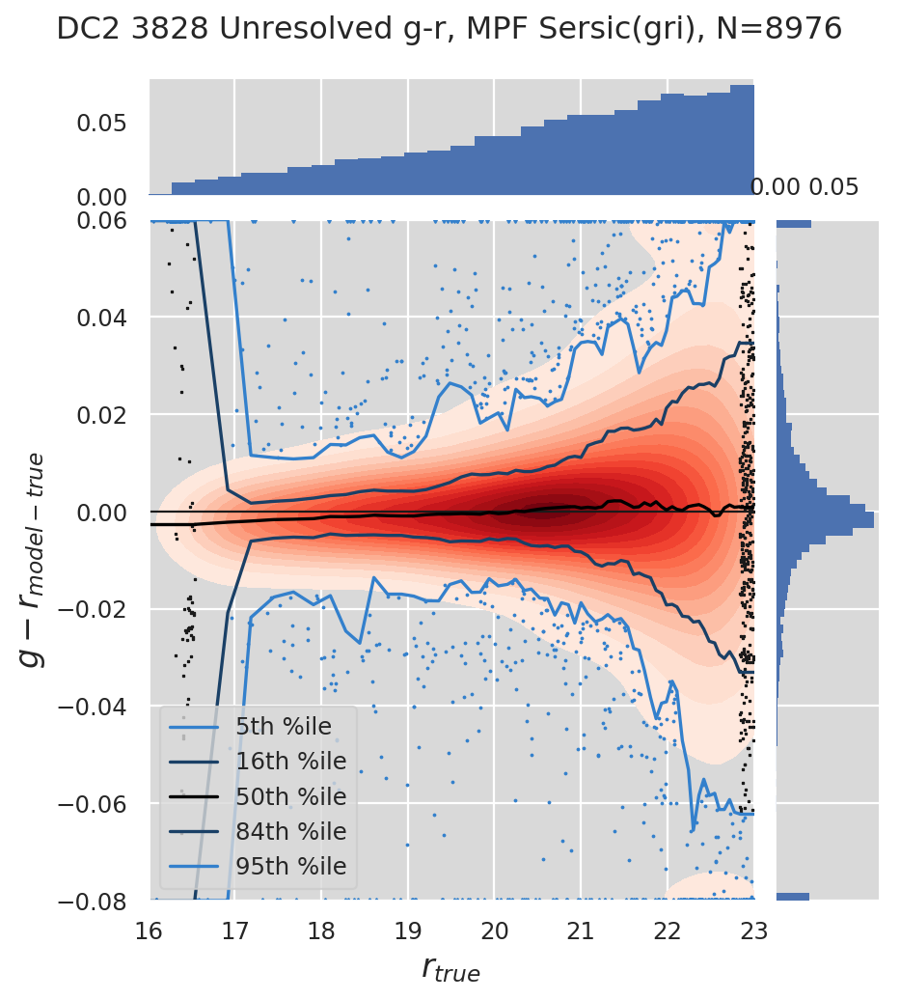

DC2 3828 Unresolved r-i, MPF Sersic, N=7939


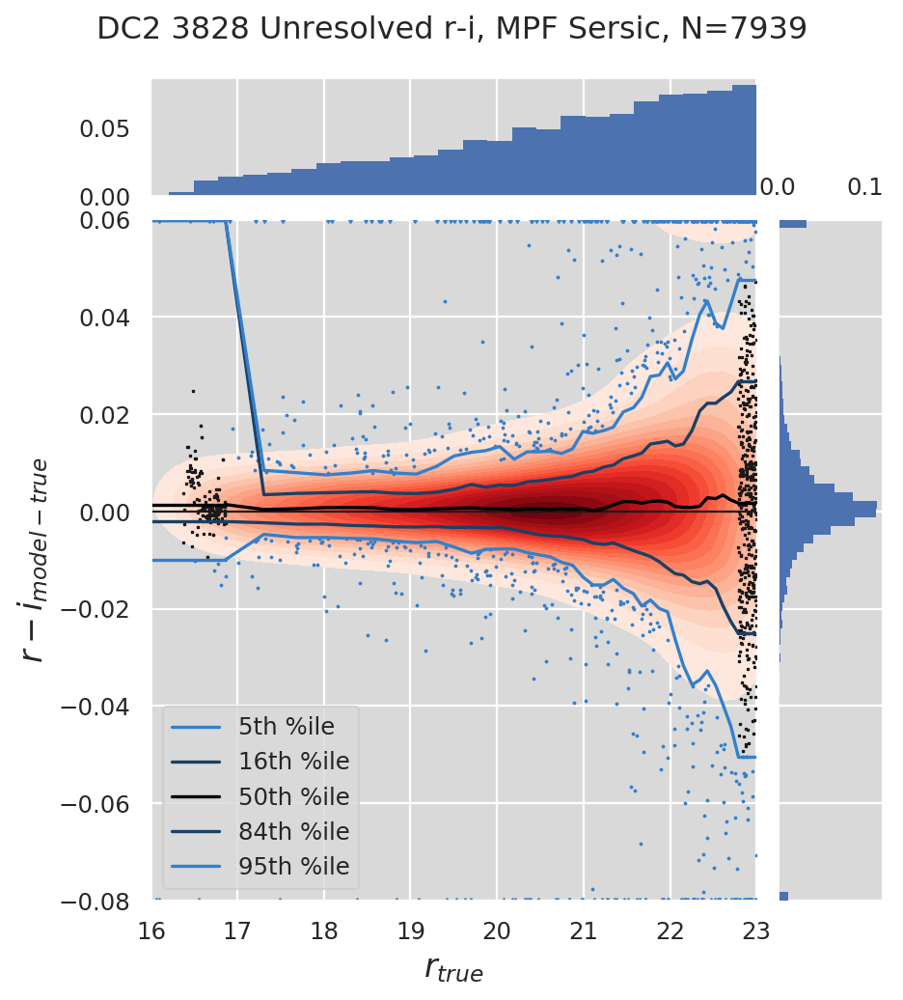

DC2 3828 Unresolved r-i, MPF Sersic(gri), N=8976


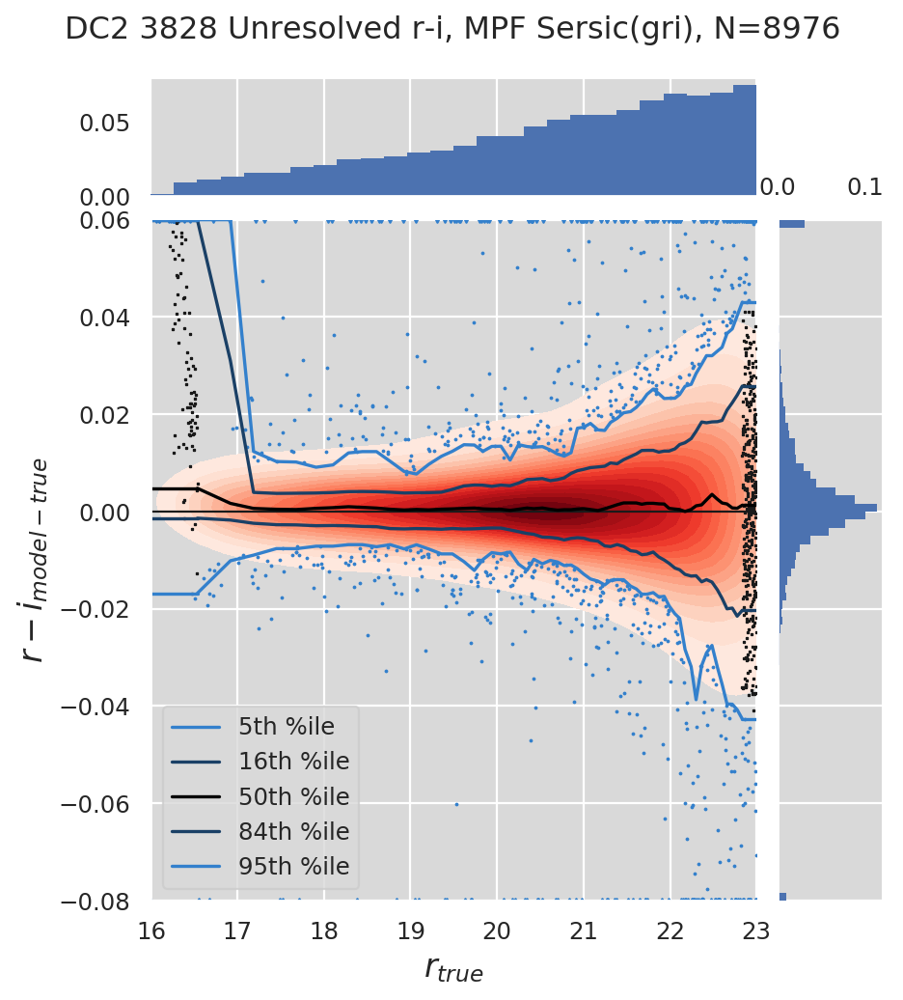

In [10]:
# Stars
plot_matches(
    cats, False, models_stars, filters_single, band_ref=band_ref, band_multi=band_multi,
    band_ref_multi=band_ref, mag_max=23, match_dist_asec=0.168,
    plot_compure=False, rematch=True, **args_type['unresolved'], **args
)

In [11]:
# Compare ngmix vs mpf g-r colours. They agree almost shockingly well for ~80-90% of sources.
cat_mb = cats[3828]['meas']['gri']
cat_good = cat_mb[cat_mb['detect_isPatchInner'] & cat_mb['detect_isPrimary']]
if get_ngmix:
    models_gmr = ['ngmix bd', 'MPF Sersic']
    gmr = {model: models[model].get_color_total(cat_good, 'g', 'r') for model in models_gmr}
    flux = models['ngmix bd'].get_mag_total(cat_good, 'r')
    good = flux < args_type['resolved']['limx'][1]
    for model in models_gmr:
        good &= np.isfinite(gmr[model])
    plotjoint_running_percentiles(
        flux[good],
        gmr['ngmix bd'][good] - gmr['MPF Sersic'][good],
        labelx='$r_{ngmix,bd}$', labely='${g-r}_{ngmix,bd}$ - ${g-r}_{mpf,Sersic}$',
        limx=args_type['resolved']['limx'], limy=(-0.2, 0.2),
        title='DC2 3828 All ngmix bd vs MPF Sersic (gri)',
        **args
    )

/software/lsstsw/stack_20200515/python/miniconda3-4.7.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:12: RuntimeWarning: divide by zero encountered in log10
  if sys.path[0] == '':
/software/lsstsw/stack_20200515/python/miniconda3-4.7.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in less


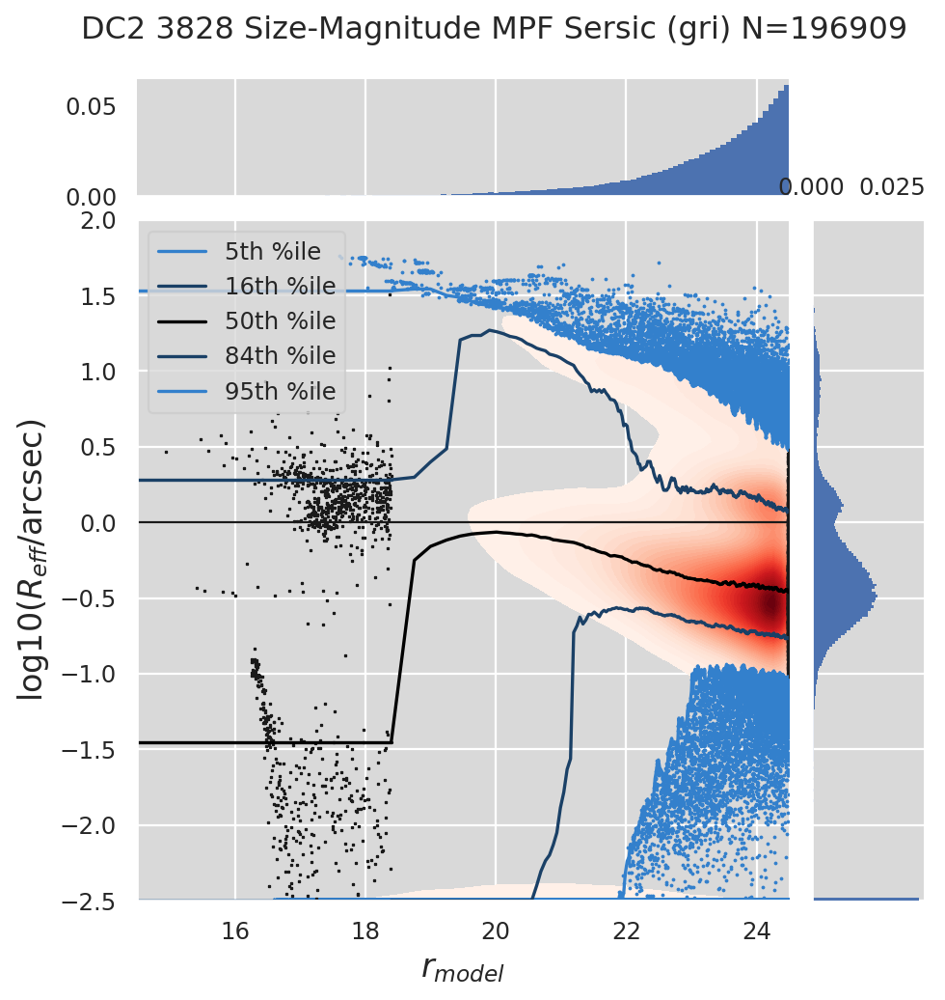

In [12]:
# r-band size mass for all objects
# TODO: Implement getting sizes from model objects
# TODO: Get forced sizes somehow
scale_pix = 0.2
sizes_model = {
    'stack CModel': np.log10(scale_pix*np.sqrt(0.5*(
        cat_good['modelfit_CModel_ellipse_xx'] + cat_good['modelfit_CModel_ellipse_yy'])))
} if get_cmodel_forced else {}
sizes_model['MPF Sersic'] = np.log10(
    scale_pix*np.sqrt(0.5*(
        cat_good['multiprofit_mg8serbpx_c1_sigma_x']**2 
        + cat_good['multiprofit_mg8serbpx_c1_sigma_y']**2))
)
if get_ngmix:
    sizes_model['ngmix bd']: np.log10(np.sqrt(0.5*cat_good['ngmix_bd_T']))
for name_model, sizes in sizes_model.items():
    is_ngmix = name_model.startswith('ngmix')
    mag = models[name_model].get_mag_total(cat_good, 'r')
    good = (mag < 24.5) & np.isfinite(sizes)
    plotjoint_running_percentiles(
        mag[good], sizes[good], limx=args_type['resolved']['limx'], limy=(-2.5, 2),
        labelx='$r_{model}$', labely='log10($R_{eff}$/arcsec)' if not is_ngmix else 'log10($\sigma$/arcsec)',
        title=f'DC2 3828 Size-Magnitude {name_model} ({band_multi}) N={np.sum(good)}',
        **args,
    )
    plt.show()

/software/lsstsw/stack_20200515/python/miniconda3-4.7.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in log10
/software/lsstsw/stack_20200515/python/miniconda3-4.7.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/software/lsstsw/stack_20200515/python/miniconda3-4.7.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in less


mpf sersic t_total=861368.140828371


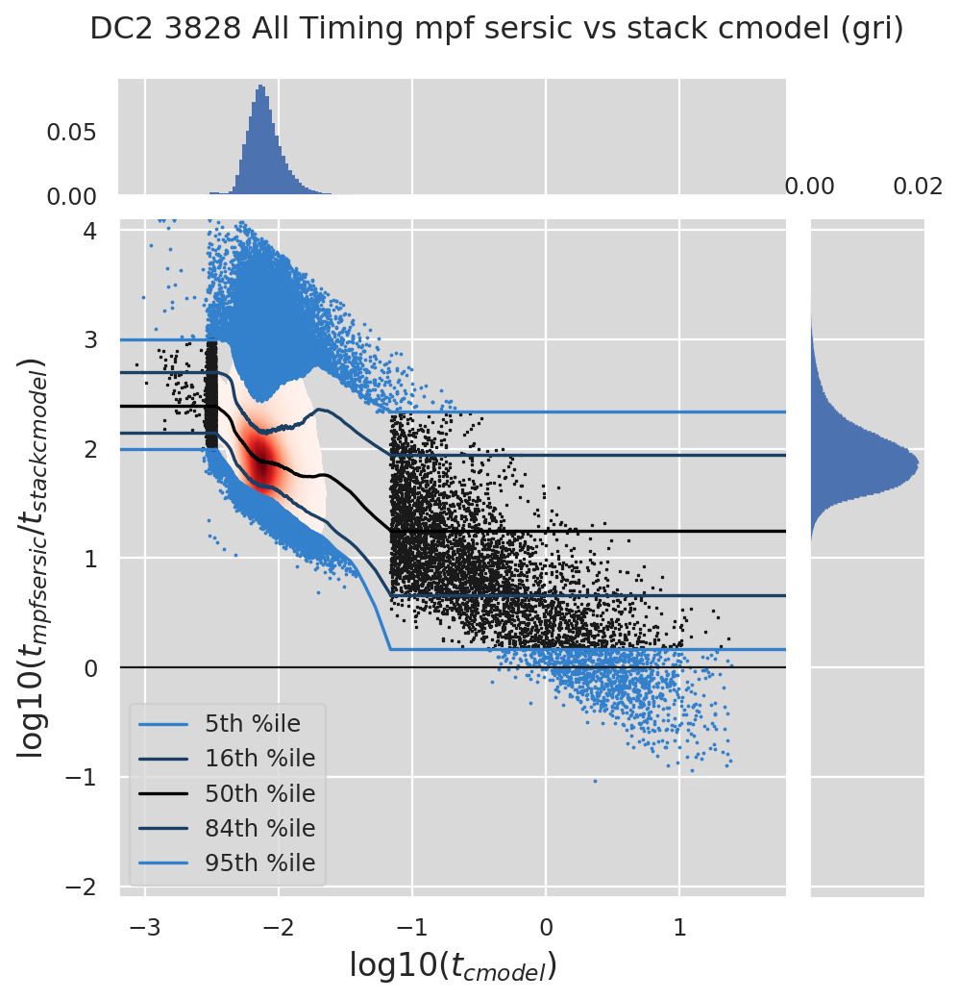

stack cmodel t_total=13790.274242000001


In [13]:
# Timing ngmix and MultiProFit
cat_mb = cats[3828]['meas'][band_multi]
times = {
    'mpf sersic': np.log10(cat_mb['multiprofit_gausspx_time'] + cat_mb['multiprofit_mg8expgpx_time']
                       + cat_mb['multiprofit_mg8devepx_time'] + cat_mb['multiprofit_mg8serbpx_time']),
}
if get_ngmix:
    times['ngmix bd'] = np.log10(cat_mb['ngmix_time'])

model_ref = 'stack cmodel'
times_ref = None
for band in band_multi:
    cat = cats[3828]['meas'][band]
    times_cm = cat['modelfit_CModel_exp_time'] + cat['modelfit_CModel_dev_time'] + cat['modelfit_CModel_initial_time']
    if times_ref is None:
        times_ref = times_cm
    else:
        times_ref += times_cm
times[model_ref] = np.log10(times_cm)

lim_time = (-3.2, 1.8)
lim_y = (-2.1, 4.1)
# ha ha, how negative
good_times = None
for times_model in times.values():
    good_time = (times_model > lim_time[0]) & (times_model < lim_time[1])
    if good_times is None:
        good_times = good_time
    else:
        good_times &= good_time
       
times_ref = times[model_ref][good_times]
for model, times_model in times.items():
    print(f'{model} t_total={np.sum(10**times_model[good_times])}')
    if model != model_ref:
        plotjoint_running_percentiles(
            times_ref, times_model[good_times] - times_ref,
            limx=lim_time, limy=lim_y,
            labelx='log10($t_{cmodel}$)', labely=f'log10($t_{{{model}}}/t_{{{model_ref}}}$)',
            title=f'DC2 3828 All Timing {model} vs {model_ref} ({band_multi})',
            scatterleft=True, scatterright=True,
        )
        plt.show()